In [17]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr, wilcoxon
import plotly.express as px
import plotly.graph_objects as go
import nbformat

from scipy.stats import ttest_ind, f_oneway
import statsmodels.api as sm
import statsmodels.formula.api as smf
from matplotlib_venn import venn2
import os
import scipy.cluster.hierarchy as sch
from scipy.stats import spearmanr, linregress,kendalltau

In [18]:
cell_types=["Tcells","Bcells",	"Fibroblasts", "NKcells", "Macrophages","Mast cells", "DCs", "other", "Endothelial cells"]
target_CAFs=["FAP", "PDGFRA", "PDGFRB", "S100A4", "LRRC15", "IL1R1", "IL1R2","SMO"]
target_receptors_molecules=["TGFB1","TGFB2","TGFB3", "TGFBR1","TGFBR2","TGFBR3","IL6", "IL6R", "IL10RA","IL10RB", "CXCL8", "CXCL12", 
 "CCR5", "CXCR2", "CXCR1", "CXCR4", "CXCL10","CXCL9","HGF", "MET", "FGF1","FGF2","FGF7","FGF10", "FGFR1","FGFR2","FGFR3","FGFR4","IL11","HAS1","HAS2","HYAL1","HYAL2"]

In [19]:
fibr_gene_expression_modified=pd.read_csv("/Users/nikamikhailava/Desktop/batch_merged/filtered_fibroblasts_gene_exp_transposed_w_clinical.csv")
clinical_data=pd.read_csv("/Users/nikamikhailava/Desktop/batch_merged/9_eyemt_patient_clinical_data_new.csv")
fibr_gene_expression_modified["Patient"]=fibr_gene_expression_modified["Sample"].str.extract(r'(S\d+)')
fibr_gene_expression_modified=fibr_gene_expression_modified.merge(clinical_data[["Patient","PFS_quartile_b12"]],on="Patient", how="left")
fibr_gene_expression_modified=fibr_gene_expression_modified.merge(clinical_data[["Patient","OS_quartile_b12"]],on="Patient", how="left")
fibr_gene_expression_modified.head(5)

,dcc_filename,SAMD11,NOC2L,KLHL17,PLEKHN1,PERM1,HES4,ISG15,AGRN,RNF223,...,RABL2B,Sample,PFS_quartile,OS_quartile,BRCA_status,HRP_status,Segment,Patient,PFS_quartile_b12,OS_quartile_b12
0,DSP-1001660016604-A-A02.dcc,1.718431,2.137428,1.836881,1.997698,0.161226,2.480789,4.364810,2.270061,0.033787,...,2.171023,S130_iOme,1,1,0.0,1.0,stroma,S130,2.0,1.0
1,DSP-1001660016604-A-A04.dcc,1.622100,2.027326,1.737519,1.901971,0.158211,2.375319,5.534481,2.163770,0.033655,...,2.073686,S130_iOme,1,1,0.0,1.0,stroma,S130,2.0,1.0
2,DSP-1001660016604-A-A05.dcc,1.427961,1.505719,1.830641,1.348903,0.165076,2.201253,5.497989,2.271254,0.033957,...,1.018083,S130_iOme,1,1,0.0,1.0,tumor,S130,2.0,1.0
3,DSP-1001660016604-A-A07.dcc,1.353614,1.787912,1.868598,1.631783,0.164922,2.126467,6.245903,2.308907,0.033950,...,1.239250,S130_iOme,1,1,0.0,1.0,tumor,S130,2.0,1.0
4,DSP-1001660016604-A-A08.dcc,1.829375,1.602863,1.291572,1.448092,0.164608,1.941802,3.836590,1.731314,0.033936,...,1.623058,S130_iOme,1,1,0.0,1.0,stroma,S130,2.0,1.0


In [20]:
df_cell_abundance = pd.read_csv("/Users/nikamikhailava/Desktop/batch_merged/batch_merged_bp_res_mid_lvl_ct_ct_fraction.csv")
fibr_gene_expression_cell_abundance=fibr_gene_expression_modified.merge(df_cell_abundance, on="dcc_filename", how="left")
fibr_gene_expression_cell_abundance.head(5)

,dcc_filename,SAMD11,NOC2L,KLHL17,PLEKHN1,PERM1,HES4,ISG15,AGRN,RNF223,...,Endothelial cells,Roi,Segment_y,Sample_y,NACT_status,Annotation_cell,Roi.1,Segment_geomx,Patient_y,Site
0,DSP-1001660016604-A-A02.dcc,1.718431,2.137428,1.836881,1.997698,0.161226,2.480789,4.364810,2.270061,0.033787,...,0.028128,1,stroma,S130_iOme,post,CD8_Iba1,NaN,tsi,S130,Omentum
1,DSP-1001660016604-A-A04.dcc,1.622100,2.027326,1.737519,1.901971,0.158211,2.375319,5.534481,2.163770,0.033655,...,0.029949,2,stroma,S130_iOme,post,CD8_CD11_Iba1,NaN,tsi,S130,Omentum
2,DSP-1001660016604-A-A05.dcc,1.427961,1.505719,1.830641,1.348903,0.165076,2.201253,5.497989,2.271254,0.033957,...,0.029244,2,tumor,S130_iOme,post,CD8_CD11_Iba1,NaN,tsi,S130,Omentum
3,DSP-1001660016604-A-A07.dcc,1.353614,1.787912,1.868598,1.631783,0.164922,2.126467,6.245903,2.308907,0.033950,...,0.029367,3,tumor,S130_iOme,post,CD4_CD8_CD11_Iba1,NaN,tsi,S130,Omentum
4,DSP-1001660016604-A-A08.dcc,1.829375,1.602863,1.291572,1.448092,0.164608,1.941802,3.836590,1.731314,0.033936,...,0.029515,4,stroma,S130_iOme,post,CD4_CD11,NaN,tsi,S130,Omentum


For the stroma

Spearman correlation for FAP vs T-cells: -0.16


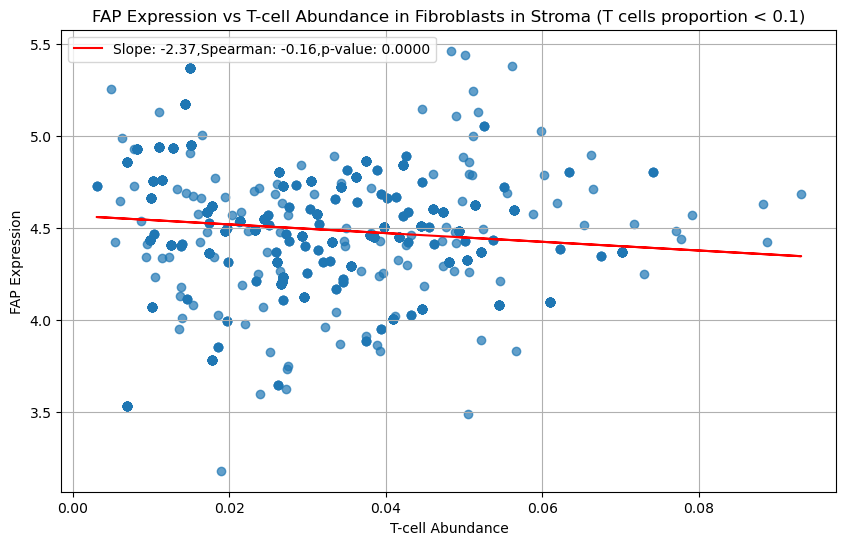

Spearman correlation for PDGFRA vs T-cells: 0.13


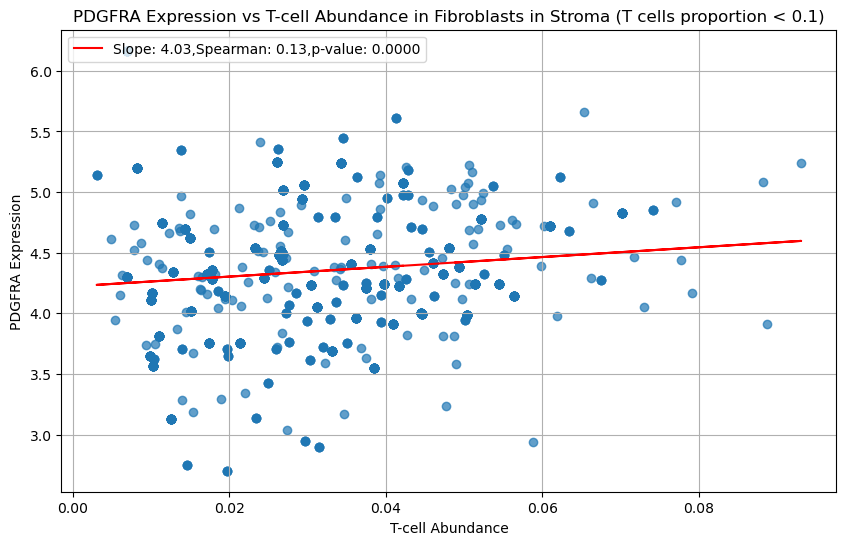

Spearman correlation for PDGFRB vs T-cells: -0.13


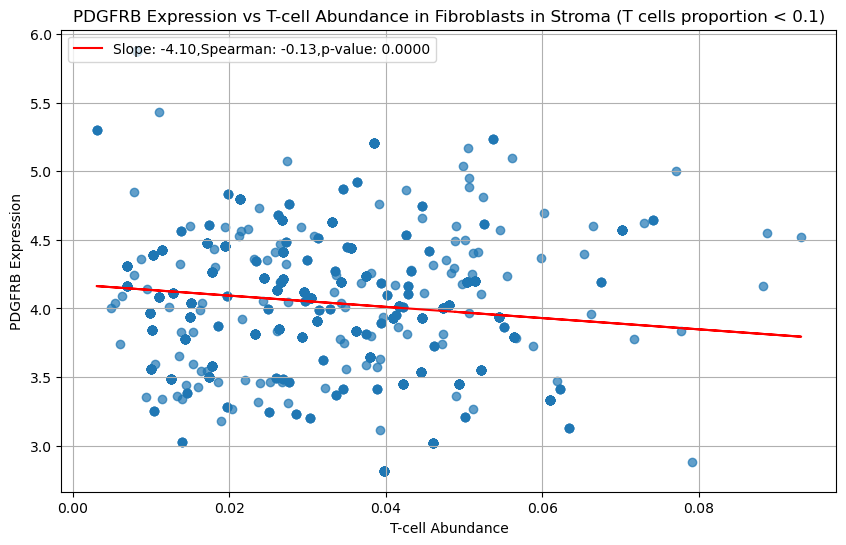

Spearman correlation for S100A4 vs T-cells: -0.19


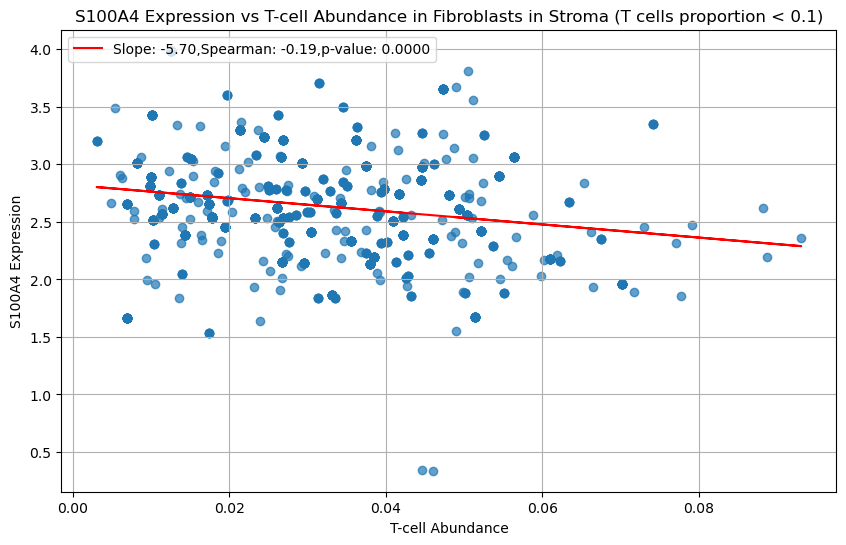

Spearman correlation for LRRC15 vs T-cells: -0.03


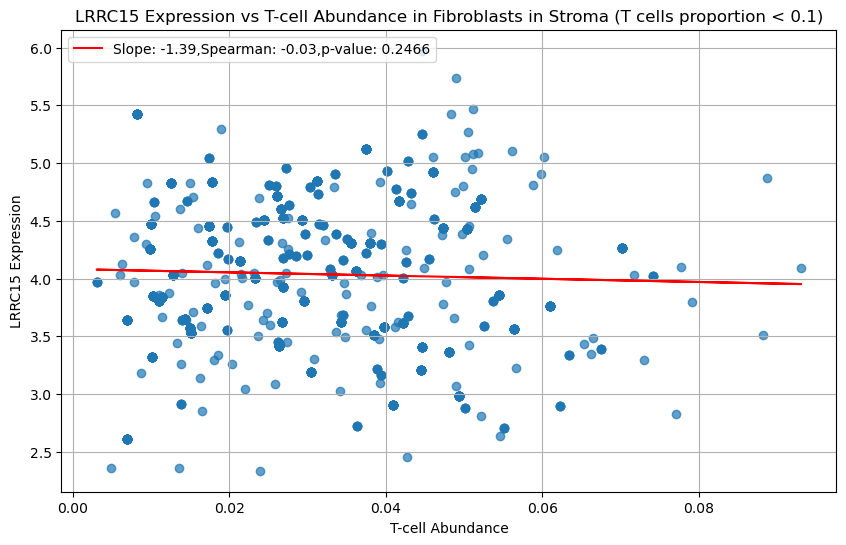

Spearman correlation for IL1R1 vs T-cells: 0.03


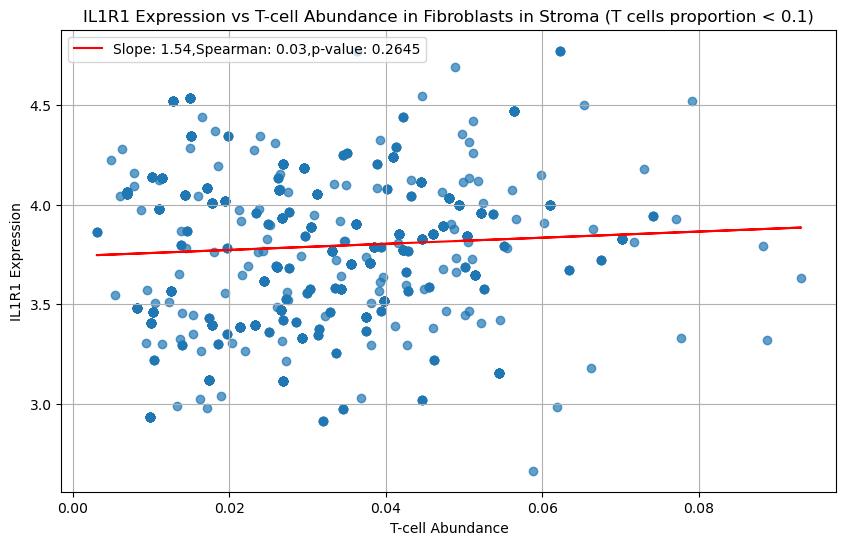

Spearman correlation for IL1R2 vs T-cells: -0.12


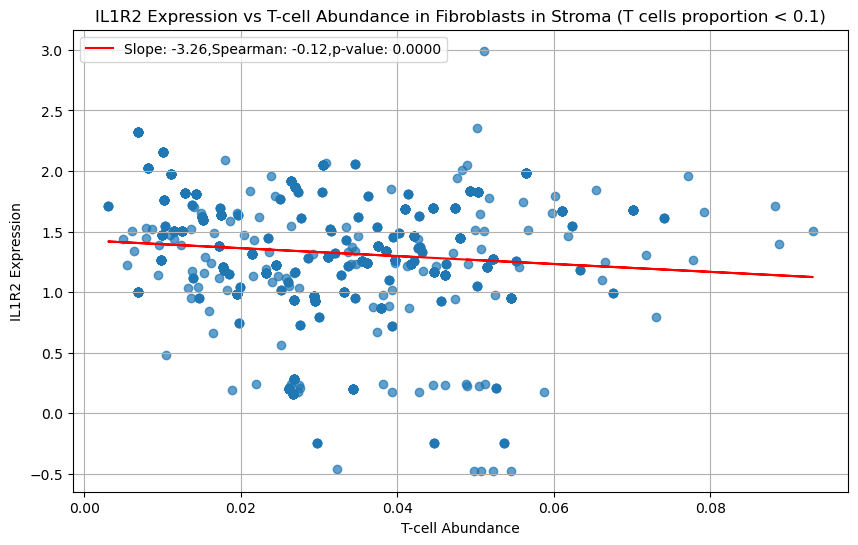

Spearman correlation for SMO vs T-cells: -0.12


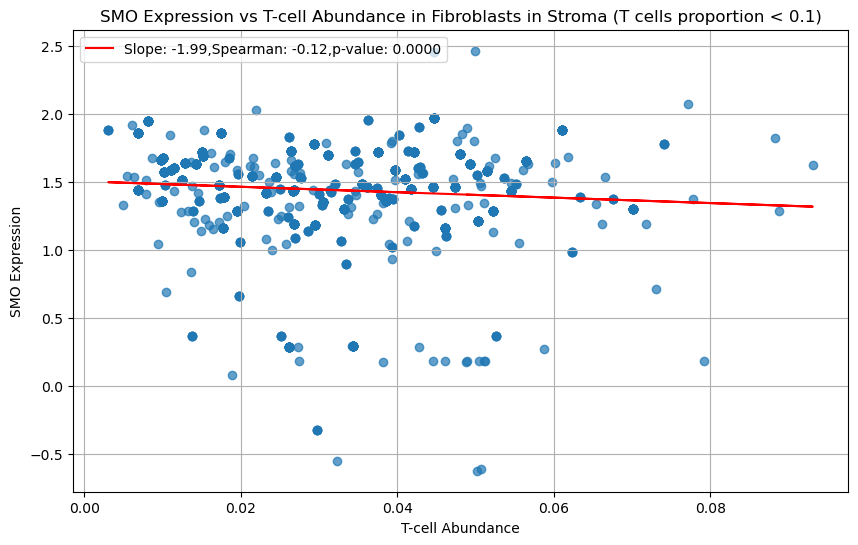

In [21]:
fibr_gene_expression_cell_abundance_stroma=fibr_gene_expression_cell_abundance[fibr_gene_expression_cell_abundance["Segment_y"]=="stroma"]

for gene in target_CAFs:
    # Filter rows where T-cell abundance is less than 0.1
    filtered_data = fibr_gene_expression_cell_abundance_stroma[fibr_gene_expression_cell_abundance_stroma["Tcells"] < 0.1]
    #filtered_data= fibr_gene_expression_cell_abundance_stroma
    # Proceed only if there are enough data points
    if not filtered_data.empty:
        plt.figure(figsize=(10, 6))

        # Scatter plot
        plt.scatter(filtered_data["Tcells"], filtered_data[gene], alpha=0.7)

        # Spearman correlation
        pearson_corr, _ = pearsonr(filtered_data["Tcells"], filtered_data[gene])
        spearman_corr, pvalue = spearmanr(filtered_data["Tcells"], filtered_data[gene])
        kendall_corr, _ = kendalltau(filtered_data["Tcells"], filtered_data[gene])
        print(f"Spearman correlation for {gene} vs T-cells: {spearman_corr:.2f}")

        # Linear regression
        slope, intercept, _, _, _ = linregress(filtered_data["Tcells"], filtered_data[gene])
        regression_line = slope * filtered_data["Tcells"] + intercept
        plt.plot(filtered_data["Tcells"], regression_line, color='red',label=f'Slope: {slope:.2f},Spearman: {spearman_corr:.2f},p-value: {pvalue:.4f}')


        # Plot formatting
        plt.title(f"{gene} Expression vs T-cell Abundance in Fibroblasts in Stroma (T cells proportion < 0.1)")
        plt.xlabel("T-cell Abundance")
        plt.ylabel(f"{gene} Expression")
        plt.grid()
        plt.legend(loc='upper left')
        plt.show()


8.869350652265311e-05


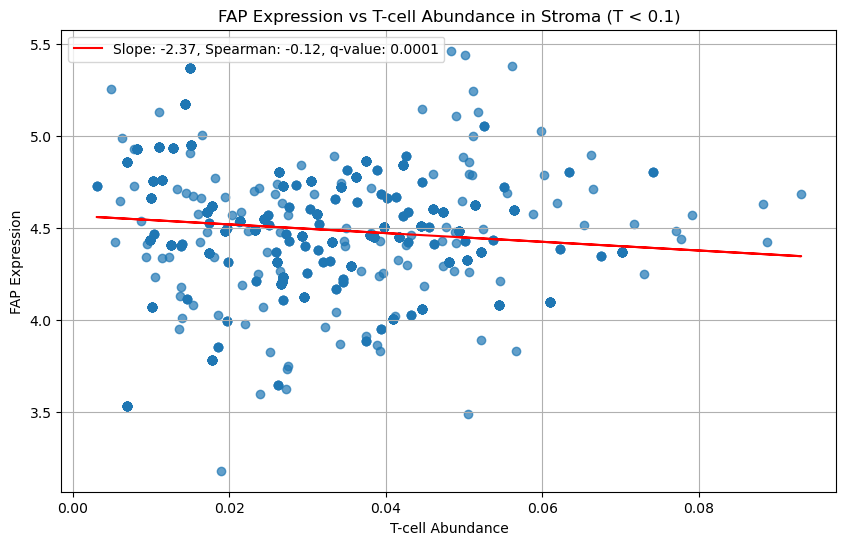

8.438917138129239e-05


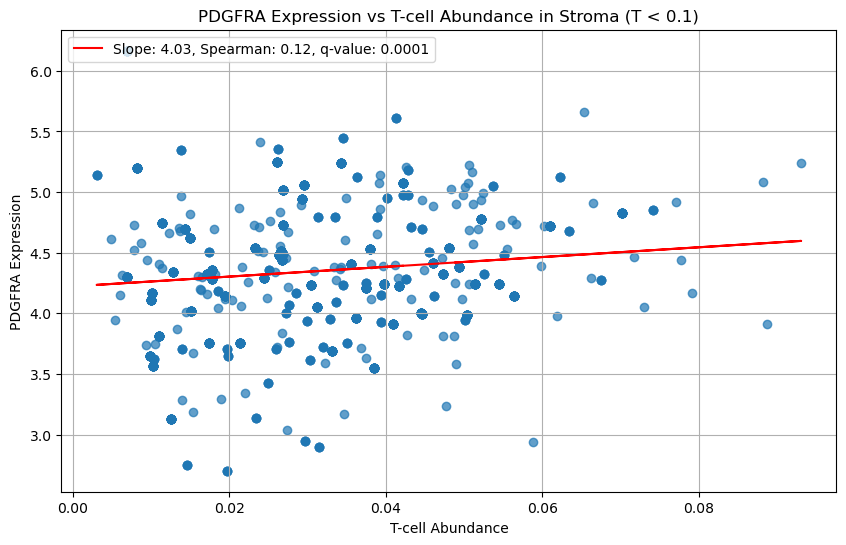

1.9625001556977416e-05


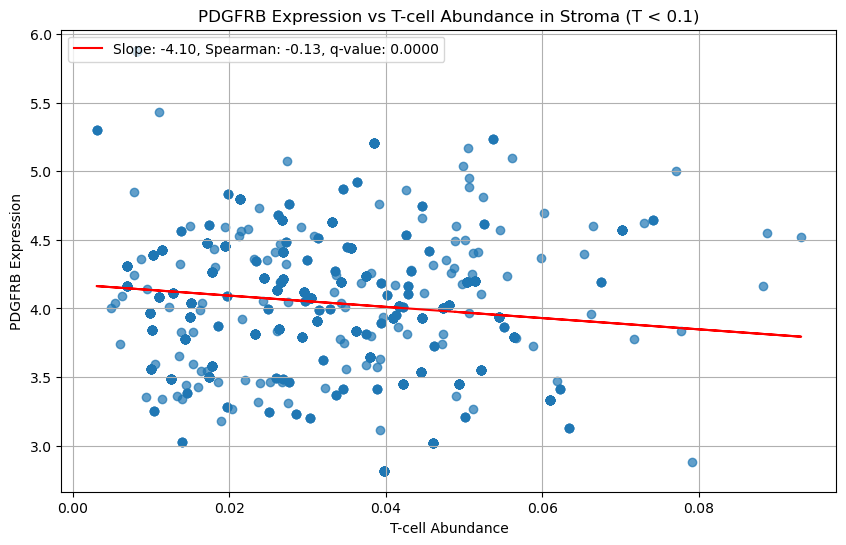

1.2818331812971567e-11


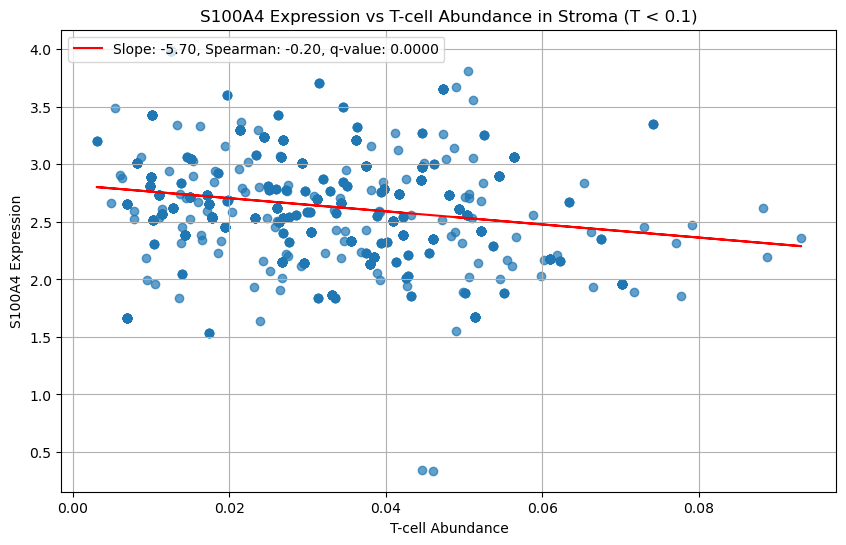

0.20125163678372107


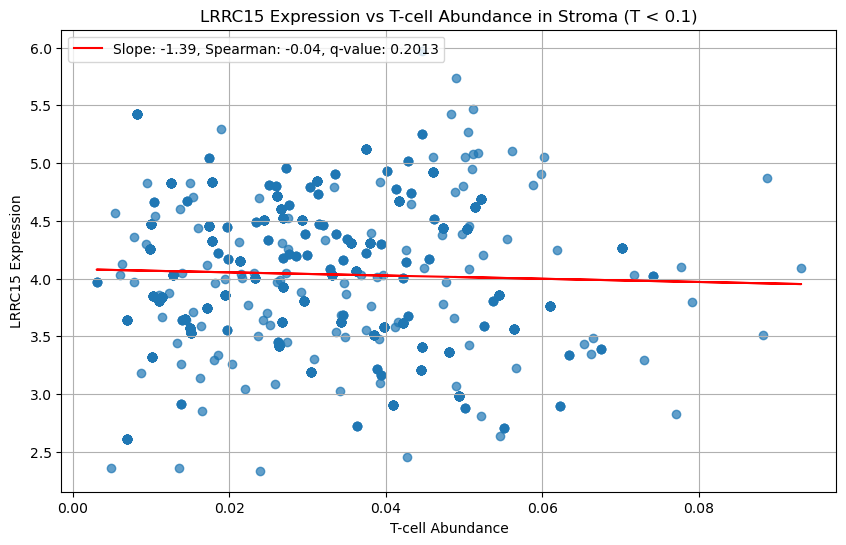

0.021652838376507975


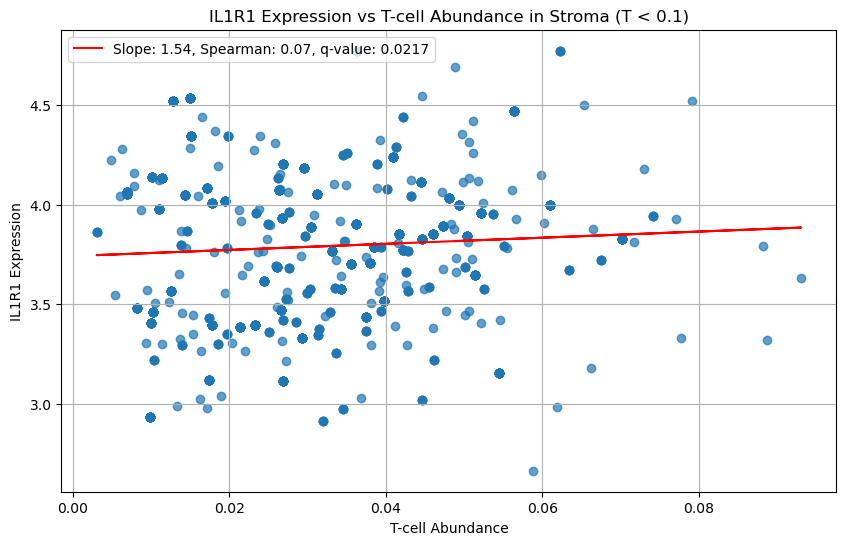

0.0004027469728163977


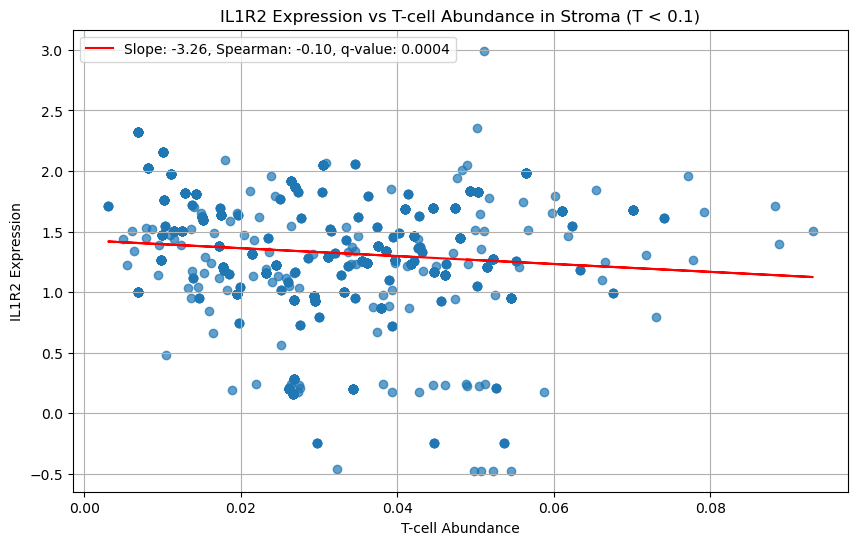

0.0033343701006920885


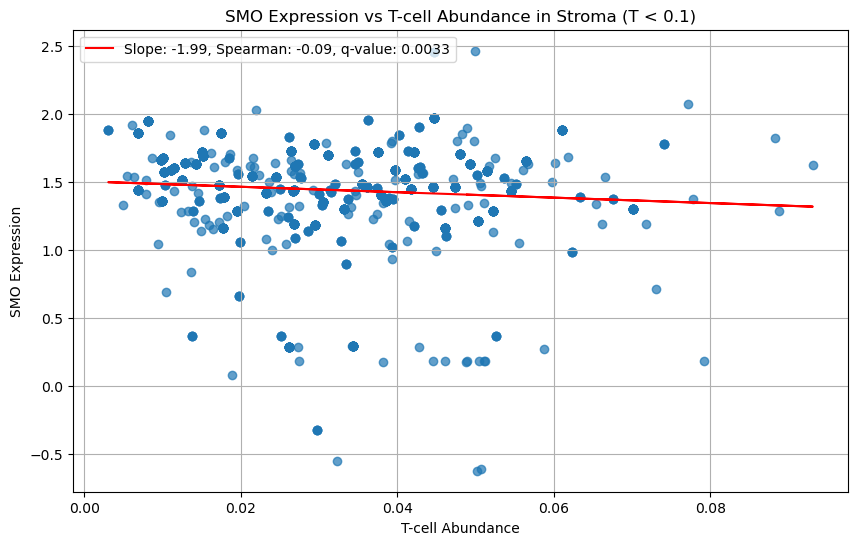

In [22]:
from scipy.stats import spearmanr, linregress, pearsonr, kendalltau
from statsmodels.stats.multitest import multipletests
import matplotlib.pyplot as plt

pvals = []
genes_with_stats = []

# Step 1: Collect all p-values first
for gene in target_CAFs:
    filtered_data = fibr_gene_expression_cell_abundance_stroma[fibr_gene_expression_cell_abundance_stroma["Tcells"] < 0.1]
    
    if not filtered_data.empty:
        spearman_corr, pvalue = pearsonr(filtered_data["Tcells"], filtered_data[gene])
        pvals.append(pvalue)
        genes_with_stats.append({"gene": gene, "rho": spearman_corr, "p": pvalue})

# Step 2: Apply FDR correction
pvals_corrected = multipletests(pvals, alpha=0.05, method='fdr_bh')
qvals = pvals_corrected[1]  # This is the list of q-values

# Step 3: Visualize and show q-values
for i, stats in enumerate(genes_with_stats):
    gene = stats["gene"]
    rho = stats["rho"]
    p = stats["p"]
    q = qvals[i]

    filtered_data = fibr_gene_expression_cell_abundance_stroma[fibr_gene_expression_cell_abundance_stroma["Tcells"] < 0.1]

    plt.figure(figsize=(10, 6))
    plt.scatter(filtered_data["Tcells"], filtered_data[gene], alpha=0.7)

    # Linear regression
    slope, intercept, _, _, _ = linregress(filtered_data["Tcells"], filtered_data[gene])
    regression_line = slope * filtered_data["Tcells"] + intercept
    print(q)
    plt.plot(filtered_data["Tcells"], regression_line, color='red',
             label=f"Slope: {slope:.2f}, Spearman: {rho:.2f}, q-value: {q:.4f}")

    plt.title(f"{gene} Expression vs T-cell Abundance in Stroma (T < 0.1)")
    plt.xlabel("T-cell Abundance")
    plt.ylabel(f"{gene} Expression")
    plt.grid()
    plt.legend(loc='upper left')
    plt.show()


Spearman correlation for FAP vs T-cells: 0.13


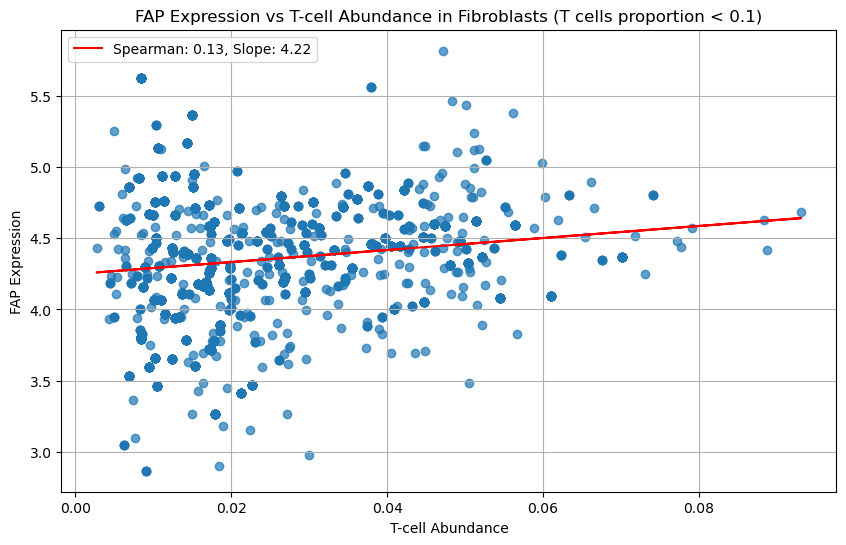

Spearman correlation for PDGFRA vs T-cells: 0.33


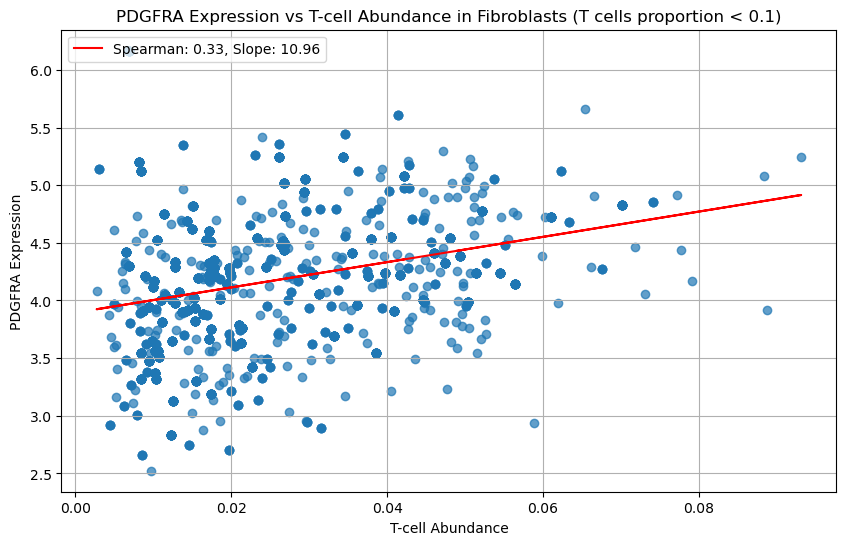

Spearman correlation for PDGFRB vs T-cells: 0.06


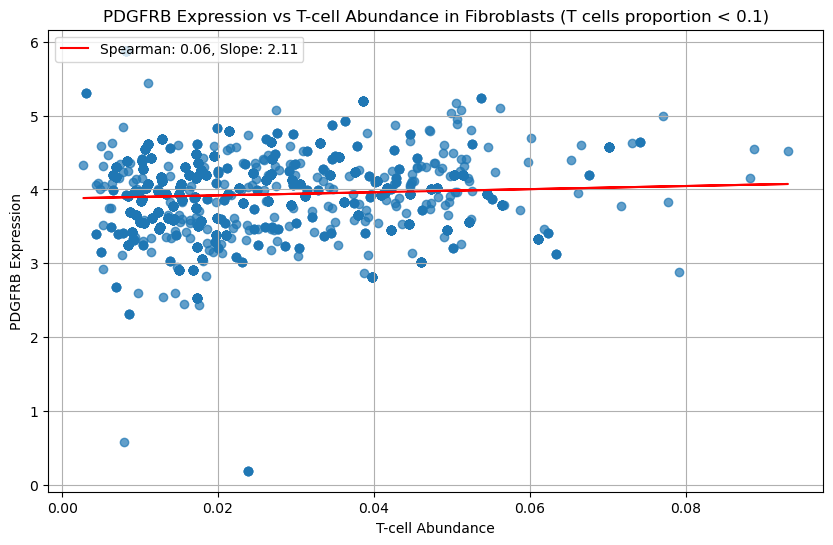

Spearman correlation for S100A4 vs T-cells: 0.05


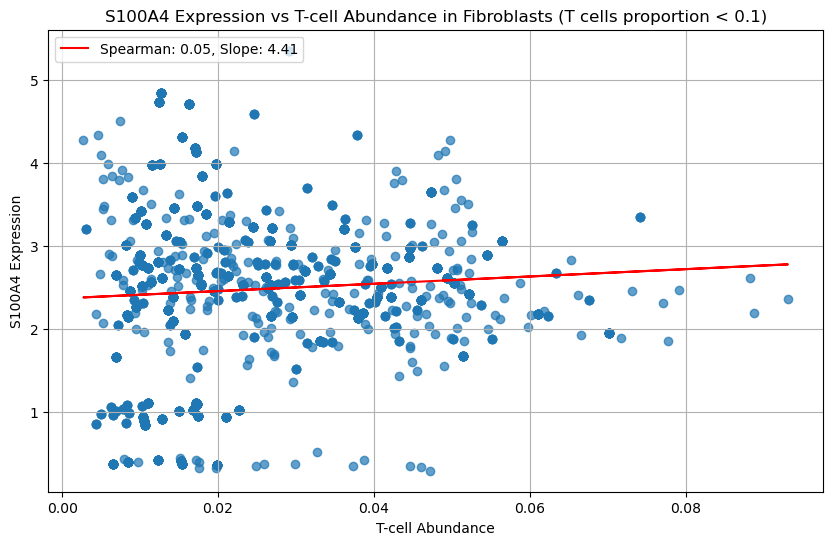

Spearman correlation for LRRC15 vs T-cells: -0.09


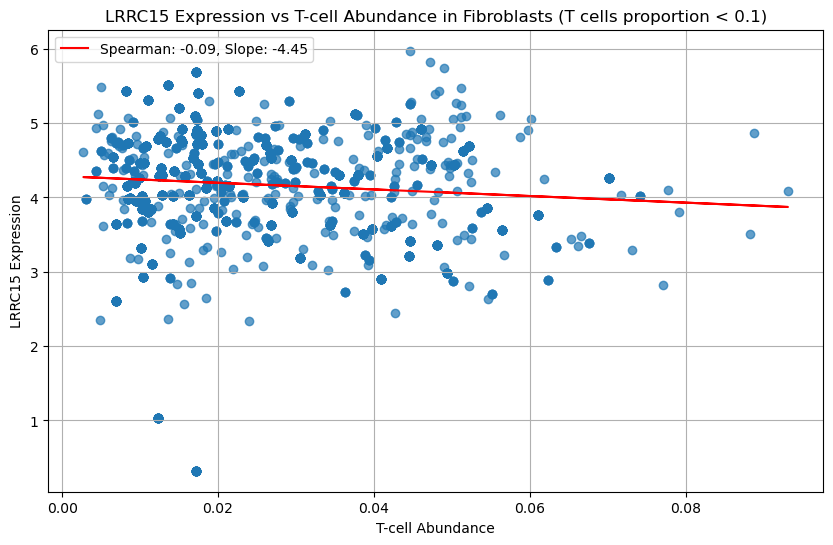

Spearman correlation for IL1R1 vs T-cells: 0.06


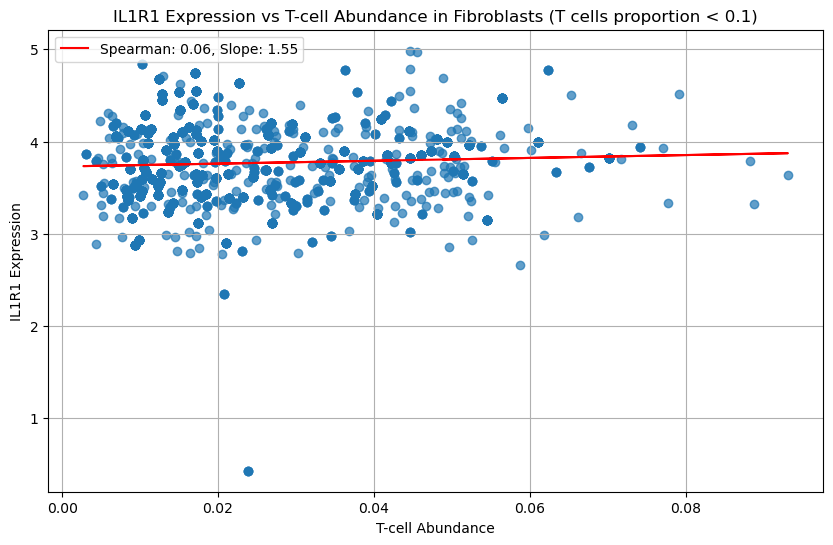

Spearman correlation for IL1R2 vs T-cells: 0.23


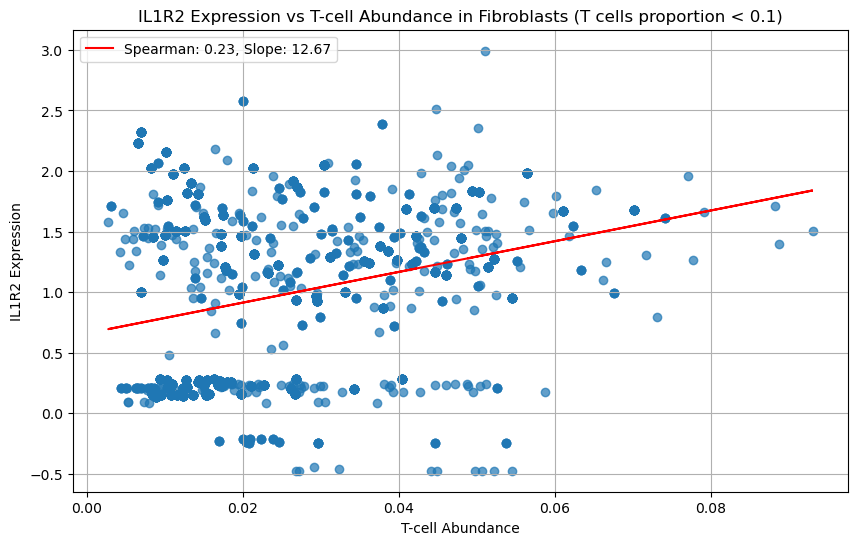

Spearman correlation for SMO vs T-cells: 0.28


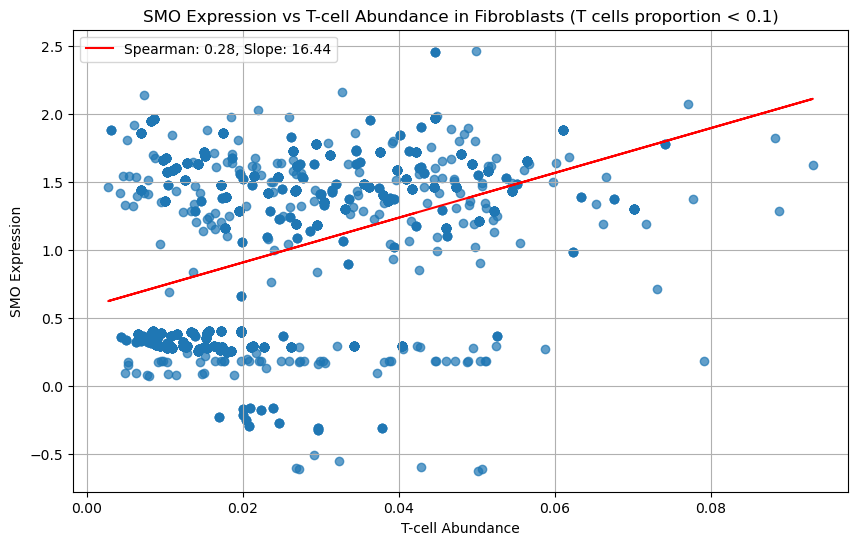

In [23]:

for gene in target_CAFs:
    # Filter rows where T-cell abundance is less than 0.1
    filtered_data = fibr_gene_expression_cell_abundance[fibr_gene_expression_cell_abundance["Tcells"] < 0.1]
    #filtered_data= fibr_gene_expression_cell_abundance_stroma
    # Proceed only if there are enough data points
    if not filtered_data.empty:
        plt.figure(figsize=(10, 6))

        # Scatter plot
        plt.scatter(filtered_data["Tcells"], filtered_data[gene], alpha=0.7)

        # Spearman correlation
        spearman_corr, _ = spearmanr(filtered_data["Tcells"], filtered_data[gene])
        print(f"Spearman correlation for {gene} vs T-cells: {spearman_corr:.2f}")

        # Linear regression
        slope, intercept, _, _, _ = linregress(filtered_data["Tcells"], filtered_data[gene])
        regression_line = slope * filtered_data["Tcells"] + intercept
        plt.plot(filtered_data["Tcells"], regression_line, color='red',
                 label=f'Spearman: {spearman_corr:.2f}, Slope: {slope:.2f}')

        # Plot formatting
        plt.title(f"{gene} Expression vs T-cell Abundance in Fibroblasts (T cells proportion < 0.1)")
        plt.xlabel("T-cell Abundance")
        plt.ylabel(f"{gene} Expression")
        plt.grid()
        plt.legend(loc='upper left')
        plt.show()

Spearman correlation for FAP vs T-cells: 0.01


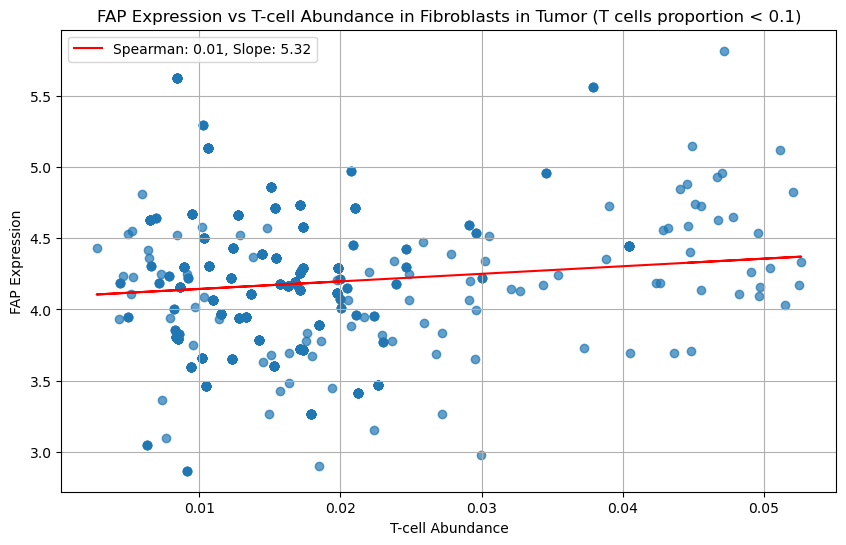

Spearman correlation for PDGFRA vs T-cells: 0.24


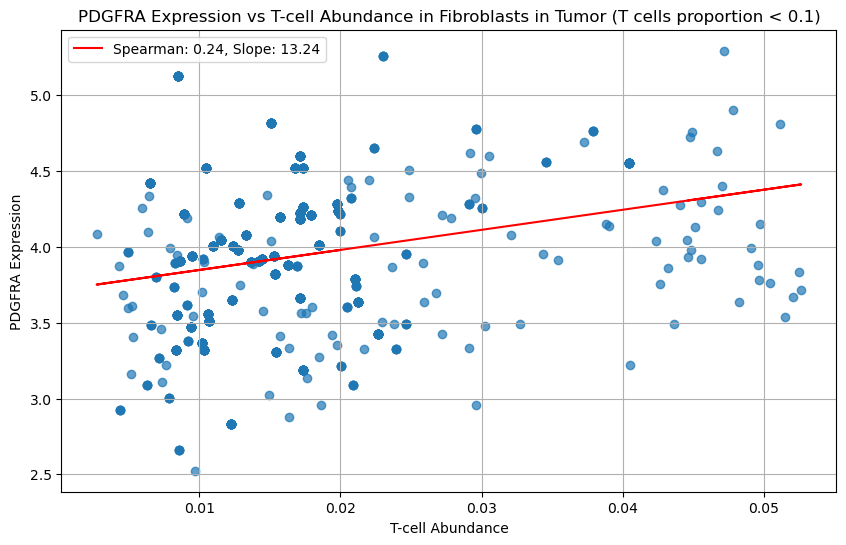

Spearman correlation for PDGFRB vs T-cells: -0.02


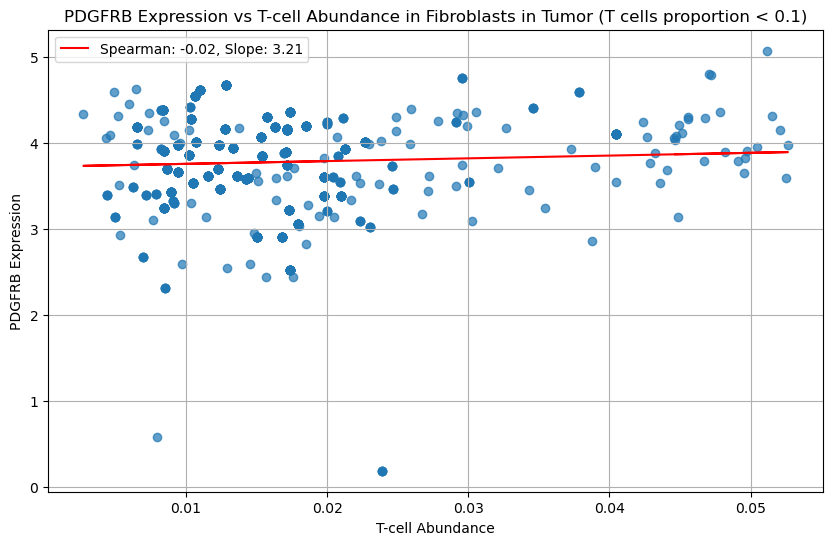

Spearman correlation for S100A4 vs T-cells: 0.13


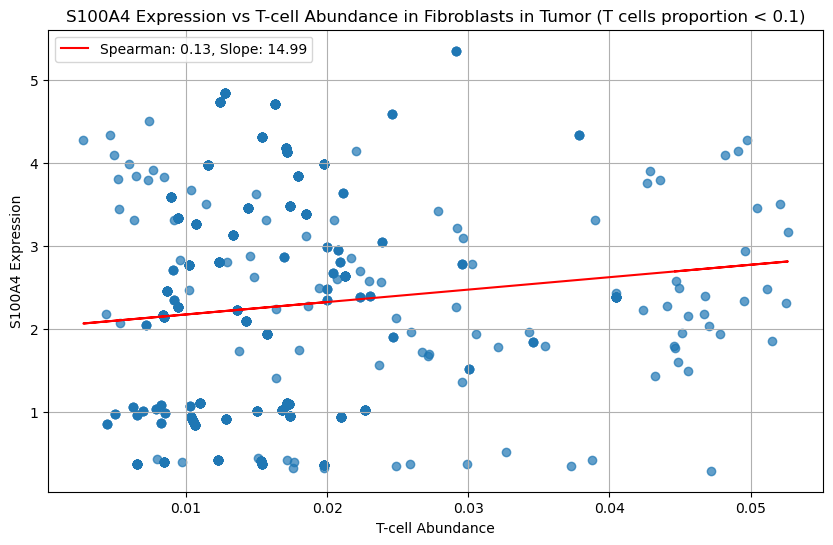

Spearman correlation for LRRC15 vs T-cells: 0.20


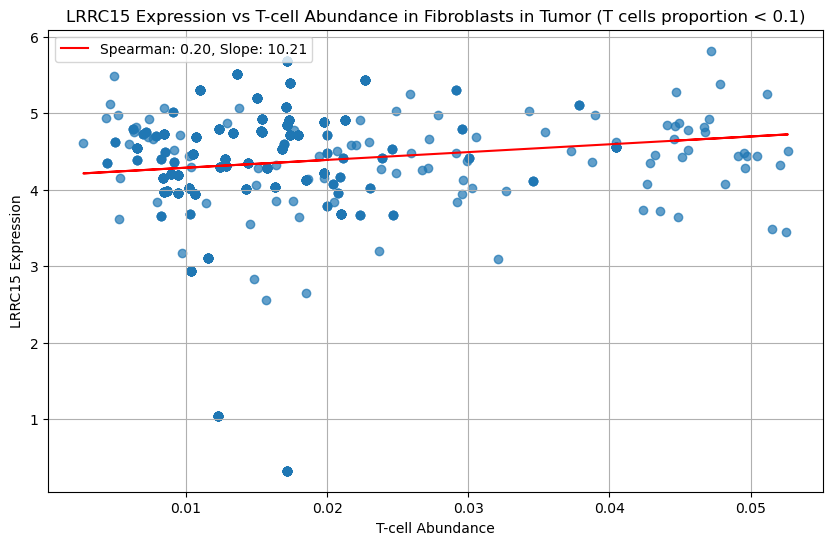

Spearman correlation for IL1R1 vs T-cells: 0.08


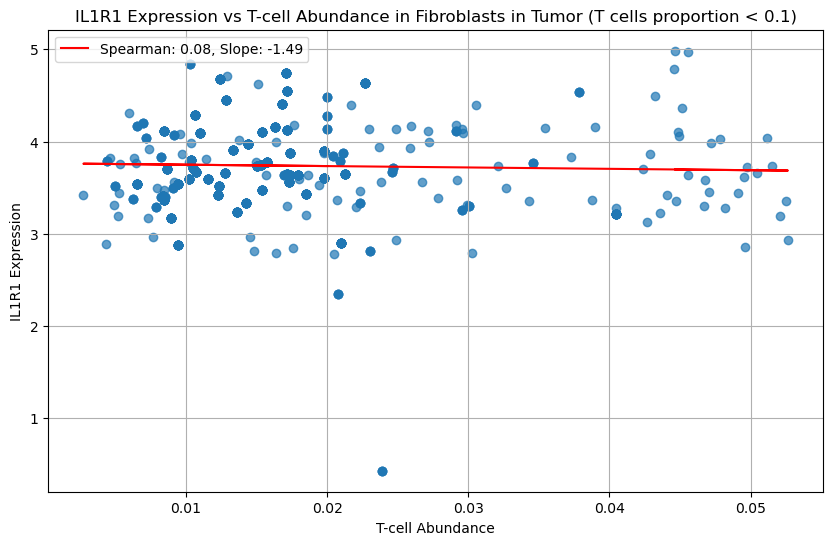

Spearman correlation for IL1R2 vs T-cells: 0.21


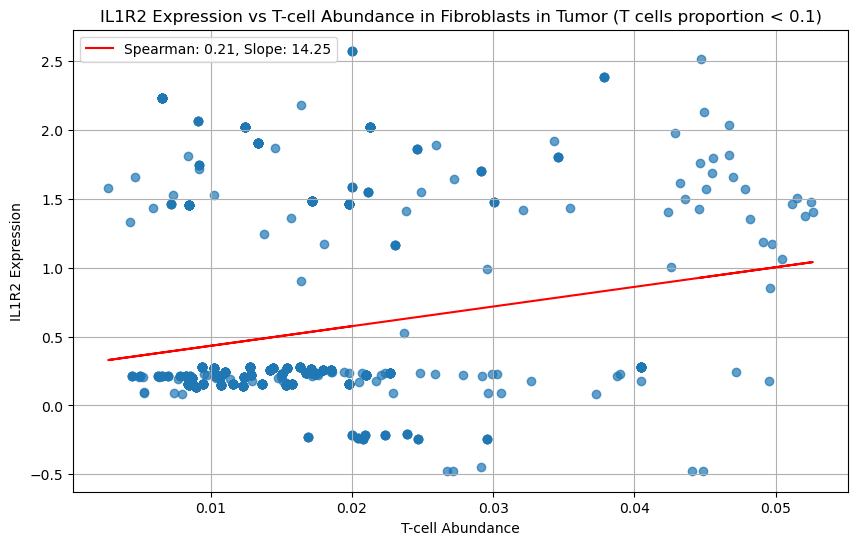

Spearman correlation for SMO vs T-cells: -0.21


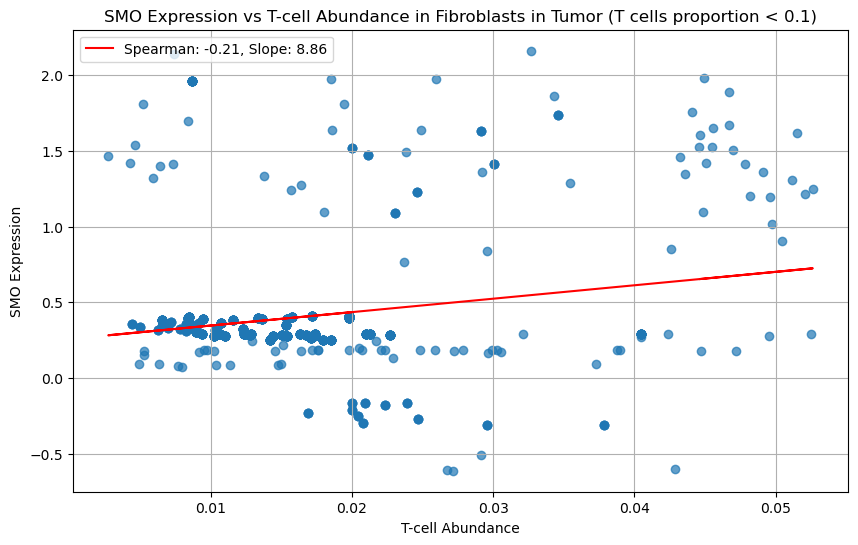

In [24]:
fibr_gene_expression_cell_abundance_tumor=fibr_gene_expression_cell_abundance[fibr_gene_expression_cell_abundance["Segment_y"]=="tumor"]

for gene in target_CAFs:
    # Filter rows where T-cell abundance is less than 0.1
    filtered_data = fibr_gene_expression_cell_abundance_tumor[fibr_gene_expression_cell_abundance_tumor["Tcells"] < 0.1]
    #filtered_data= fibr_gene_expression_cell_abundance_stroma
    # Proceed only if there are enough data points
    if not filtered_data.empty:
        plt.figure(figsize=(10, 6))

        # Scatter plot
        plt.scatter(filtered_data["Tcells"], filtered_data[gene], alpha=0.7)

        # Spearman correlation
        spearman_corr, _ = spearmanr(filtered_data["Tcells"], filtered_data[gene])
        print(f"Spearman correlation for {gene} vs T-cells: {spearman_corr:.2f}")

        # Linear regression
        slope, intercept, _, _, _ = linregress(filtered_data["Tcells"], filtered_data[gene])
        regression_line = slope * filtered_data["Tcells"] + intercept
        plt.plot(filtered_data["Tcells"], regression_line, color='red',
                 label=f'Spearman: {spearman_corr:.2f}, Slope: {slope:.2f}')

        # Plot formatting
        plt.title(f"{gene} Expression vs T-cell Abundance in Fibroblasts in Tumor (T cells proportion < 0.1)")
        plt.xlabel("T-cell Abundance")
        plt.ylabel(f"{gene} Expression")
        plt.grid()
        plt.legend(loc='upper left')
        plt.show()

For the receptors and molecules derived from fibroblasts

Spearman correlation for TGFB1 vs T-cells: -0.16


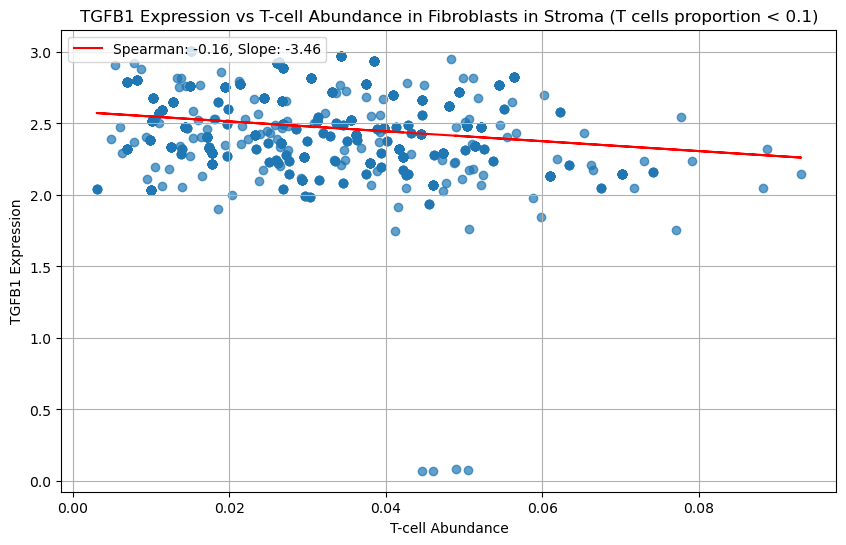

Spearman correlation for TGFB2 vs T-cells: -0.28


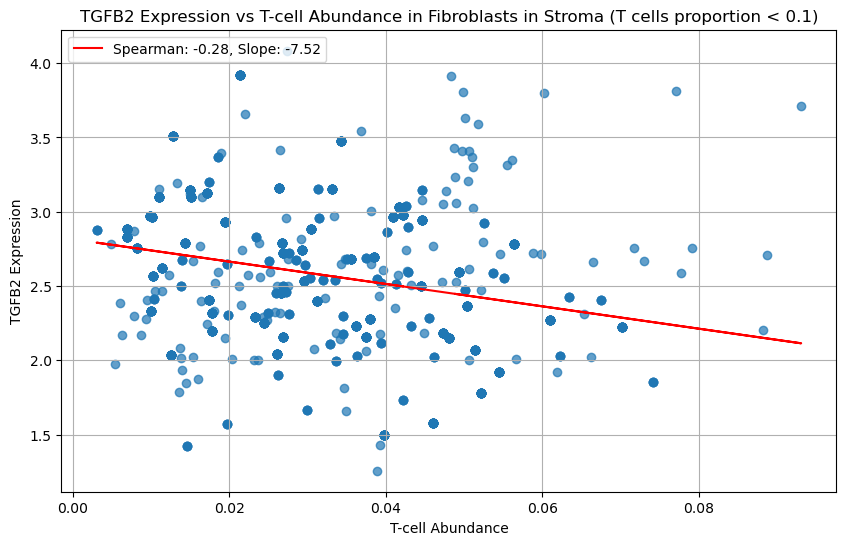

Spearman correlation for TGFB3 vs T-cells: -0.03


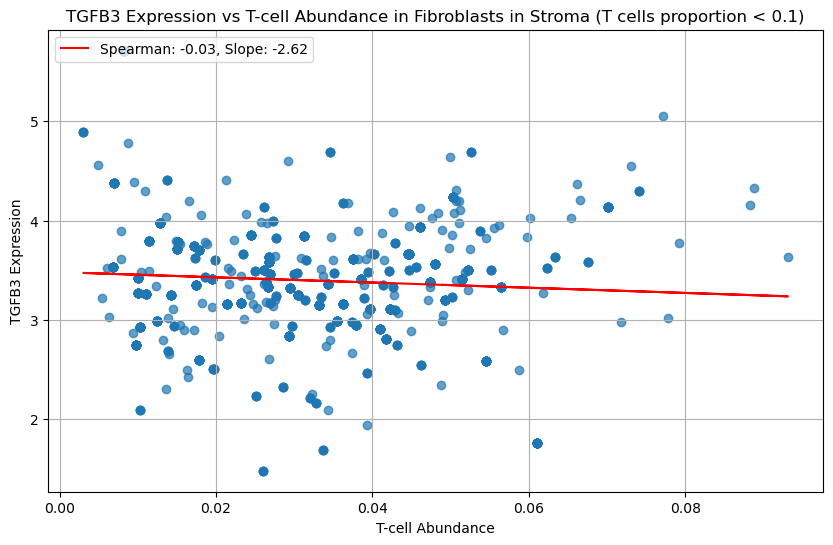

Spearman correlation for TGFBR1 vs T-cells: -0.28


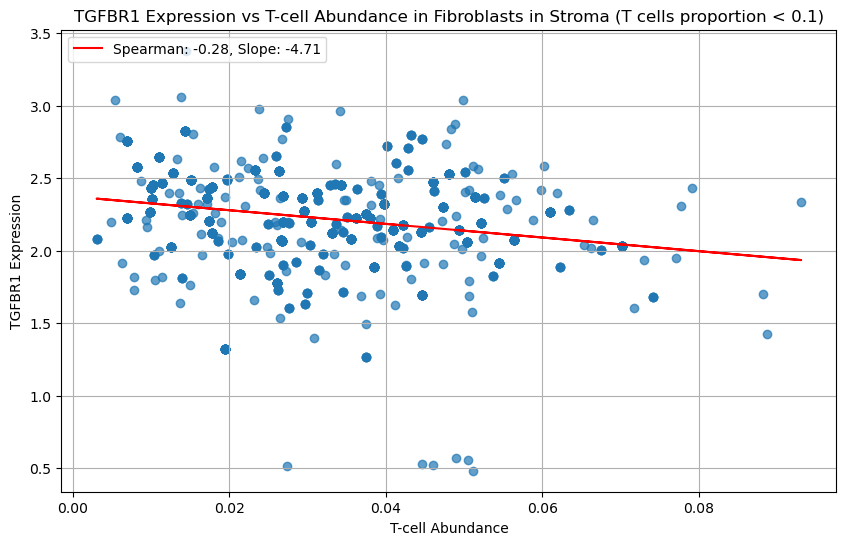

Spearman correlation for TGFBR2 vs T-cells: 0.22


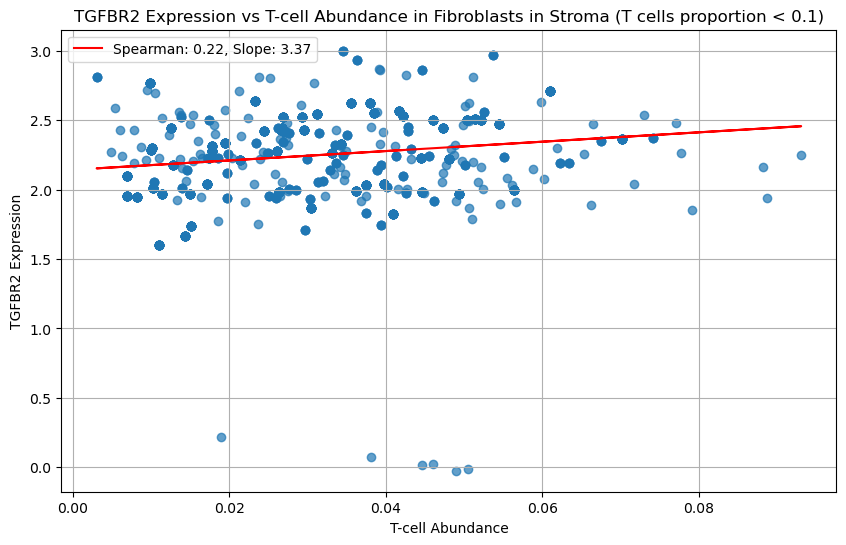

Spearman correlation for TGFBR3 vs T-cells: -0.15


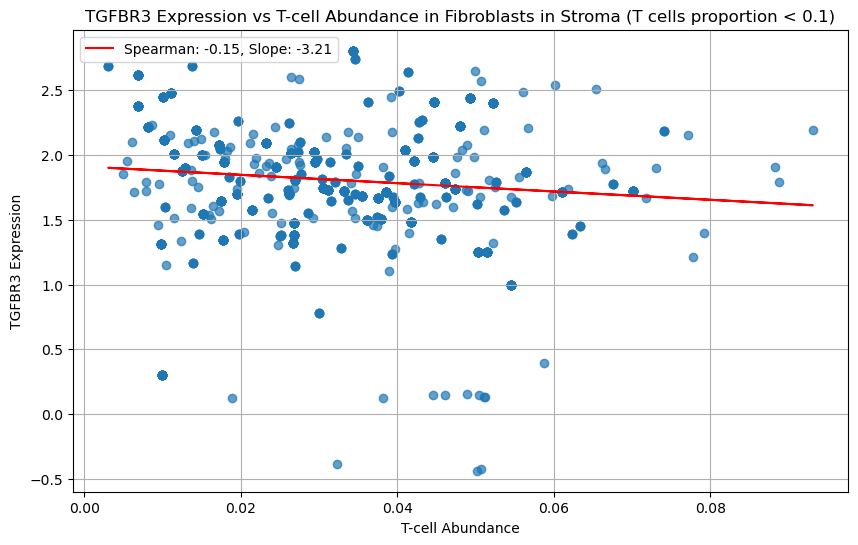

Spearman correlation for IL6 vs T-cells: 0.02


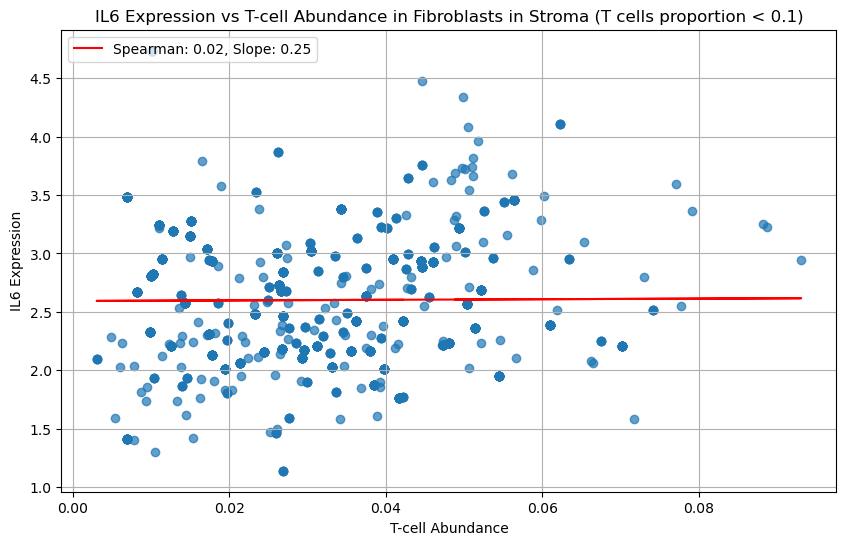

Spearman correlation for IL6R vs T-cells: -0.24


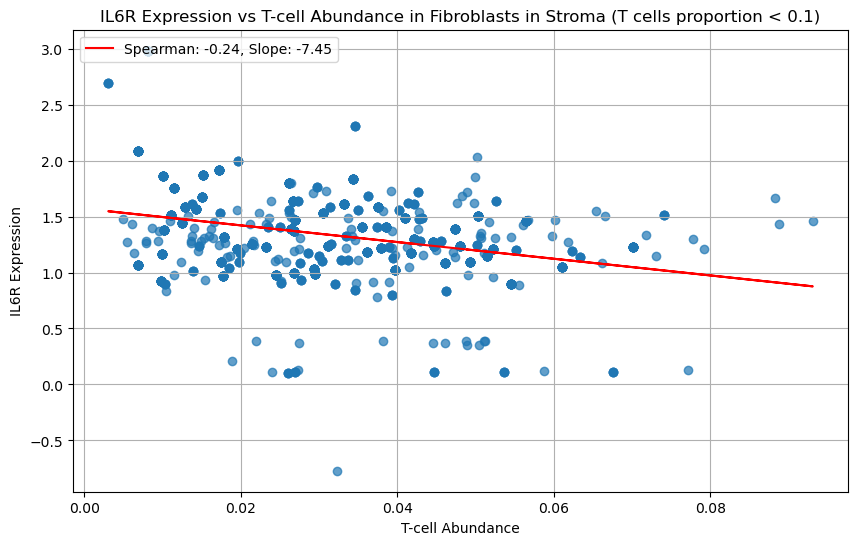

Spearman correlation for IL10RA vs T-cells: -0.09


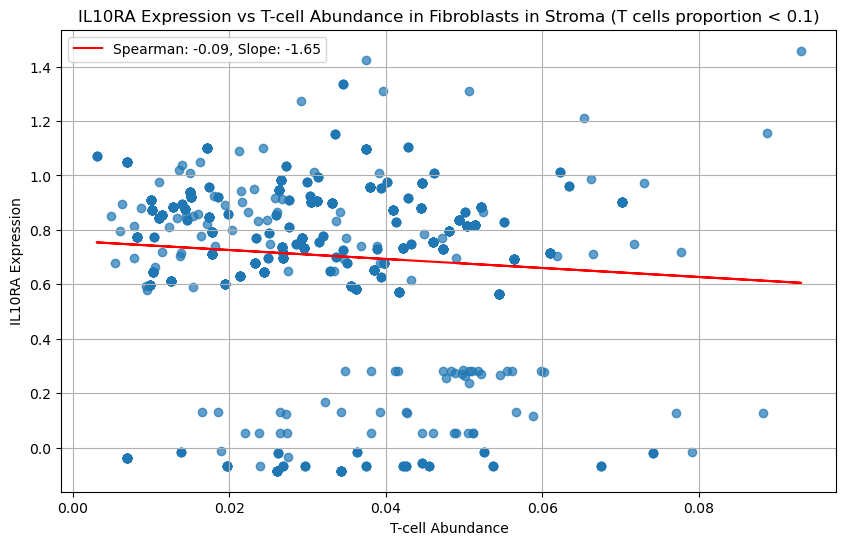

Spearman correlation for IL10RB vs T-cells: -0.33


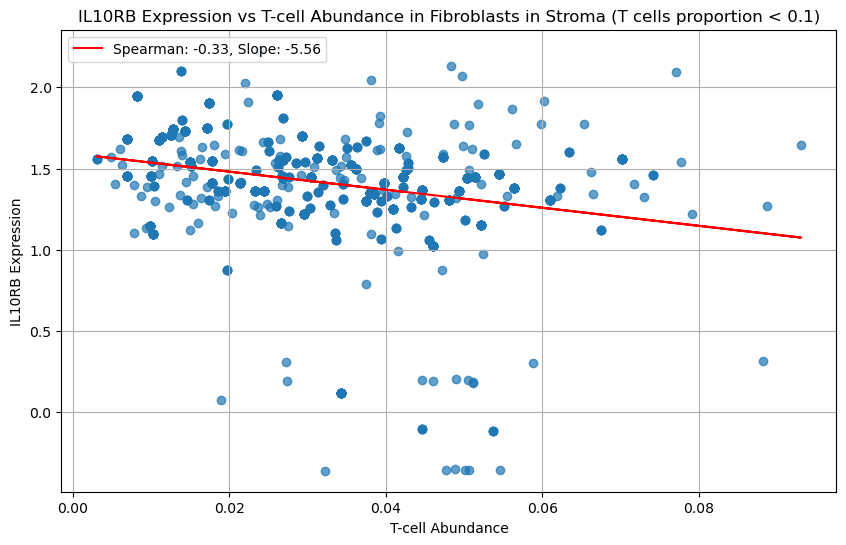

Spearman correlation for CXCL8 vs T-cells: -0.06


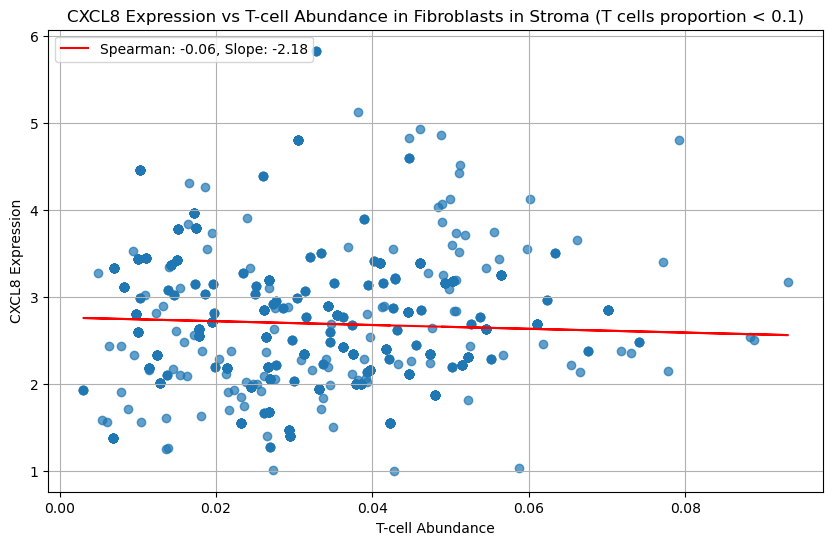

Spearman correlation for CXCL12 vs T-cells: -0.15


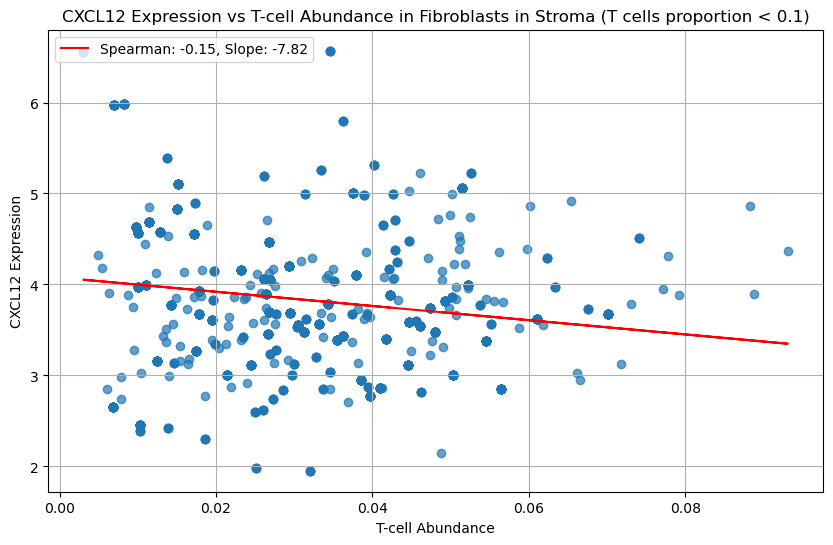

Spearman correlation for CCR5 vs T-cells: -0.39


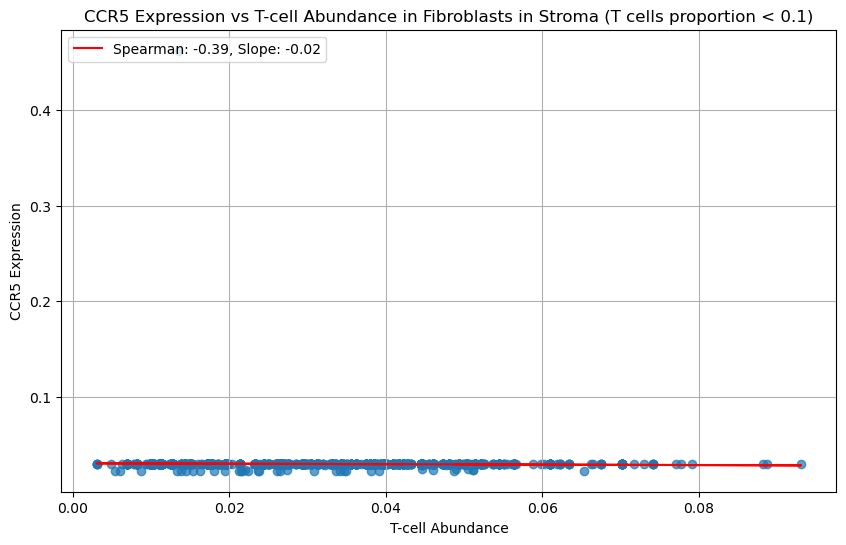

Spearman correlation for CXCR2 vs T-cells: -0.24


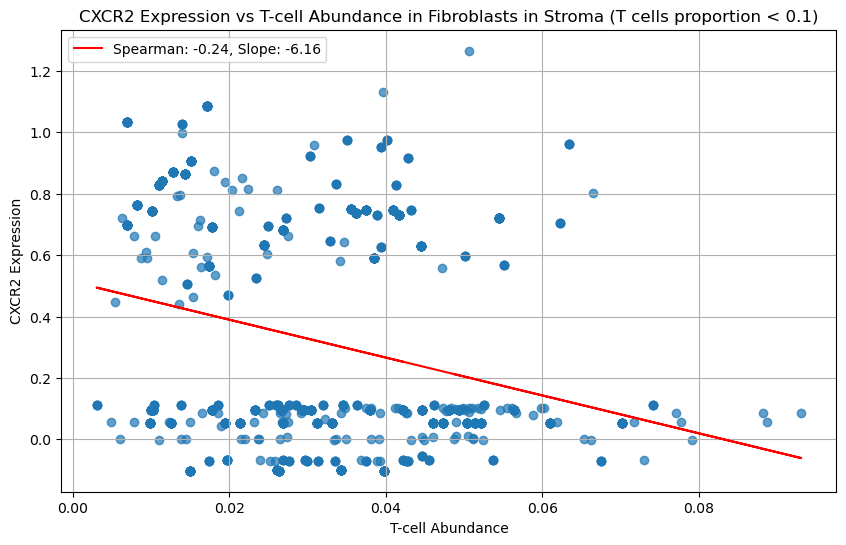

Spearman correlation for CXCR1 vs T-cells: -0.13


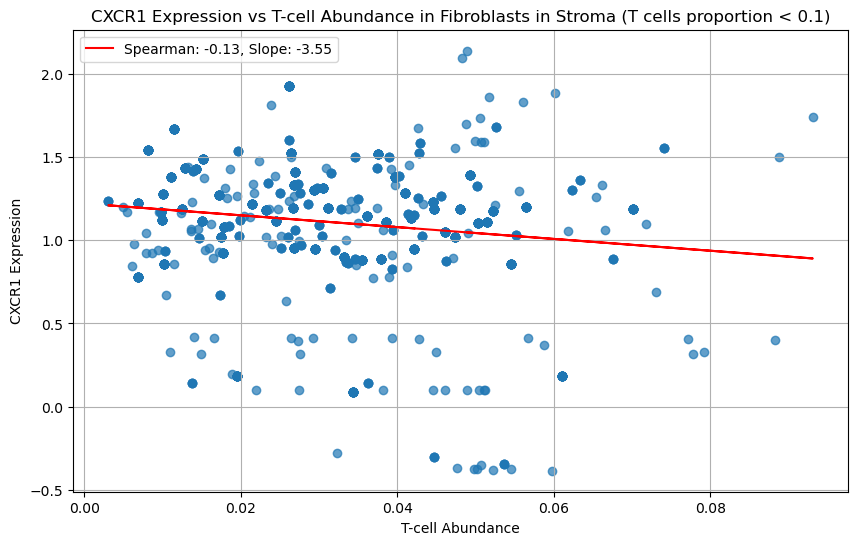

Spearman correlation for CXCR4 vs T-cells: 0.08


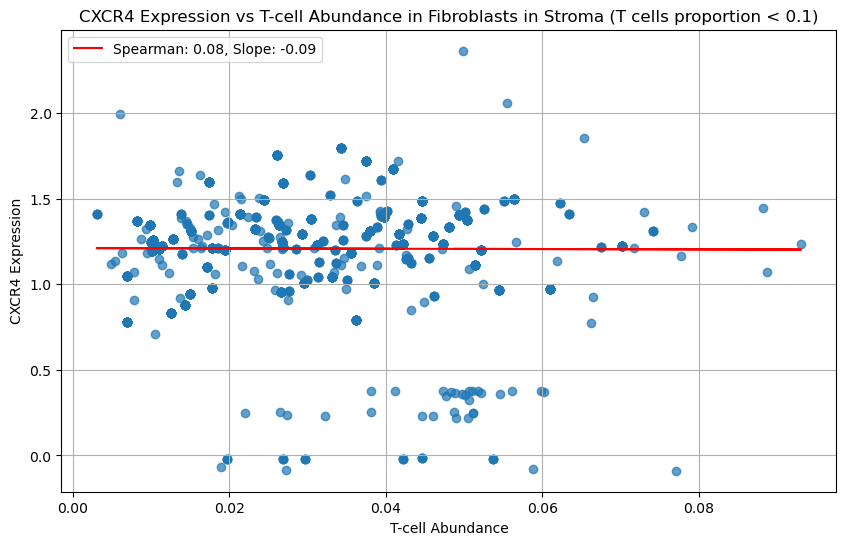

Spearman correlation for CXCL10 vs T-cells: 0.22


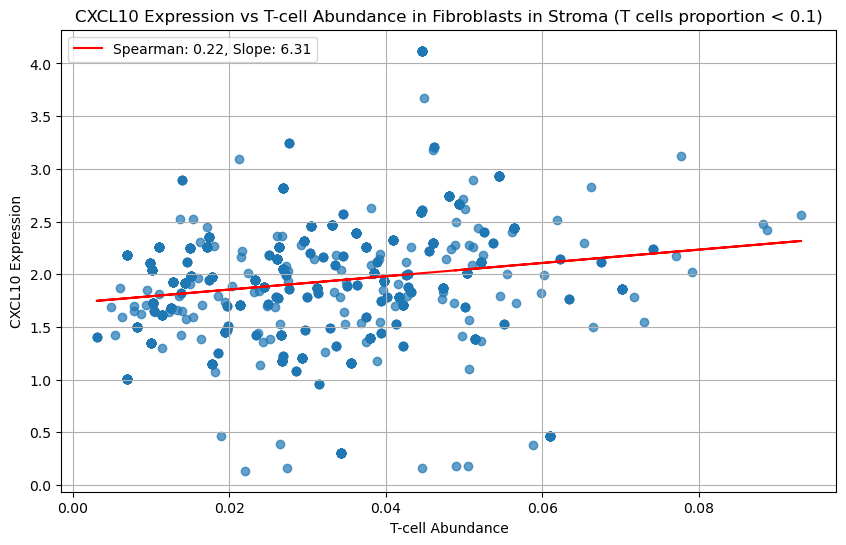

Spearman correlation for CXCL9 vs T-cells: 0.36


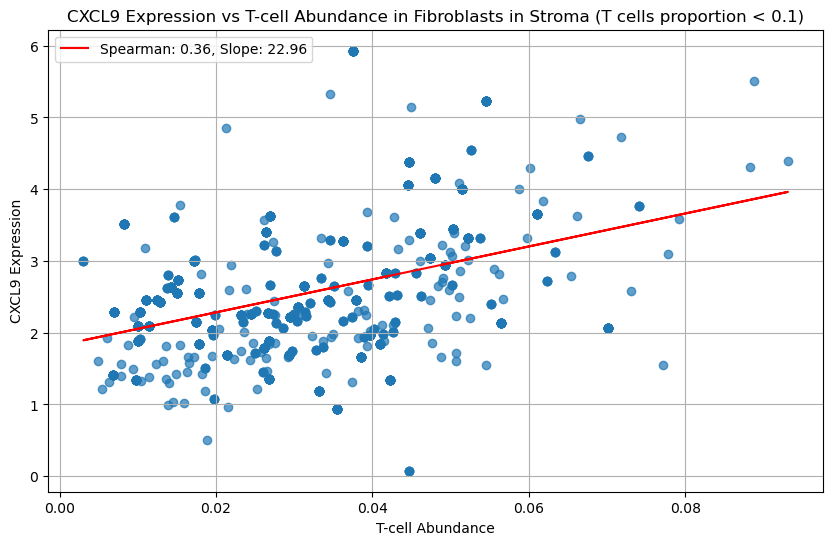

Spearman correlation for HGF vs T-cells: -0.02


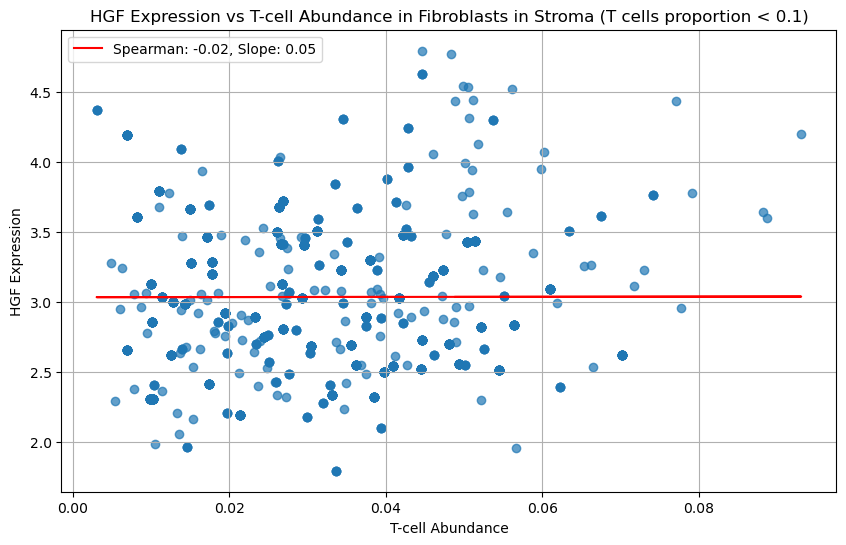

Spearman correlation for MET vs T-cells: -0.18


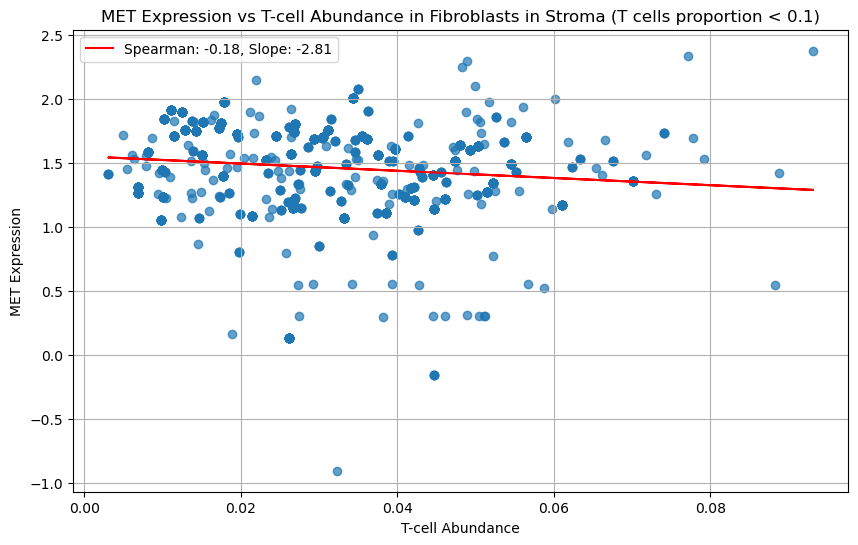

Spearman correlation for FGF1 vs T-cells: -0.14


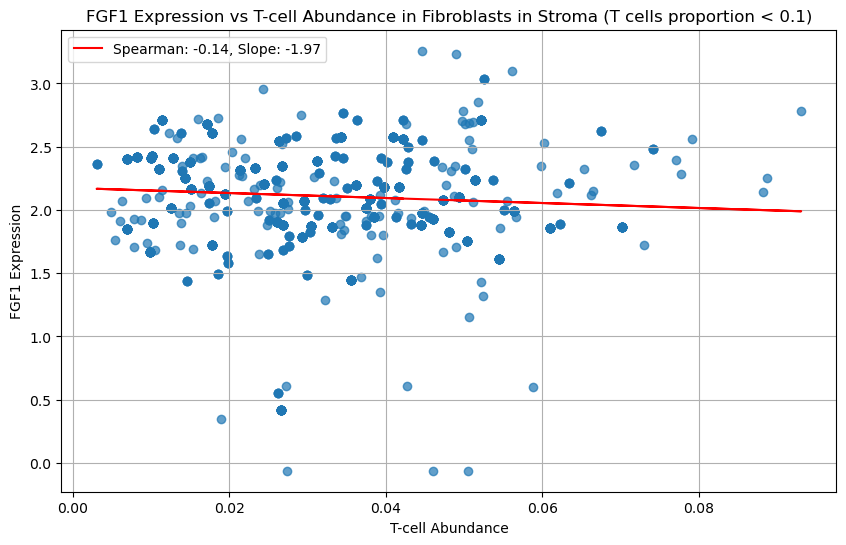

Spearman correlation for FGF2 vs T-cells: 0.06


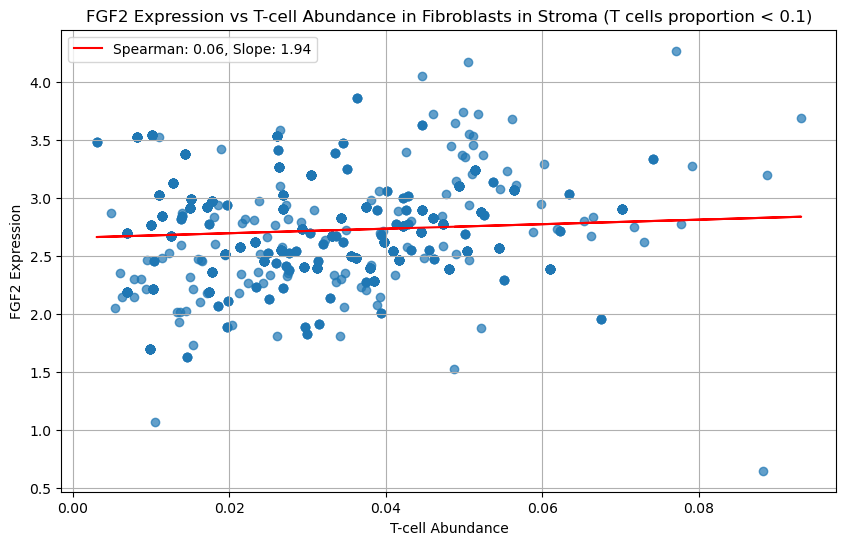

Spearman correlation for FGF7 vs T-cells: -0.00


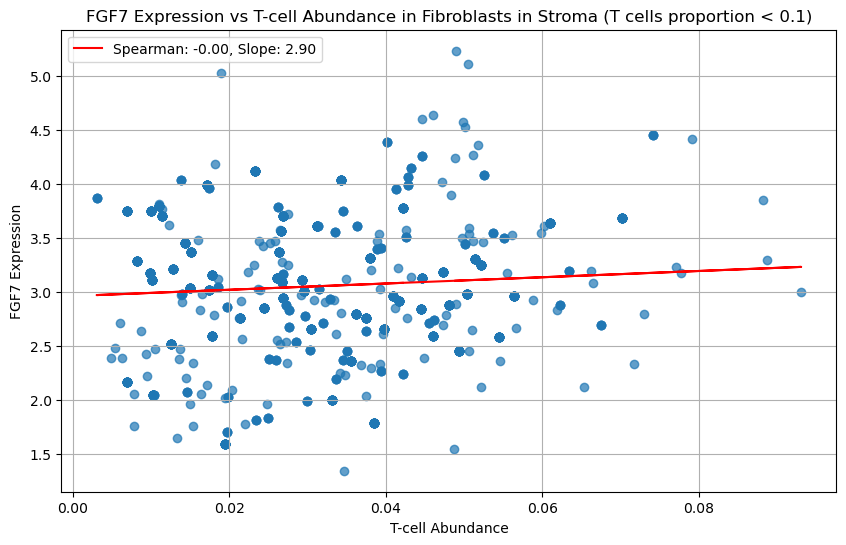

Spearman correlation for FGF10 vs T-cells: -0.11


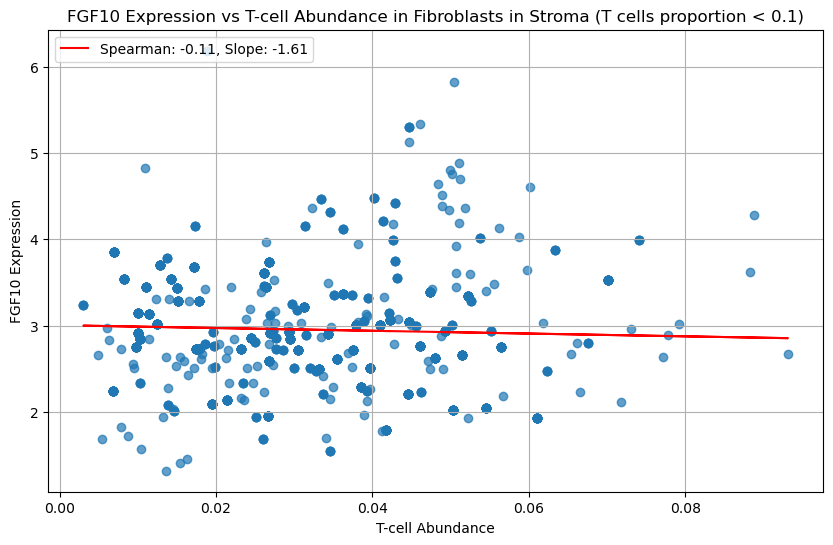

Spearman correlation for FGFR1 vs T-cells: -0.18


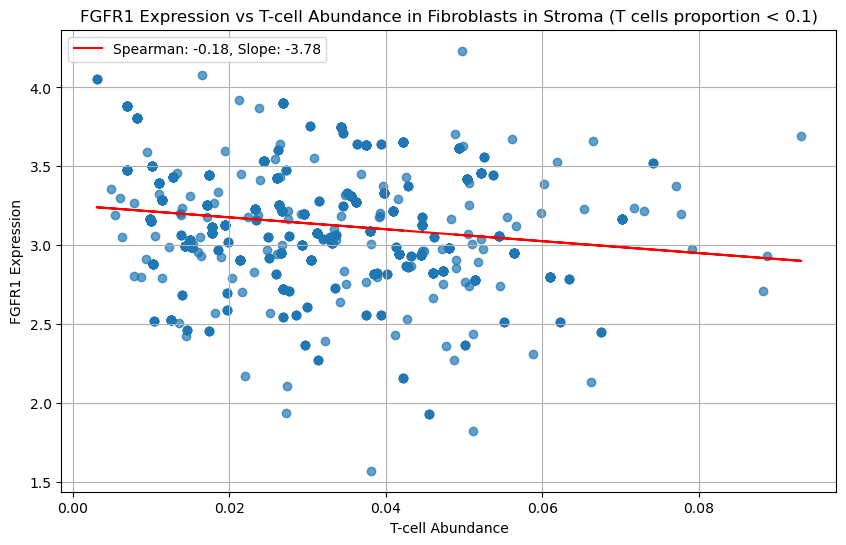

Spearman correlation for FGFR2 vs T-cells: -0.24


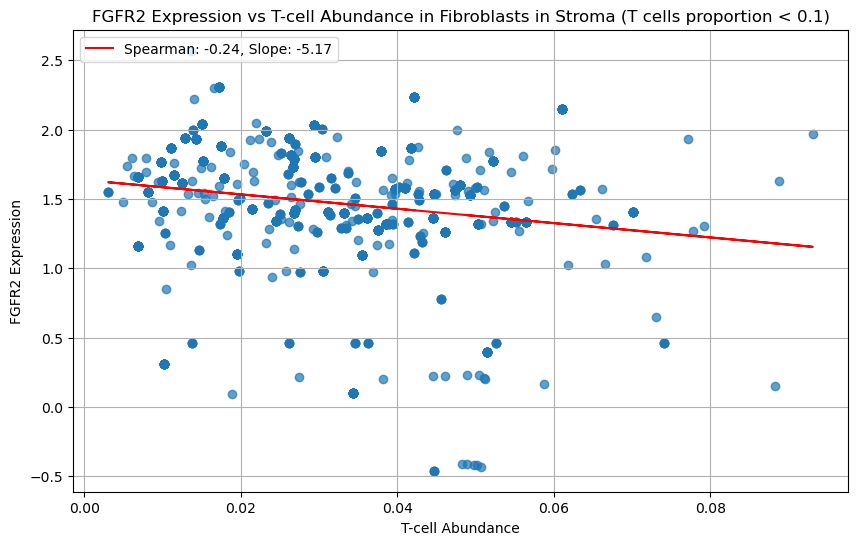

Spearman correlation for FGFR3 vs T-cells: -0.13


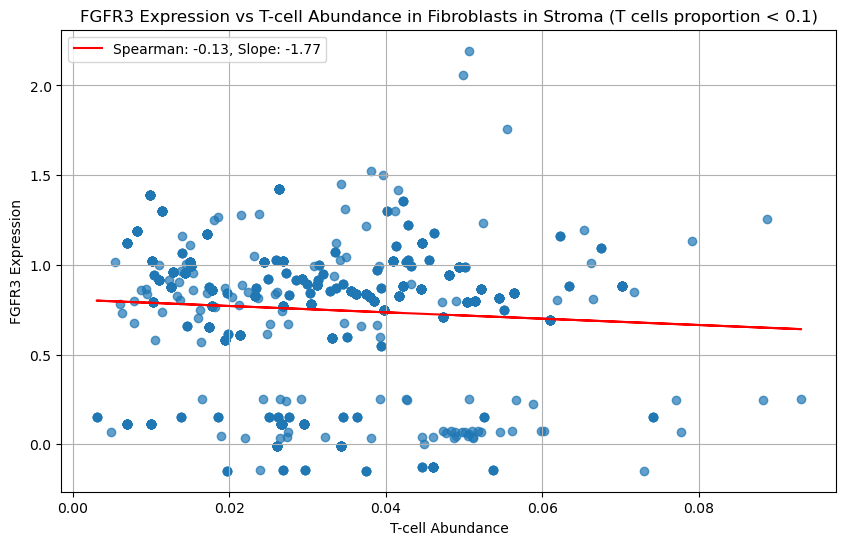

Spearman correlation for FGFR4 vs T-cells: -0.20


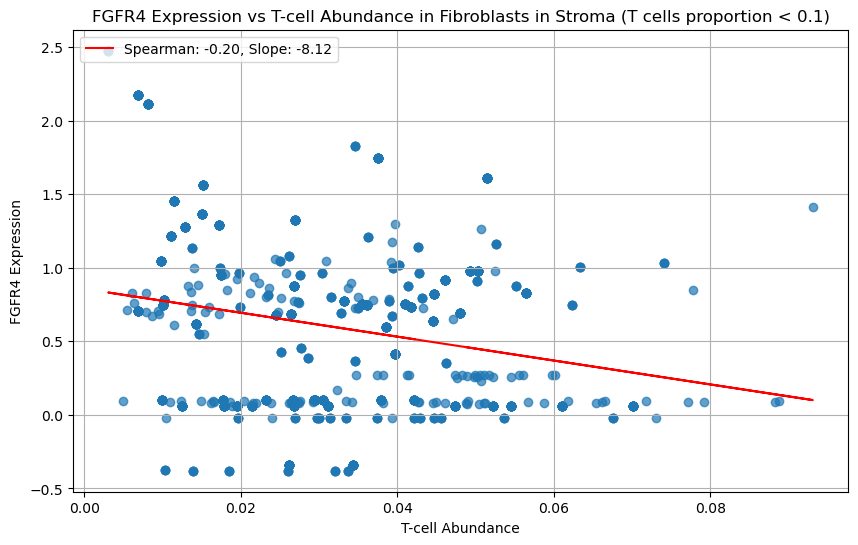

Spearman correlation for IL11 vs T-cells: -0.04


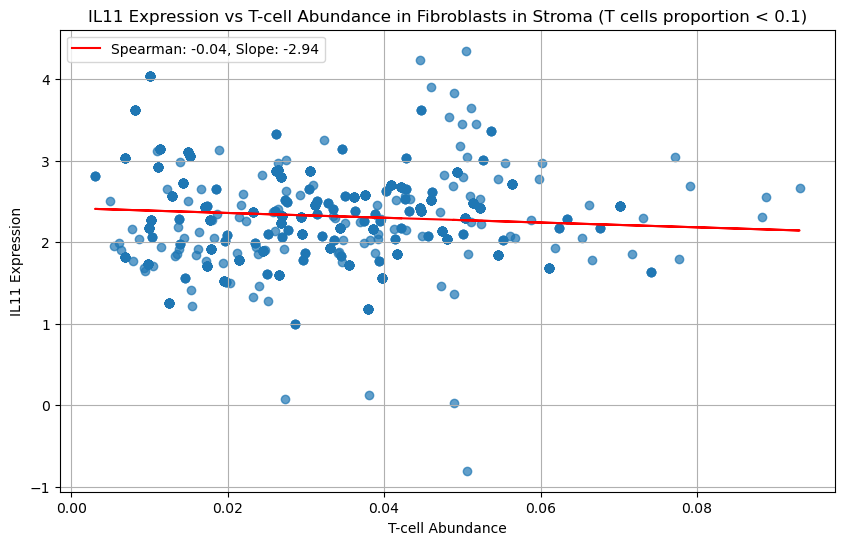

Spearman correlation for HAS1 vs T-cells: 0.14


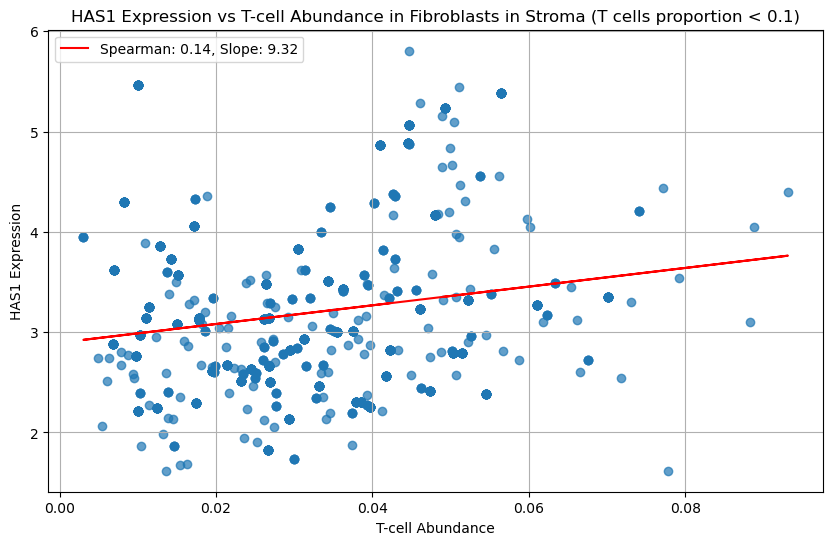

Spearman correlation for HAS2 vs T-cells: 0.02


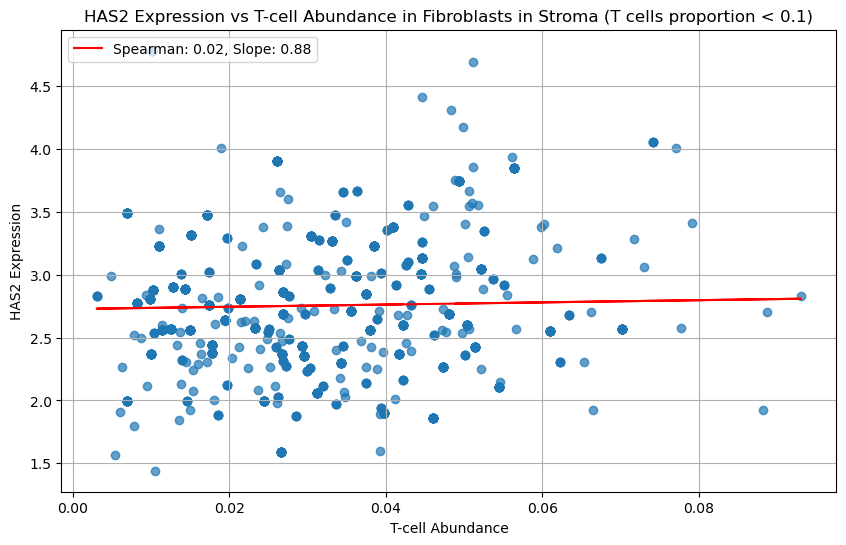

Spearman correlation for HYAL1 vs T-cells: 0.09


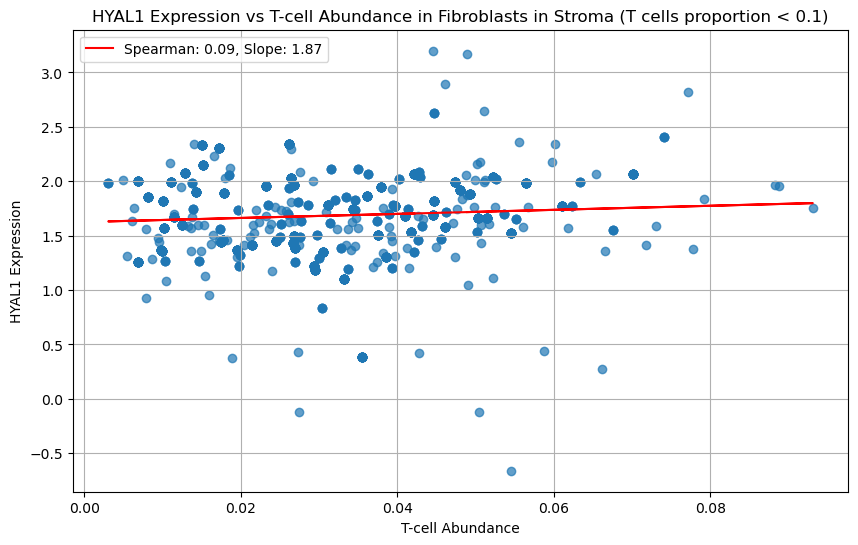

Spearman correlation for HYAL2 vs T-cells: -0.22


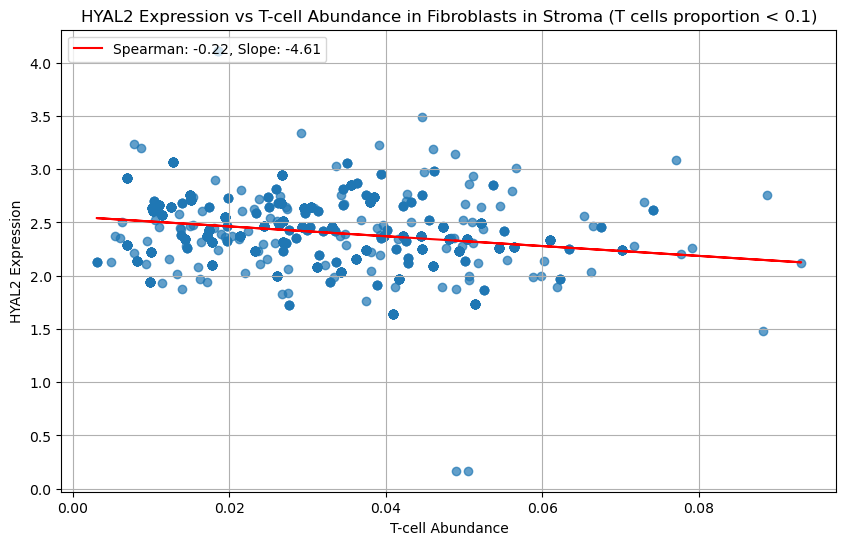

In [25]:
fibr_gene_expression_cell_abundance_stroma=fibr_gene_expression_cell_abundance[fibr_gene_expression_cell_abundance["Segment_y"]=="stroma"]

for gene in target_receptors_molecules:
    # Filter rows where T-cell abundance is less than 0.1
    filtered_data = fibr_gene_expression_cell_abundance_stroma[fibr_gene_expression_cell_abundance_stroma["Tcells"] < 0.1]
    #filtered_data= fibr_gene_expression_cell_abundance_stroma
    # Proceed only if there are enough data points
    if not filtered_data.empty:
        plt.figure(figsize=(10, 6))

        # Scatter plot
        plt.scatter(filtered_data["Tcells"], filtered_data[gene], alpha=0.7)

        # Spearman correlation
        spearman_corr, _ = spearmanr(filtered_data["Tcells"], filtered_data[gene])
        print(f"Spearman correlation for {gene} vs T-cells: {spearman_corr:.2f}")

        # Linear regression
        slope, intercept, _, _, _ = linregress(filtered_data["Tcells"], filtered_data[gene])
        regression_line = slope * filtered_data["Tcells"] + intercept
        plt.plot(filtered_data["Tcells"], regression_line, color='red',
                 label=f'Spearman: {spearman_corr:.2f}, Slope: {slope:.2f}')

        # Plot formatting
        plt.title(f"{gene} Expression vs T-cell Abundance in Fibroblasts in Stroma (T cells proportion < 0.1)")
        plt.xlabel("T-cell Abundance")
        plt.ylabel(f"{gene} Expression")
        plt.grid()
        plt.legend(loc='upper left')
        plt.show()


Spearman correlation for TGFB1 vs T-cells: -0.01


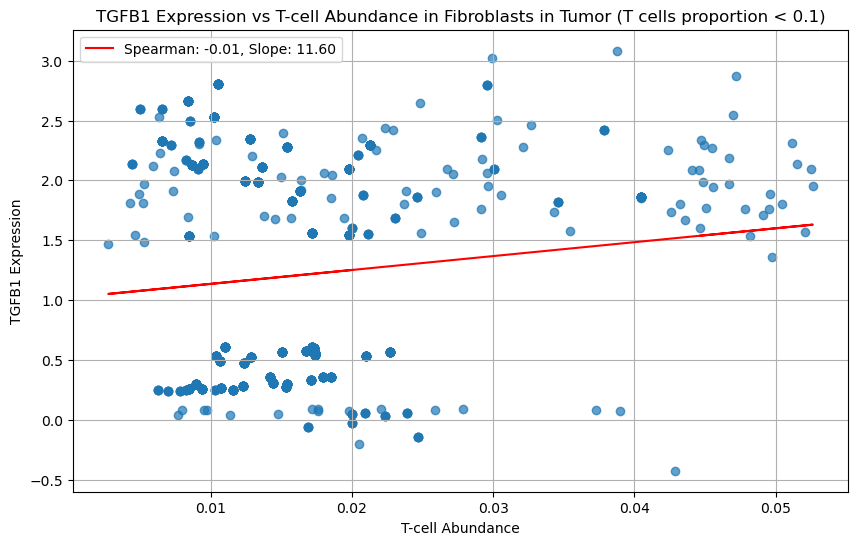

Spearman correlation for TGFB2 vs T-cells: 0.09


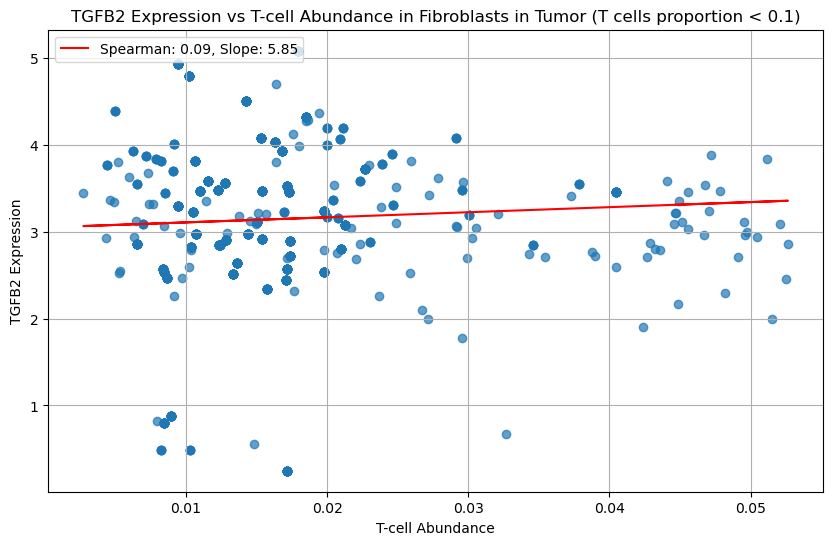

Spearman correlation for TGFB3 vs T-cells: -0.01


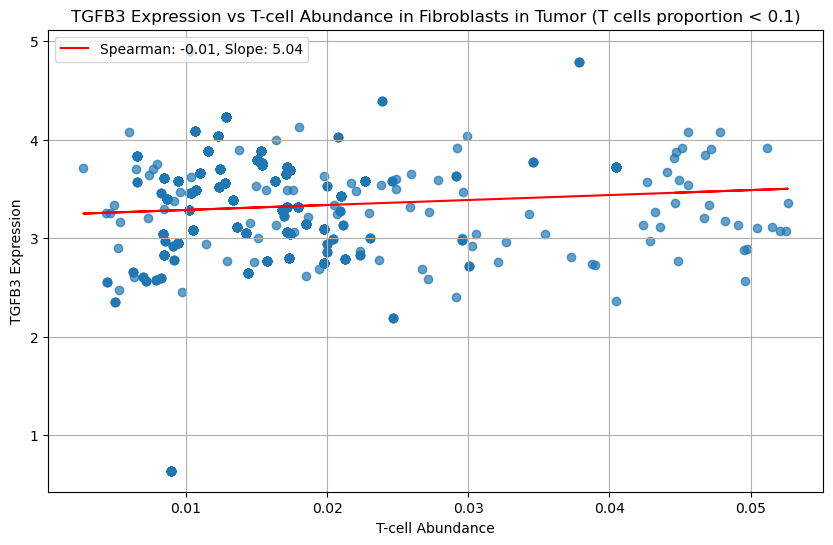

Spearman correlation for TGFBR1 vs T-cells: -0.10


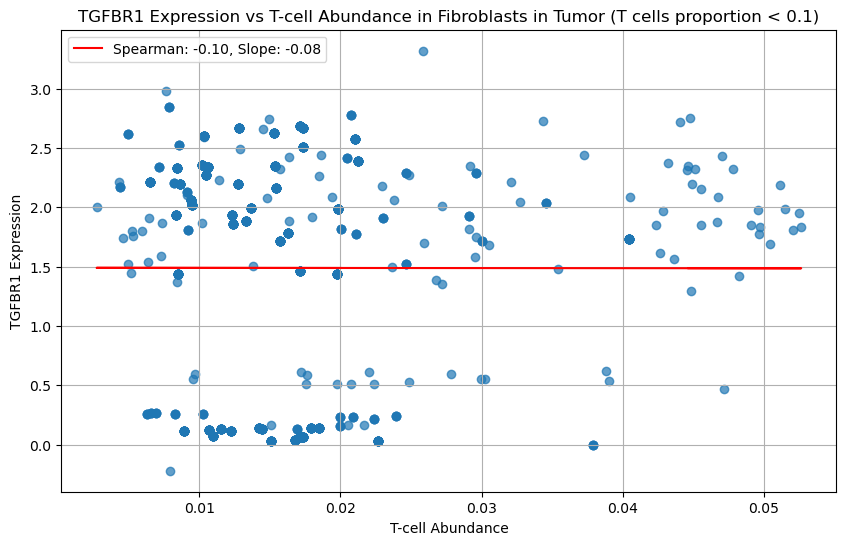

Spearman correlation for TGFBR2 vs T-cells: 0.00


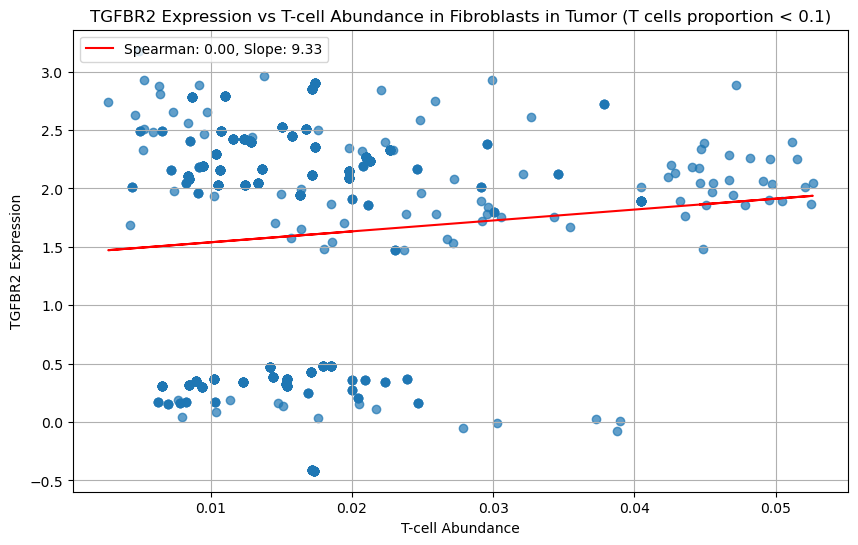

Spearman correlation for TGFBR3 vs T-cells: -0.15


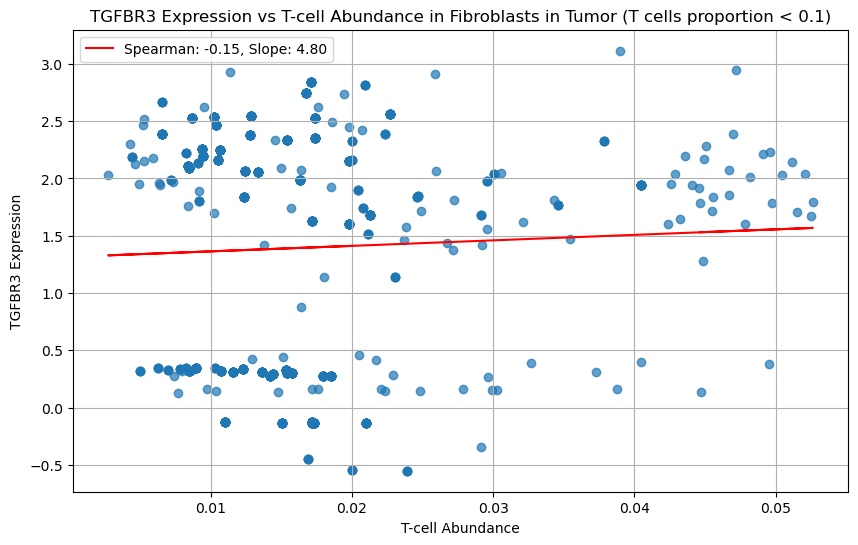

Spearman correlation for IL6 vs T-cells: -0.12


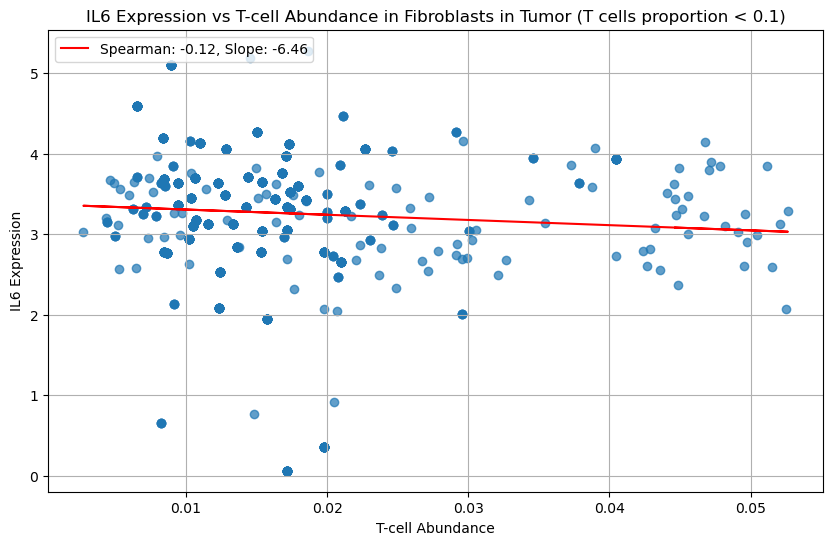

Spearman correlation for IL6R vs T-cells: -0.05


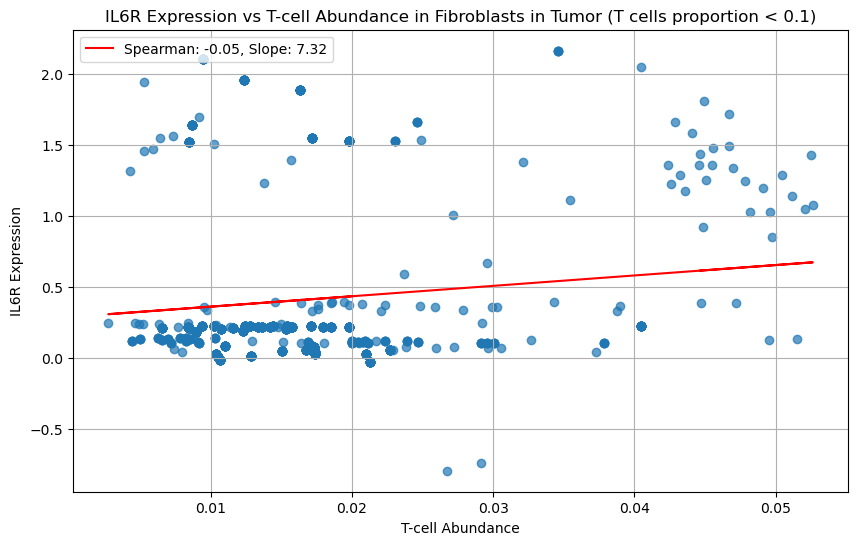

Spearman correlation for IL10RA vs T-cells: -0.08


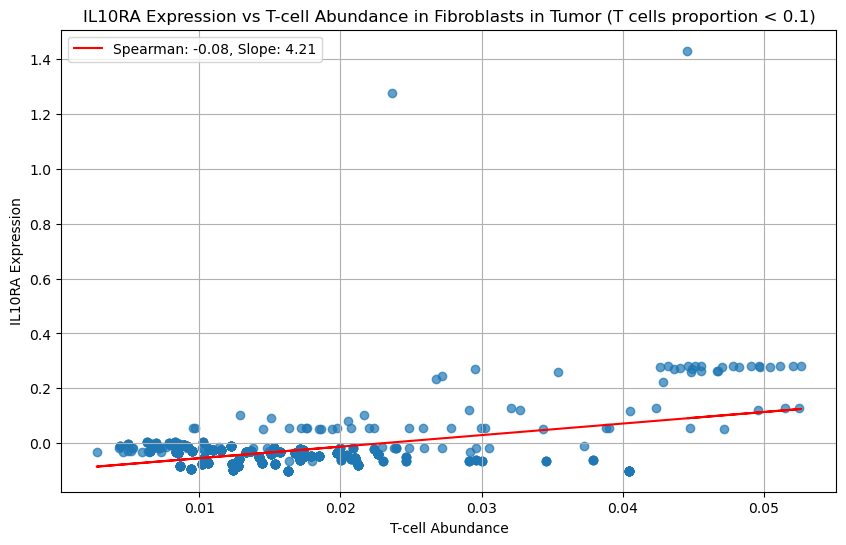

Spearman correlation for IL10RB vs T-cells: 0.20


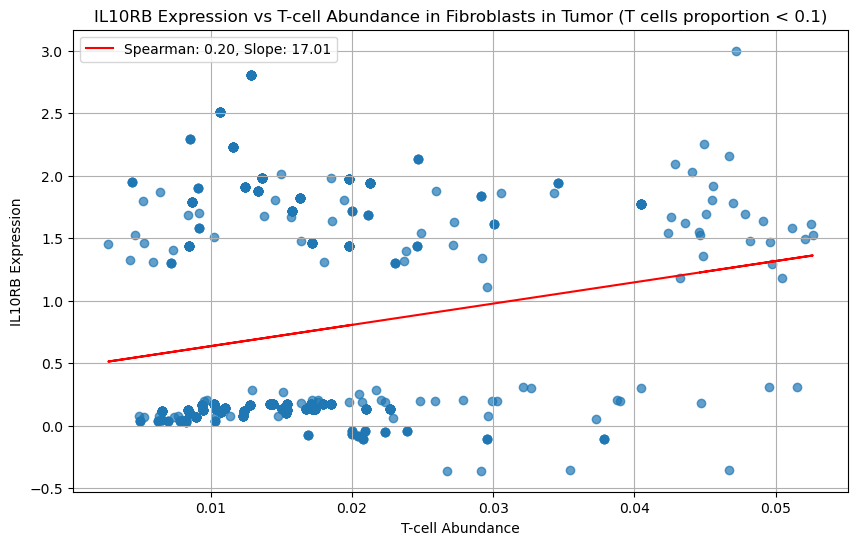

Spearman correlation for CXCL8 vs T-cells: -0.32


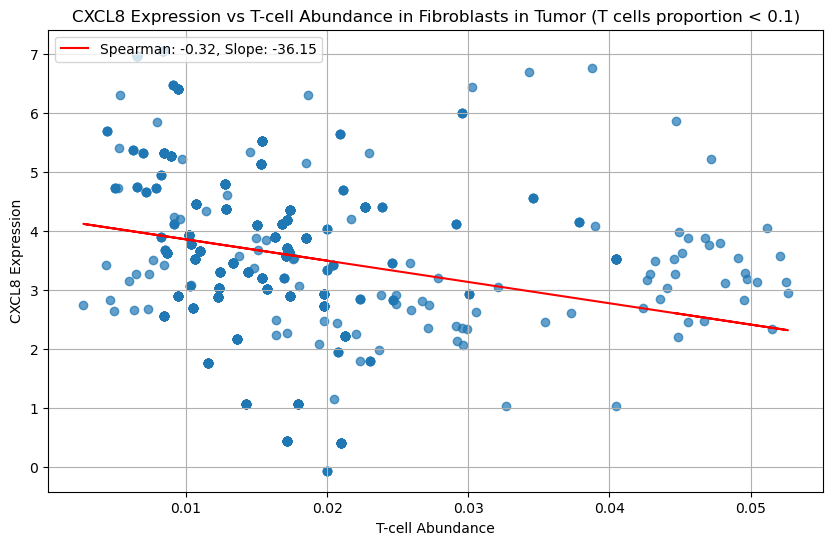

Spearman correlation for CXCL12 vs T-cells: -0.06


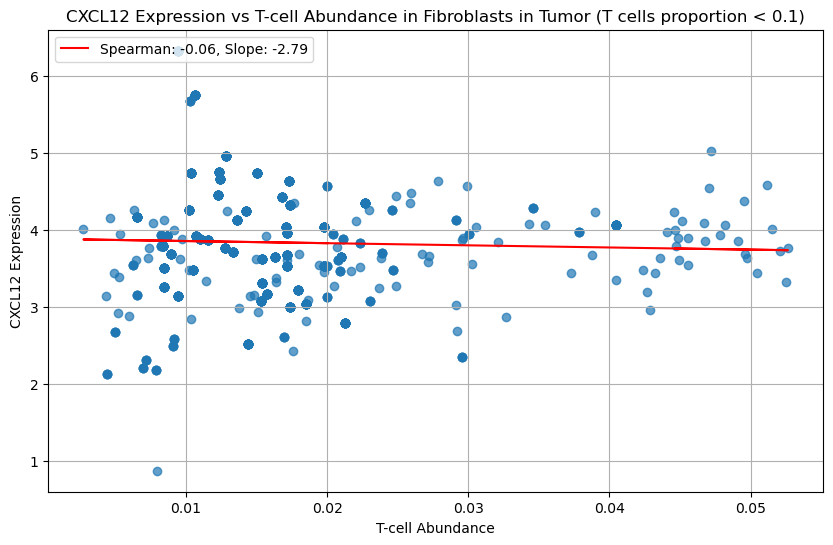

Spearman correlation for CCR5 vs T-cells: -0.27


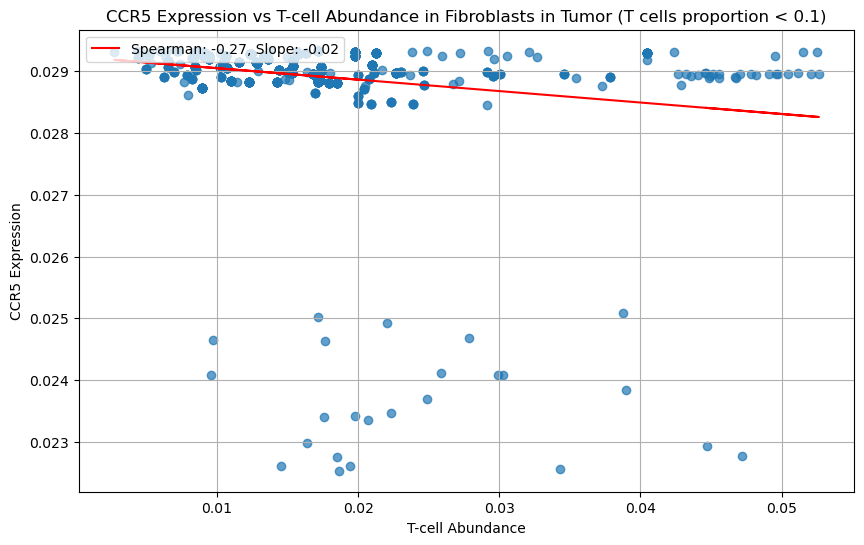

Spearman correlation for CXCR2 vs T-cells: -0.22


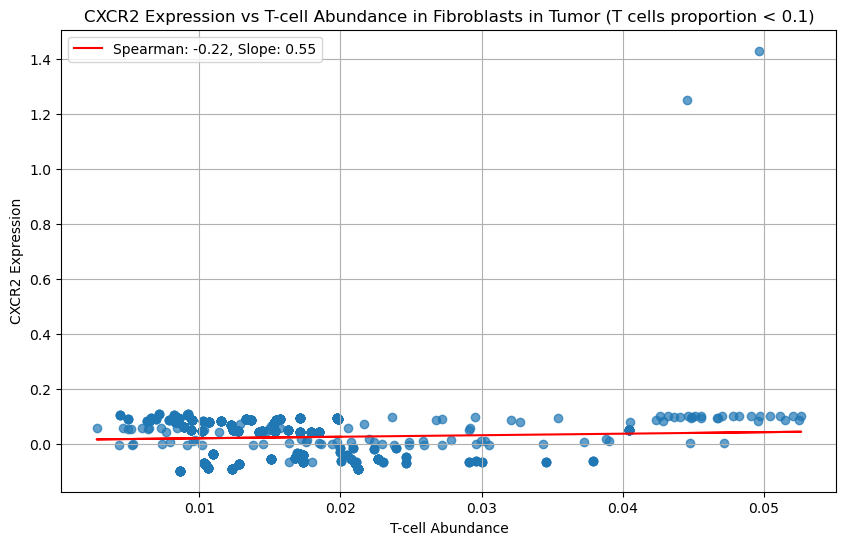

Spearman correlation for CXCR1 vs T-cells: -0.12


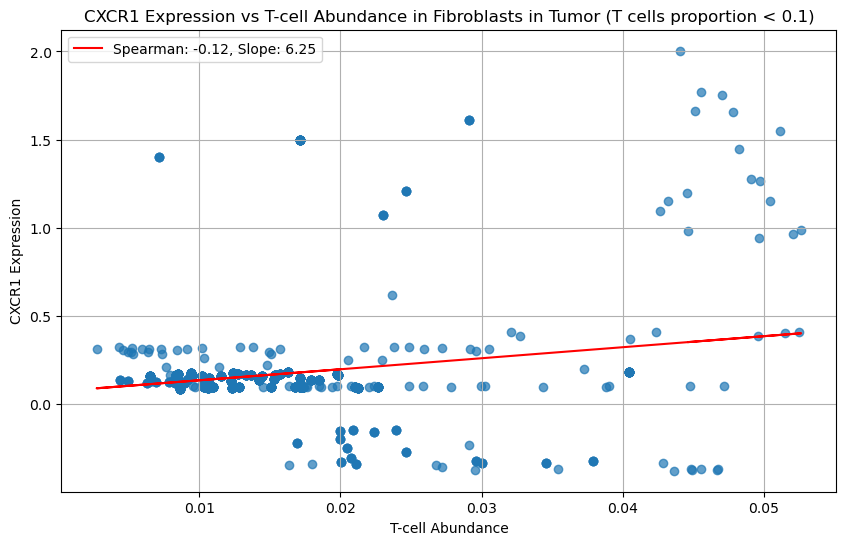

Spearman correlation for CXCR4 vs T-cells: 0.20


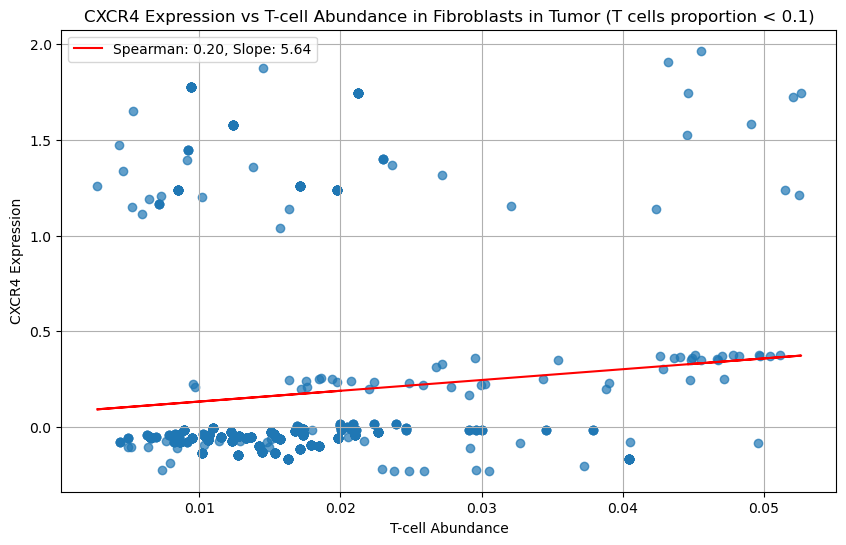

Spearman correlation for CXCL10 vs T-cells: 0.04


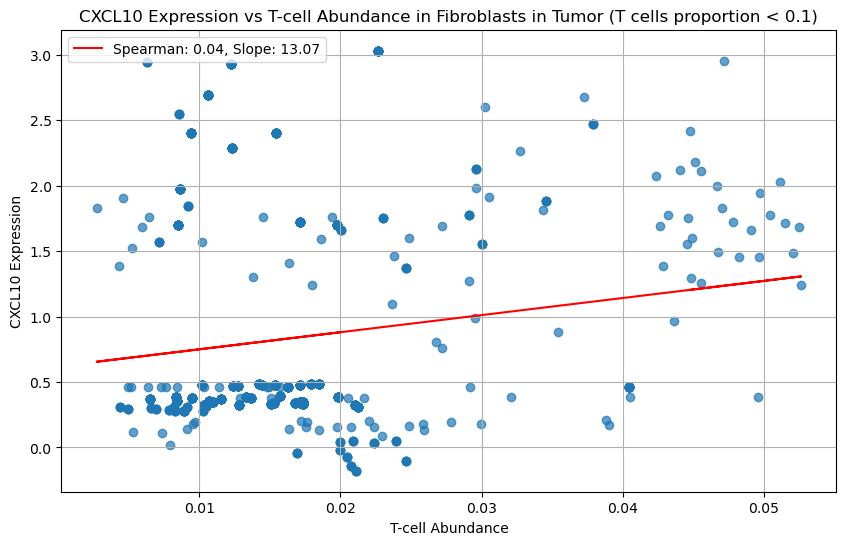

Spearman correlation for CXCL9 vs T-cells: 0.22


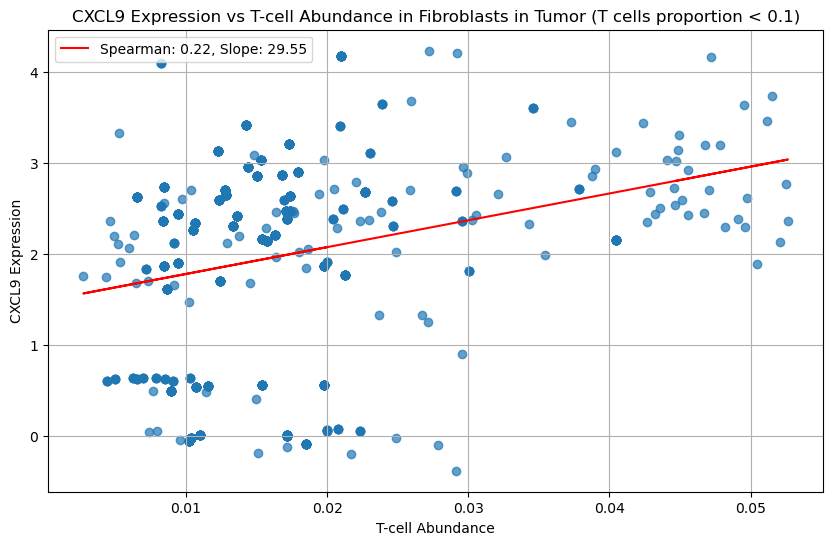

Spearman correlation for HGF vs T-cells: 0.00


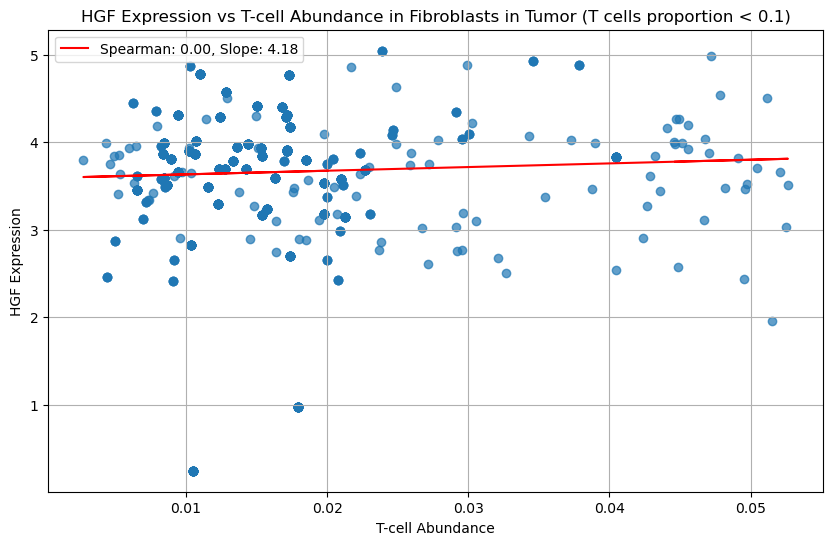

Spearman correlation for MET vs T-cells: 0.09


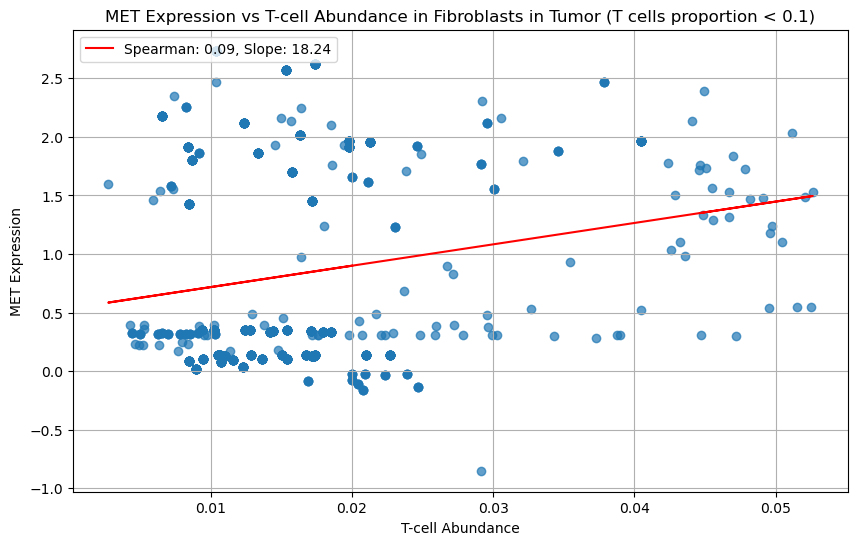

Spearman correlation for FGF1 vs T-cells: -0.18


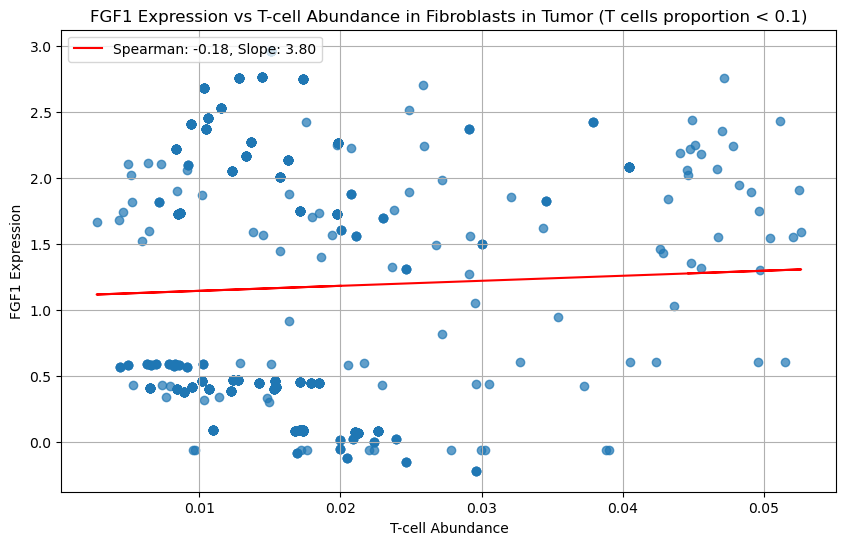

Spearman correlation for FGF2 vs T-cells: 0.01


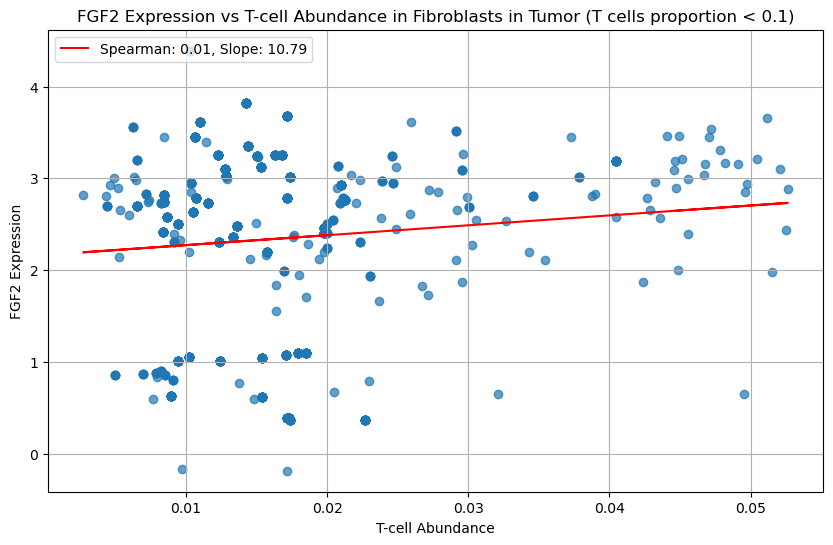

Spearman correlation for FGF7 vs T-cells: 0.11


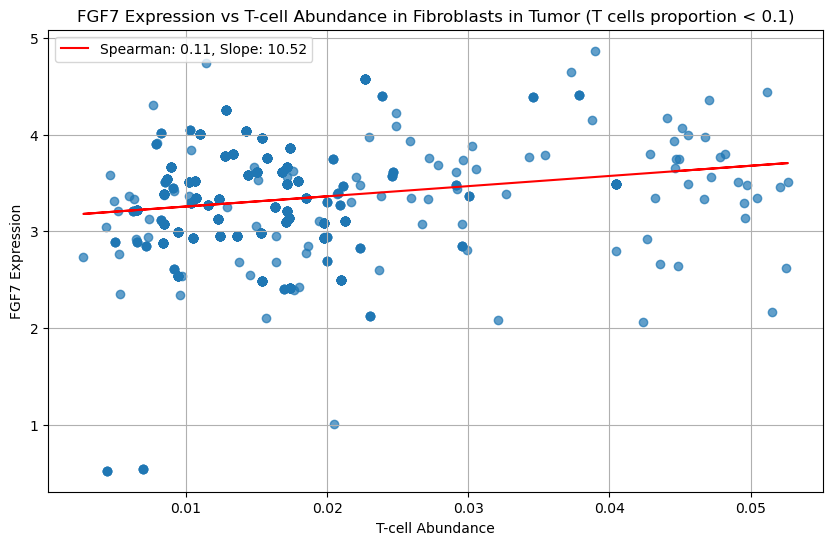

Spearman correlation for FGF10 vs T-cells: -0.03


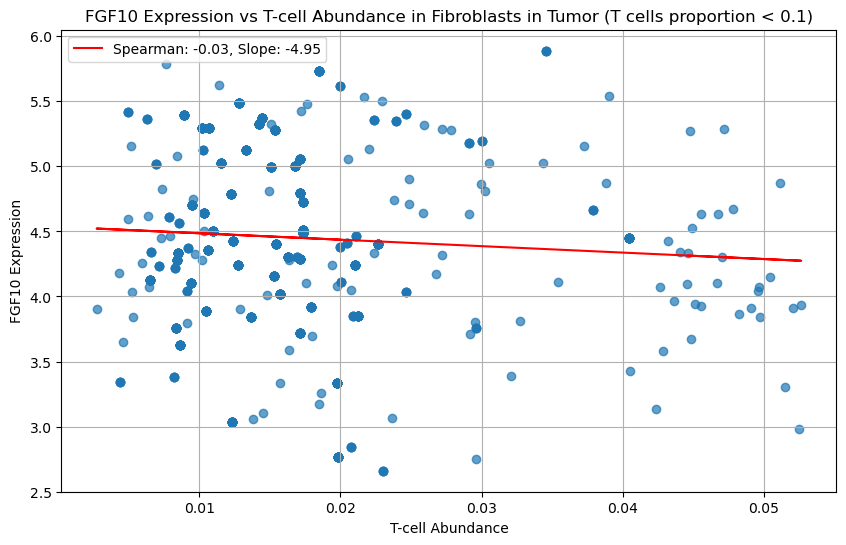

Spearman correlation for FGFR1 vs T-cells: 0.21


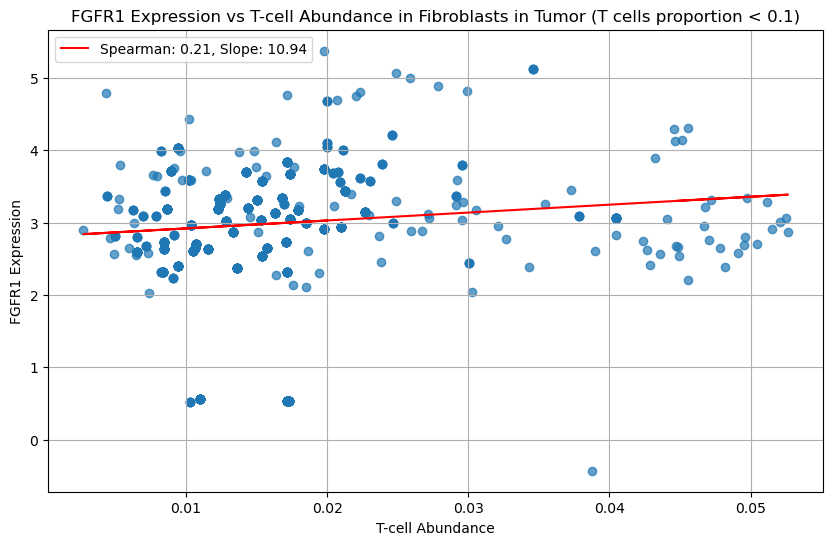

Spearman correlation for FGFR2 vs T-cells: -0.07


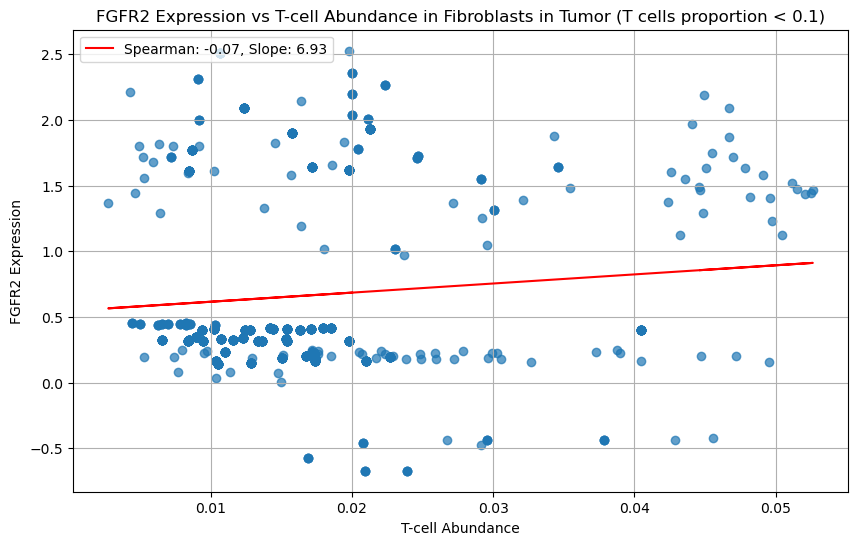

Spearman correlation for FGFR3 vs T-cells: -0.35


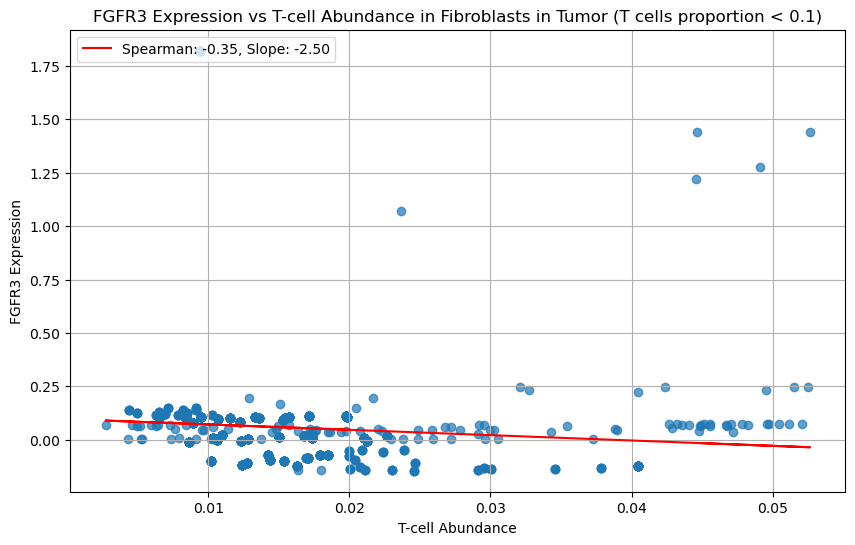

Spearman correlation for FGFR4 vs T-cells: 0.06


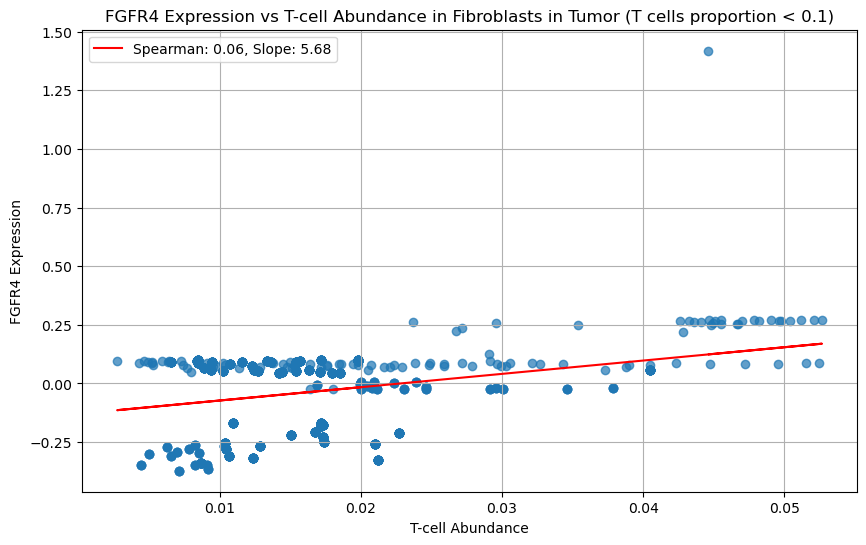

Spearman correlation for IL11 vs T-cells: -0.05


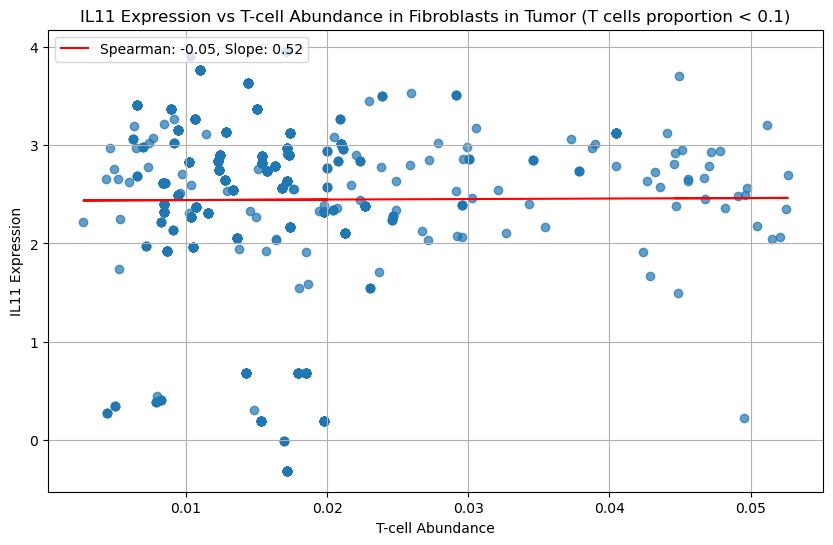

Spearman correlation for HAS1 vs T-cells: 0.21


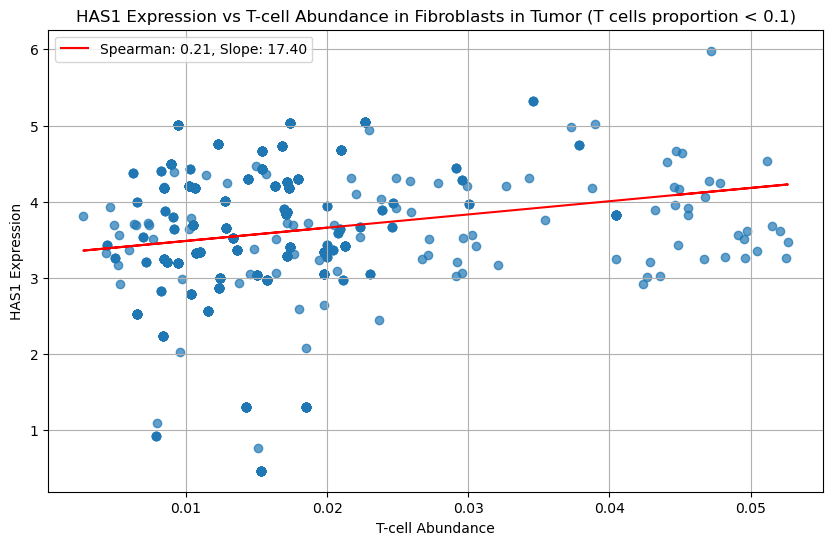

Spearman correlation for HAS2 vs T-cells: 0.02


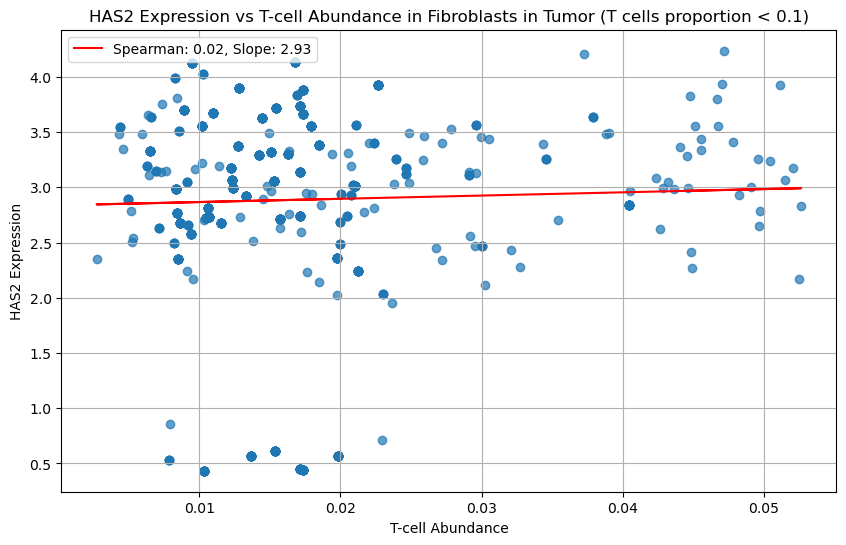

Spearman correlation for HYAL1 vs T-cells: -0.03


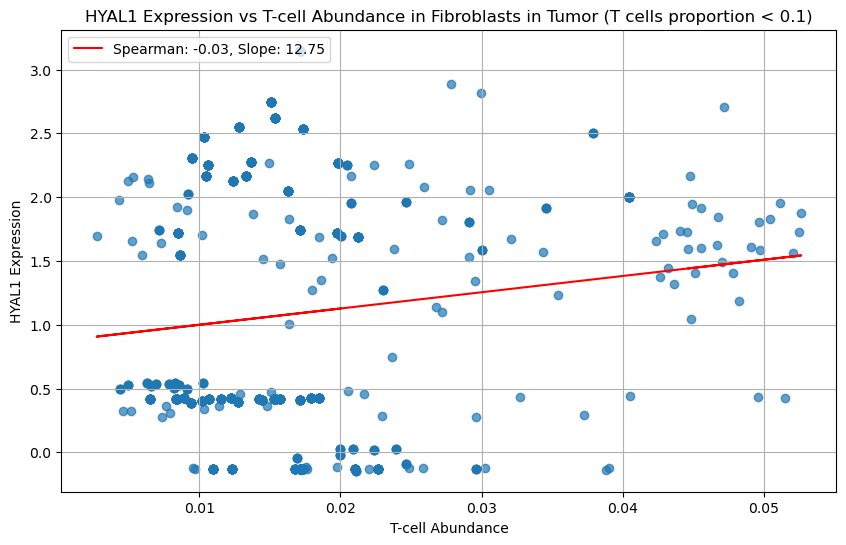

Spearman correlation for HYAL2 vs T-cells: -0.14


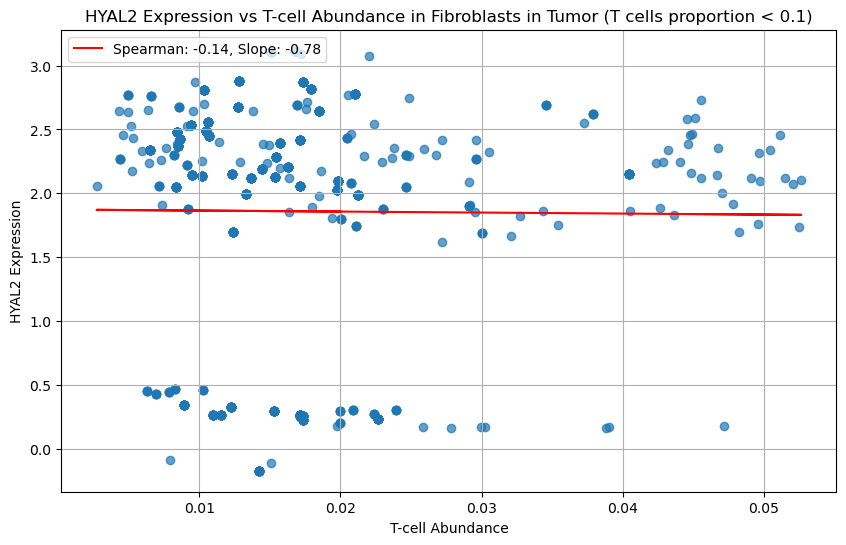

In [26]:
for gene in target_receptors_molecules:
    # Filter rows where T-cell abundance is less than 0.1
    filtered_data = fibr_gene_expression_cell_abundance_tumor[fibr_gene_expression_cell_abundance_tumor["Tcells"] < 0.1]
    #filtered_data= fibr_gene_expression_cell_abundance_stroma
    # Proceed only if there are enough data points
    if not filtered_data.empty:
        plt.figure(figsize=(10, 6))

        # Scatter plot
        plt.scatter(filtered_data["Tcells"], filtered_data[gene], alpha=0.7)

        # Spearman correlation
        spearman_corr, _ = spearmanr(filtered_data["Tcells"], filtered_data[gene])
        print(f"Spearman correlation for {gene} vs T-cells: {spearman_corr:.2f}")

        # Linear regression
        slope, intercept, _, _, _ = linregress(filtered_data["Tcells"], filtered_data[gene])
        regression_line = slope * filtered_data["Tcells"] + intercept
        plt.plot(filtered_data["Tcells"], regression_line, color='red',
                 label=f'Spearman: {spearman_corr:.2f}, Slope: {slope:.2f}')

        # Plot formatting
        plt.title(f"{gene} Expression vs T-cell Abundance in Fibroblasts in Tumor (T cells proportion < 0.1)")
        plt.xlabel("T-cell Abundance")
        plt.ylabel(f"{gene} Expression")
        plt.grid()
        plt.legend(loc='upper left')
        plt.show()


Spearman correlation for TGFB1 vs T-cells: 0.27


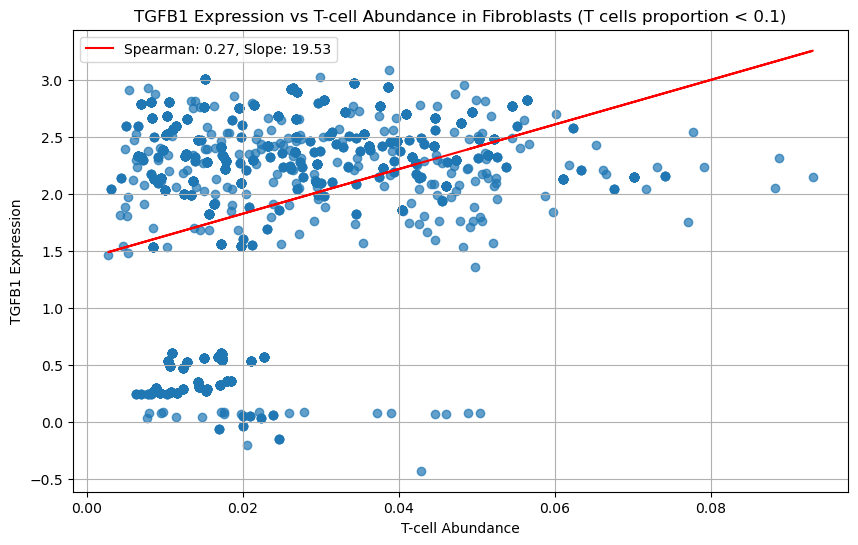

Spearman correlation for TGFB2 vs T-cells: -0.30


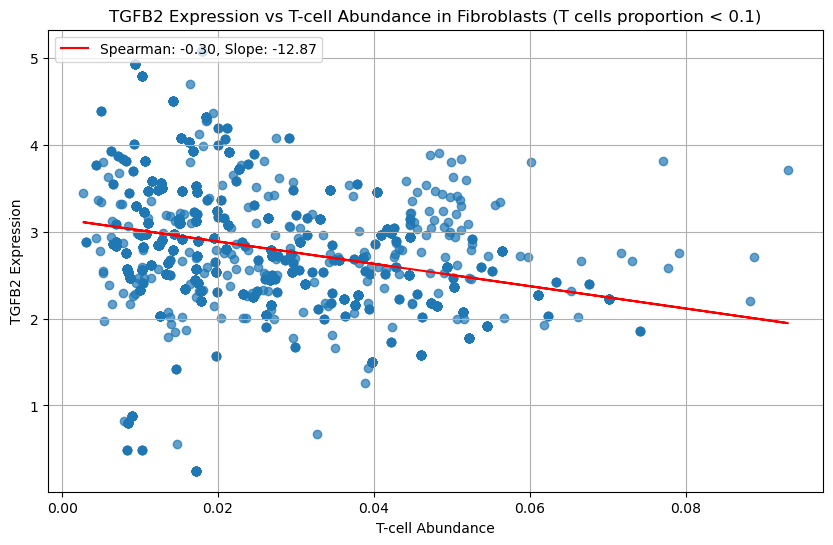

Spearman correlation for TGFB3 vs T-cells: -0.01


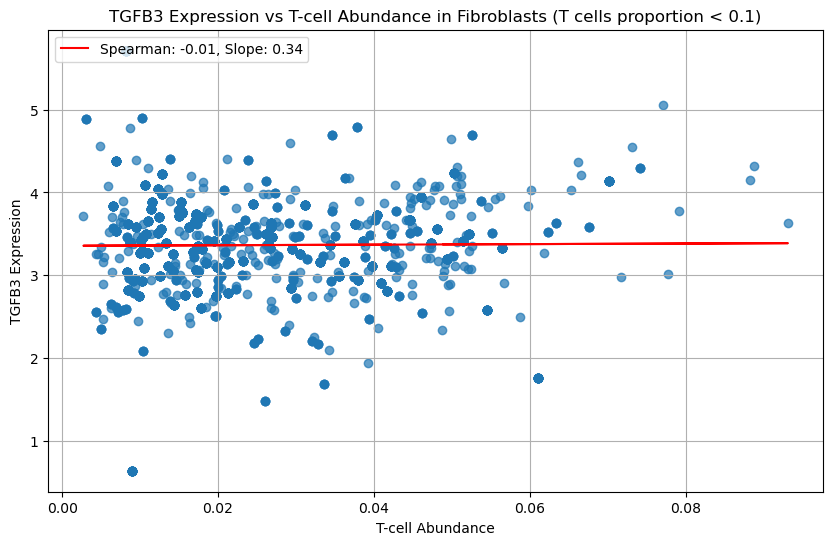

Spearman correlation for TGFBR1 vs T-cells: 0.02


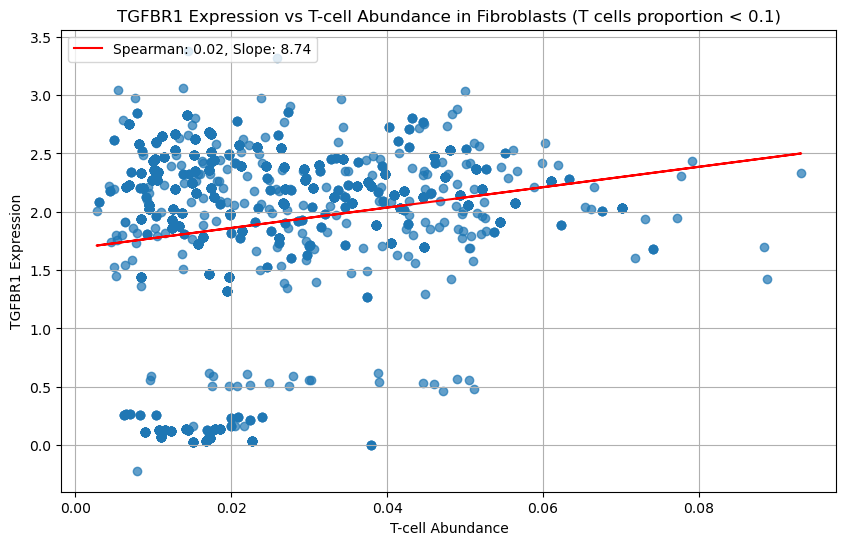

Spearman correlation for TGFBR2 vs T-cells: 0.24


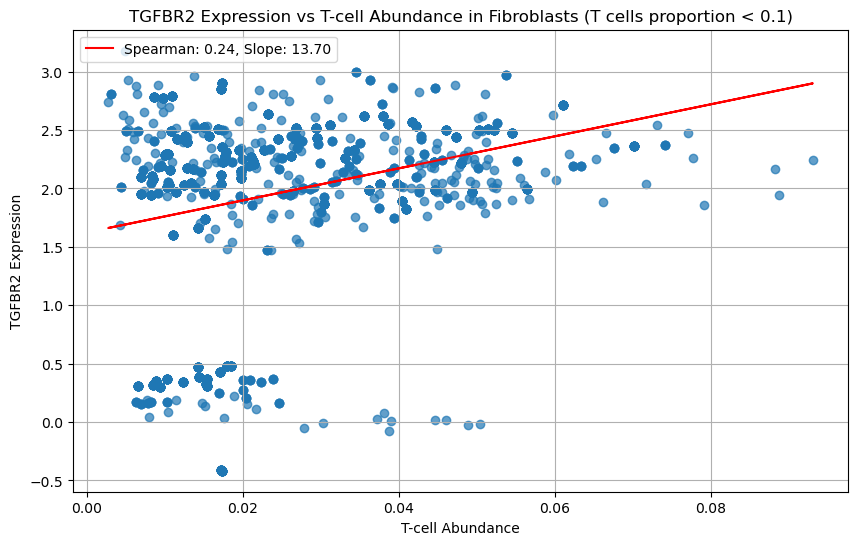

Spearman correlation for TGFBR3 vs T-cells: -0.09


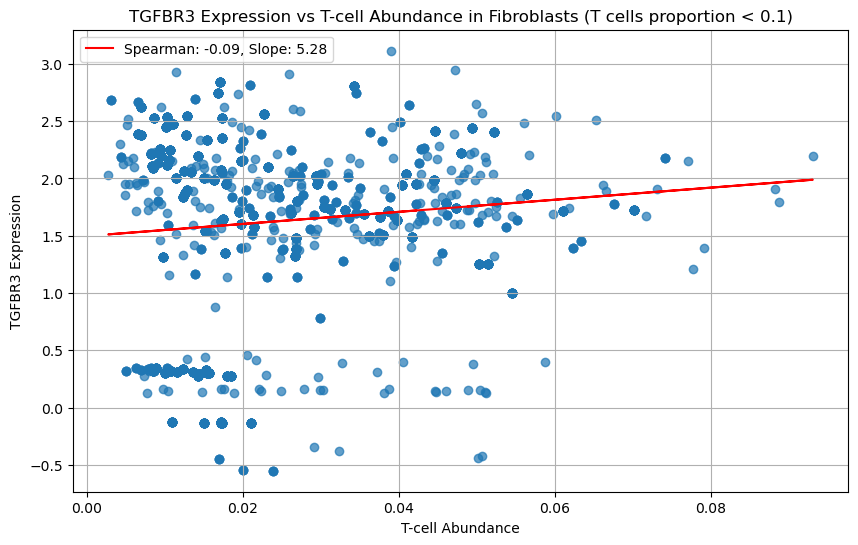

Spearman correlation for IL6 vs T-cells: -0.30


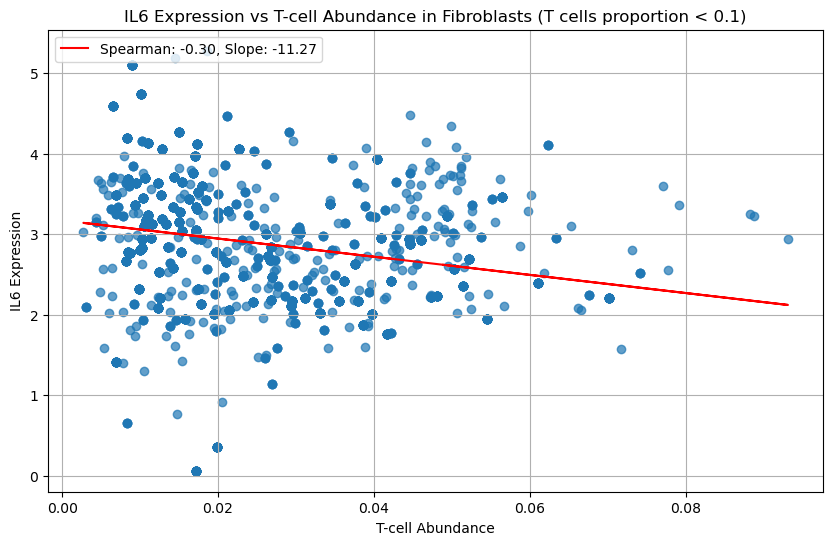

Spearman correlation for IL6R vs T-cells: 0.20


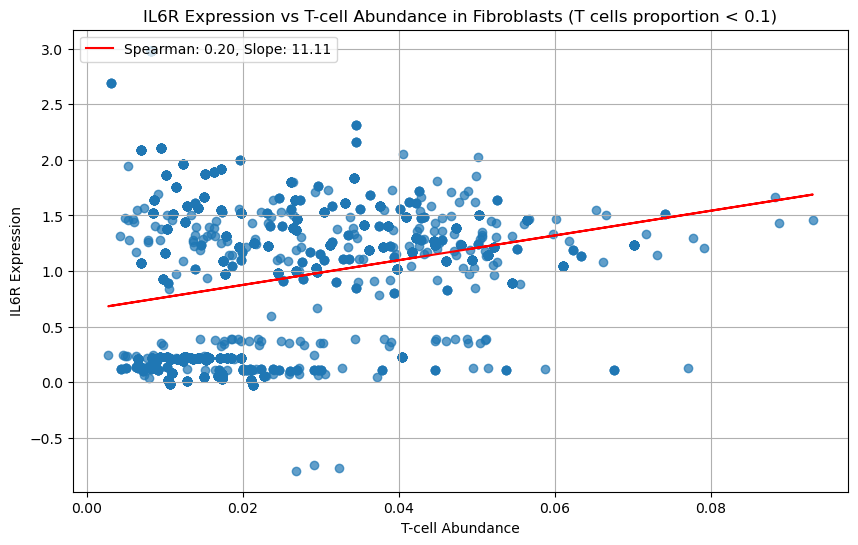

Spearman correlation for IL10RA vs T-cells: 0.33


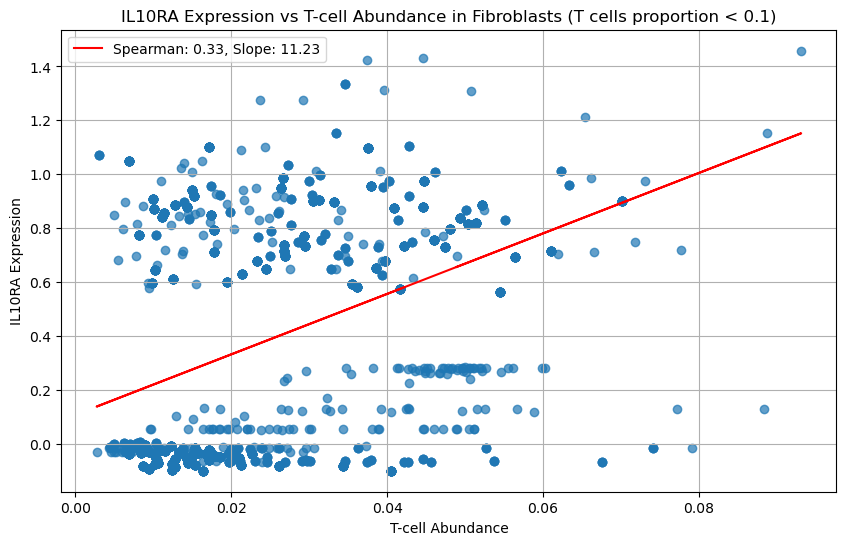

Spearman correlation for IL10RB vs T-cells: 0.11


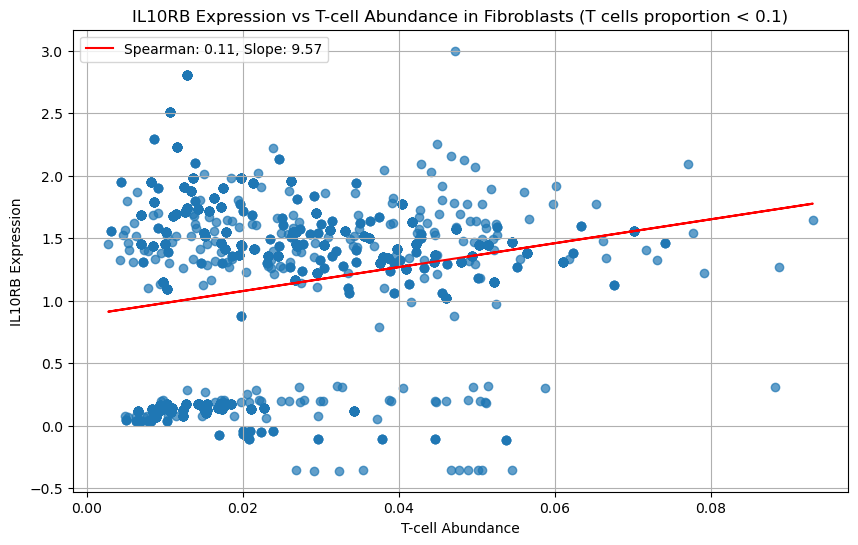

Spearman correlation for CXCL8 vs T-cells: -0.34


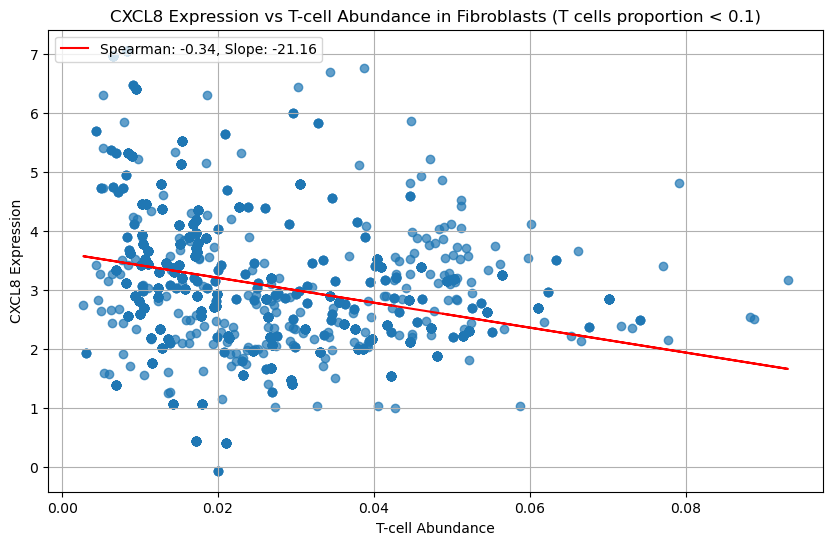

Spearman correlation for CXCL12 vs T-cells: -0.14


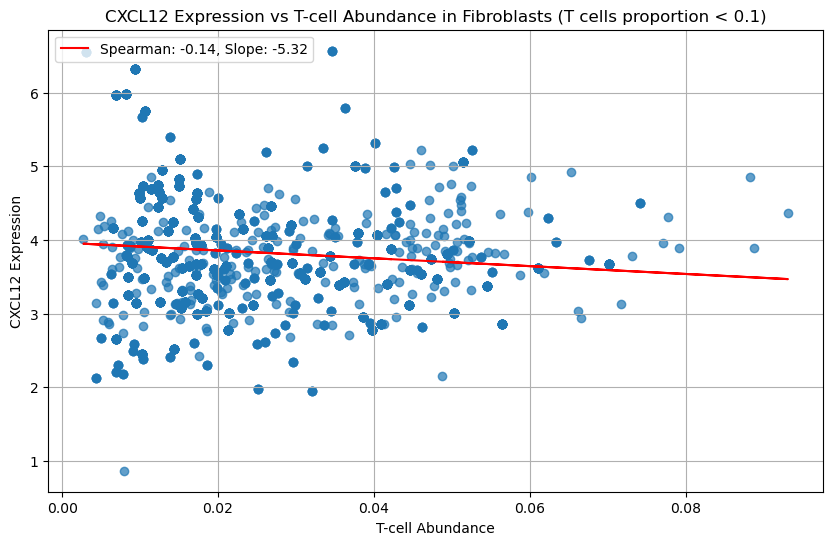

Spearman correlation for CCR5 vs T-cells: 0.11


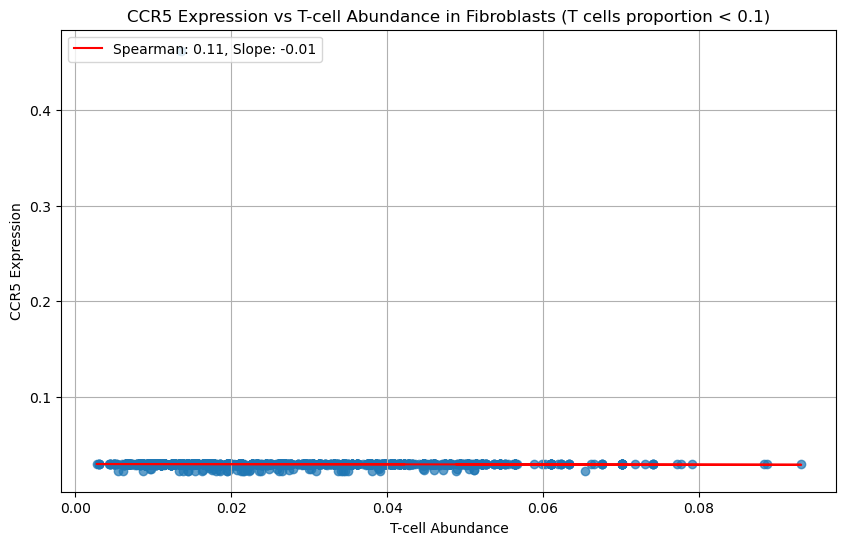

Spearman correlation for CXCR2 vs T-cells: 0.08


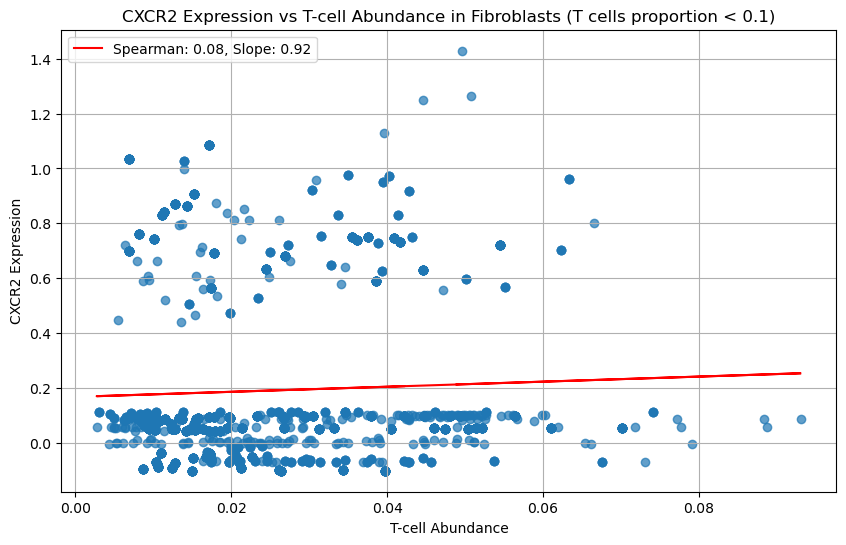

Spearman correlation for CXCR1 vs T-cells: 0.32


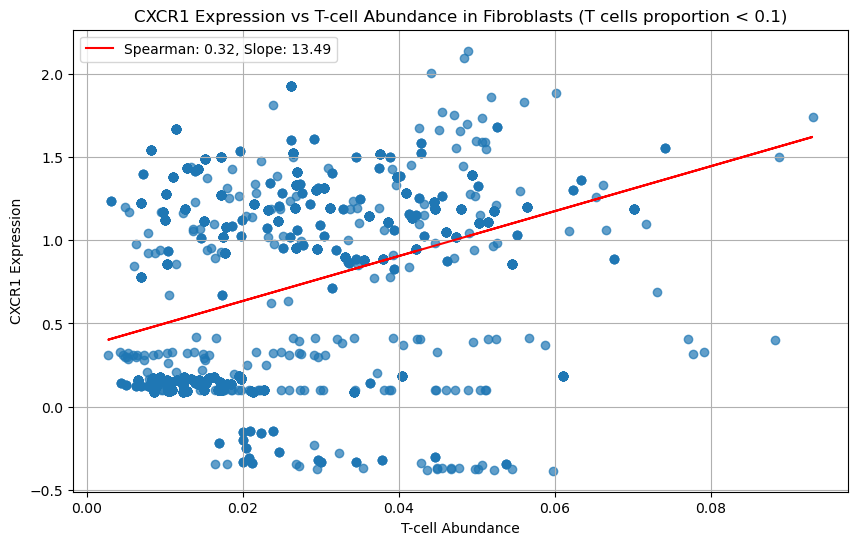

Spearman correlation for CXCR4 vs T-cells: 0.40


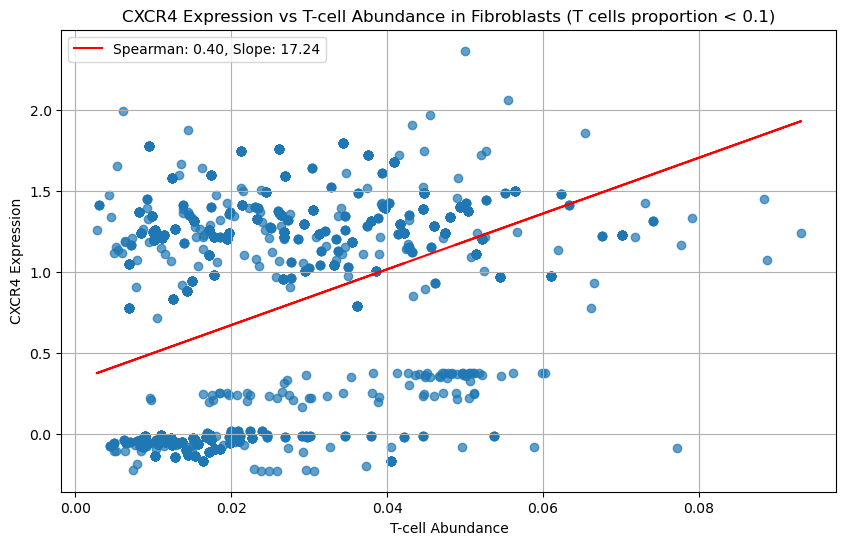

Spearman correlation for CXCL10 vs T-cells: 0.37


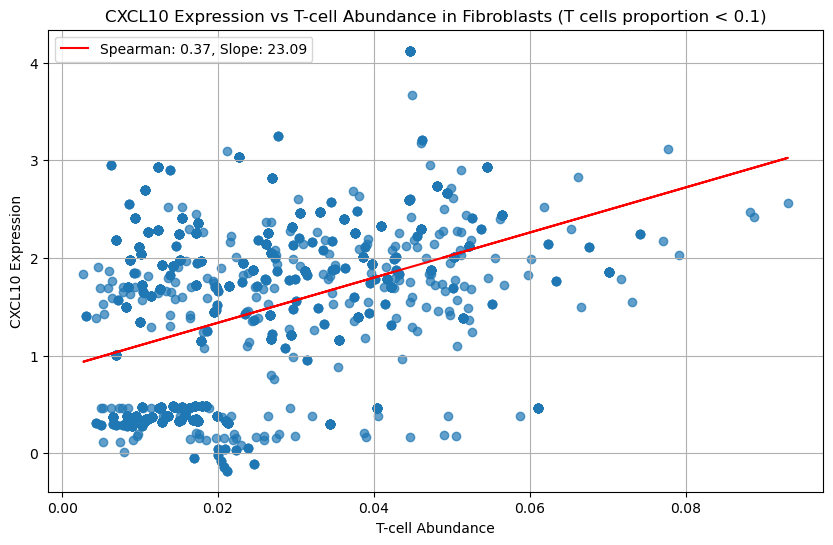

Spearman correlation for CXCL9 vs T-cells: 0.32


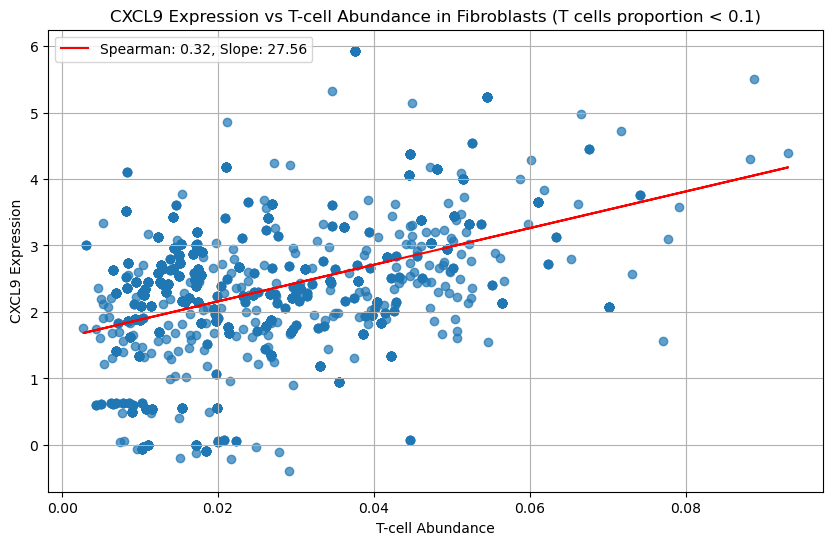

Spearman correlation for HGF vs T-cells: -0.29


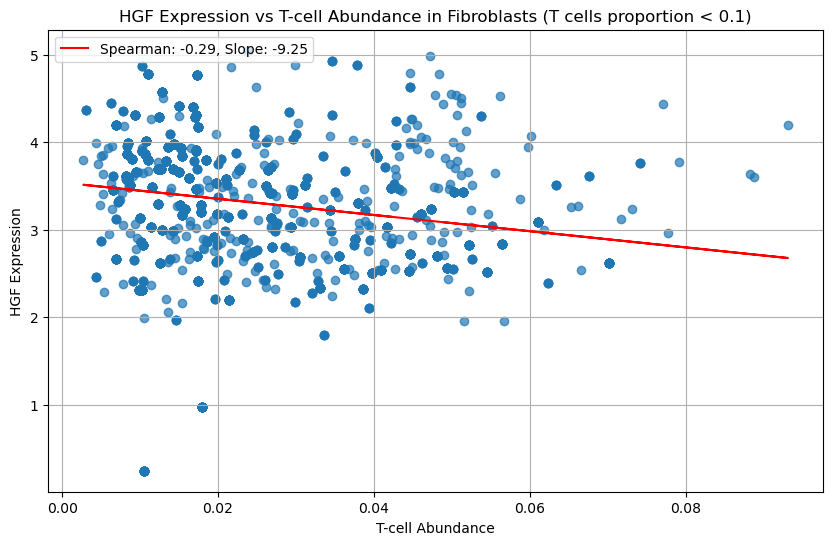

Spearman correlation for MET vs T-cells: 0.15


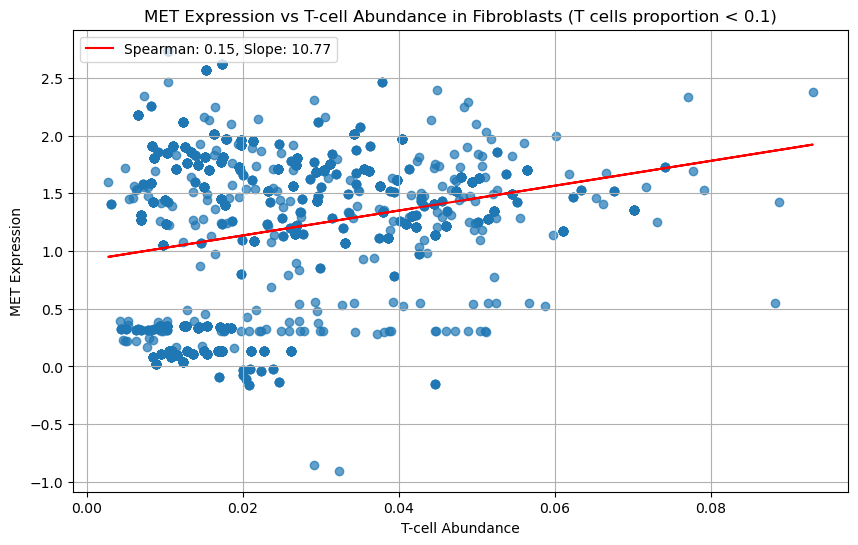

Spearman correlation for FGF1 vs T-cells: 0.13


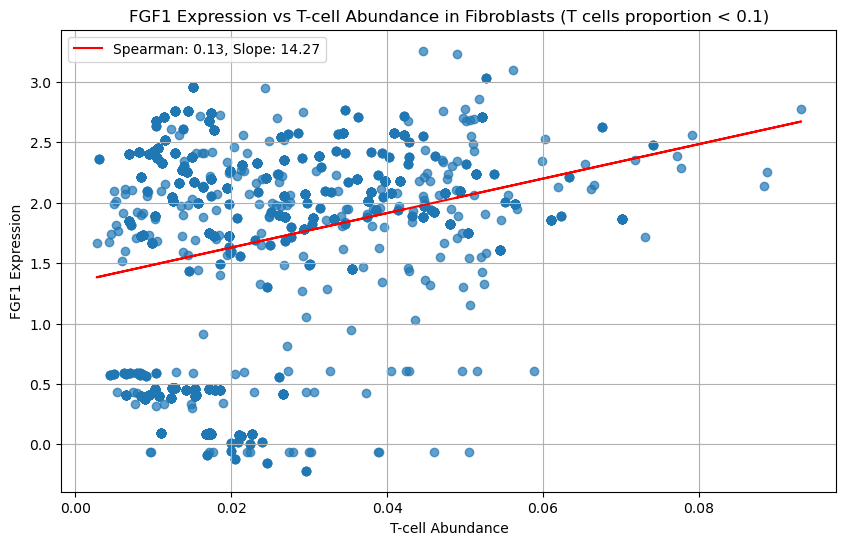

Spearman correlation for FGF2 vs T-cells: 0.08


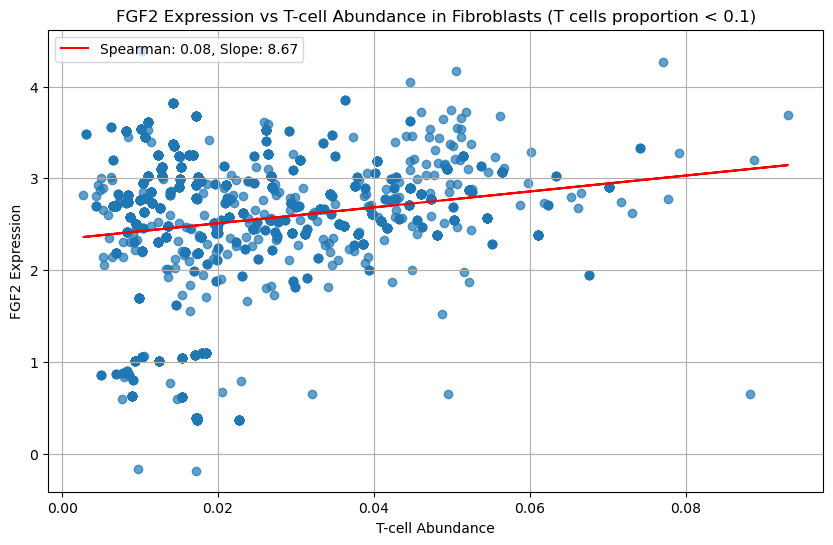

Spearman correlation for FGF7 vs T-cells: -0.10


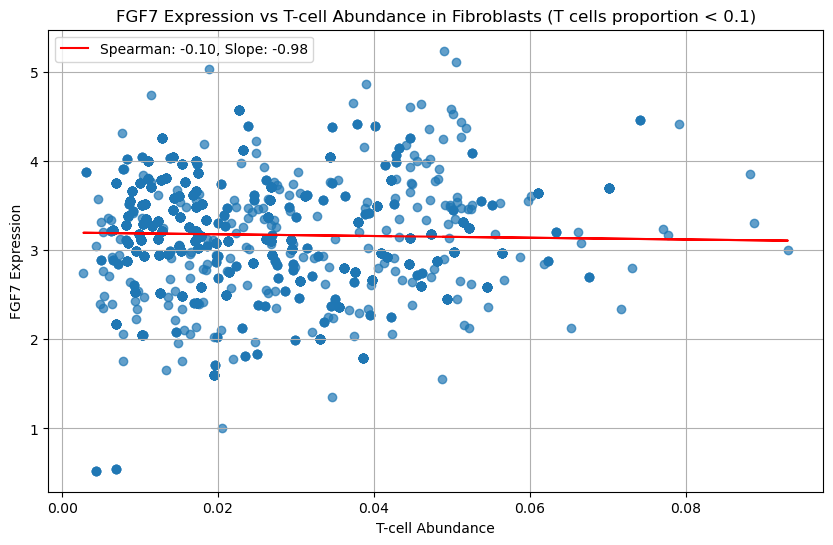

Spearman correlation for FGF10 vs T-cells: -0.42


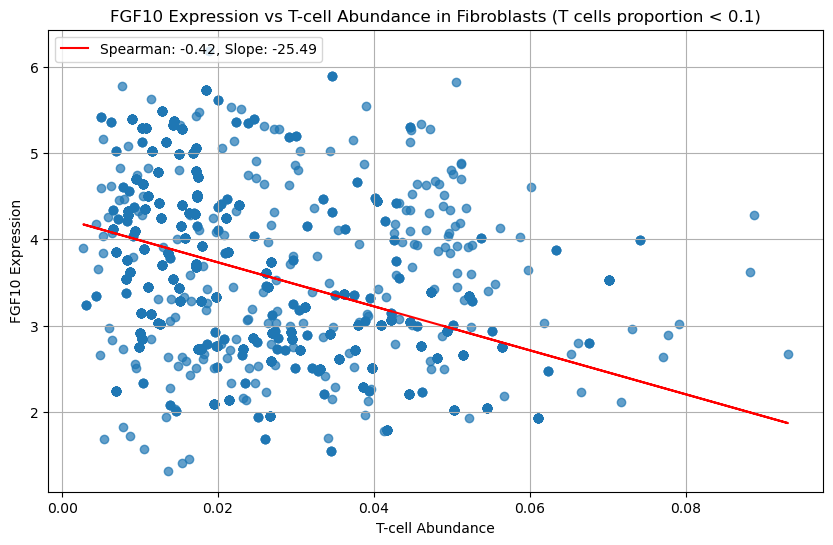

Spearman correlation for FGFR1 vs T-cells: 0.01


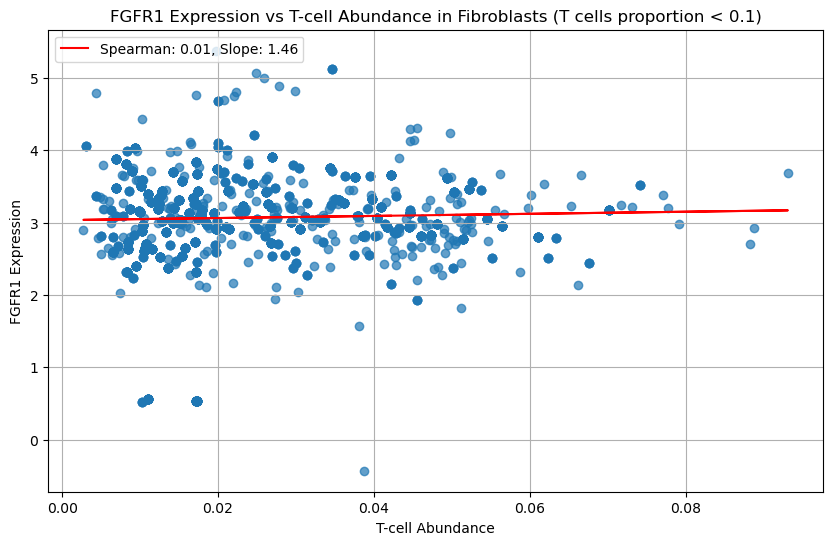

Spearman correlation for FGFR2 vs T-cells: 0.17


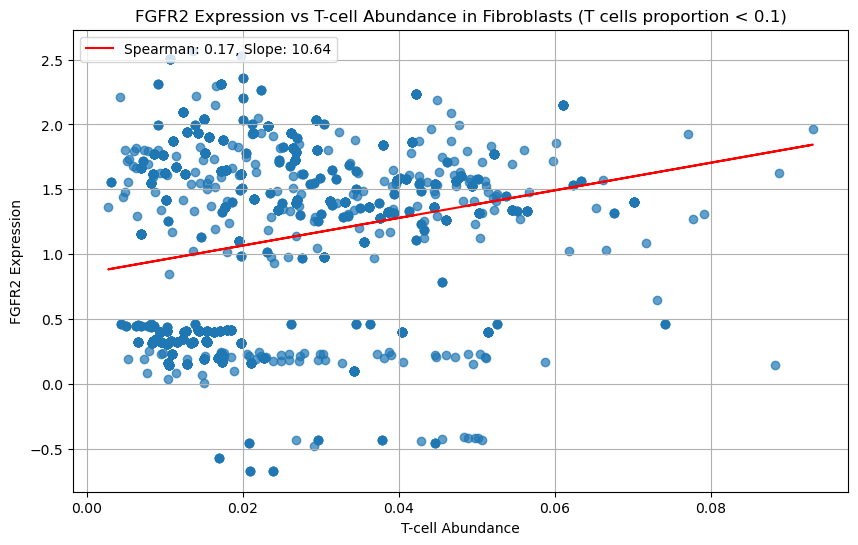

Spearman correlation for FGFR3 vs T-cells: 0.22


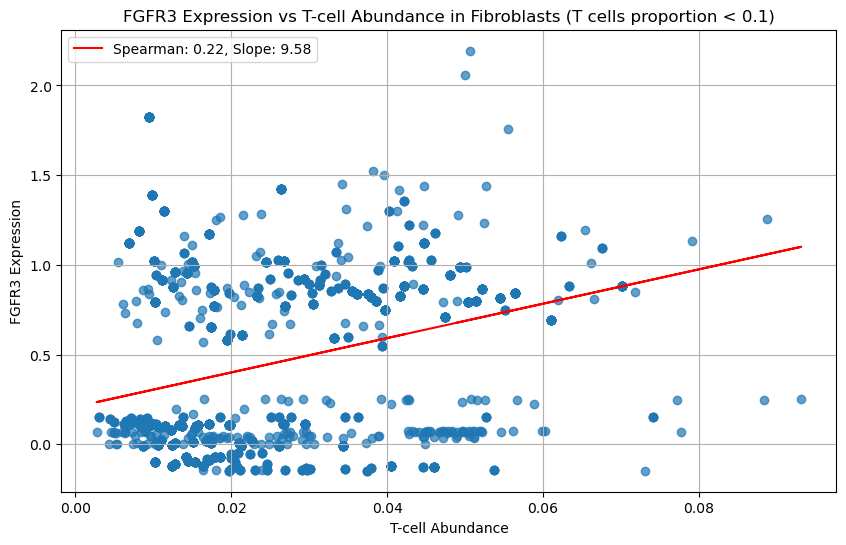

Spearman correlation for FGFR4 vs T-cells: 0.22


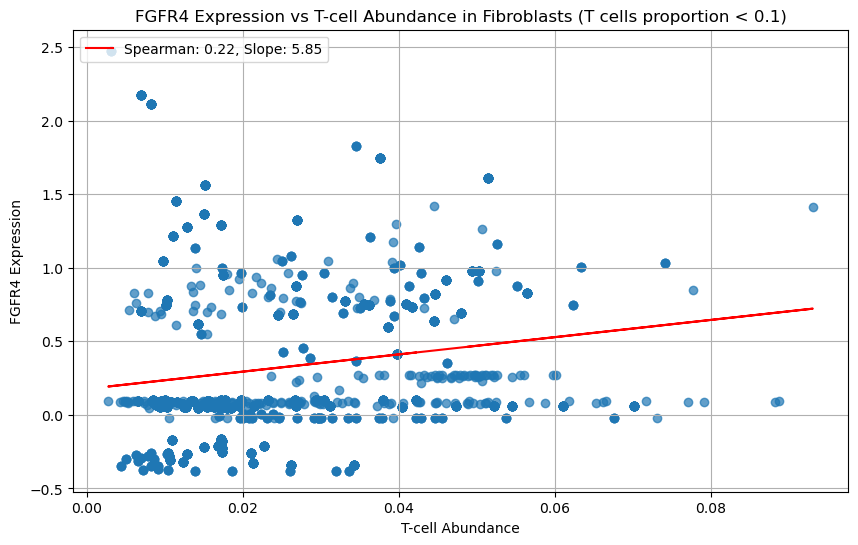

Spearman correlation for IL11 vs T-cells: -0.18


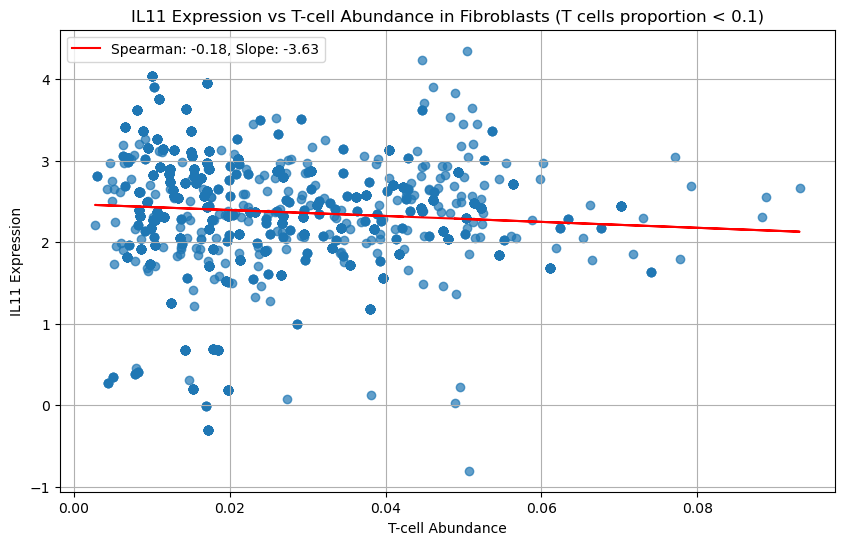

Spearman correlation for HAS1 vs T-cells: -0.05


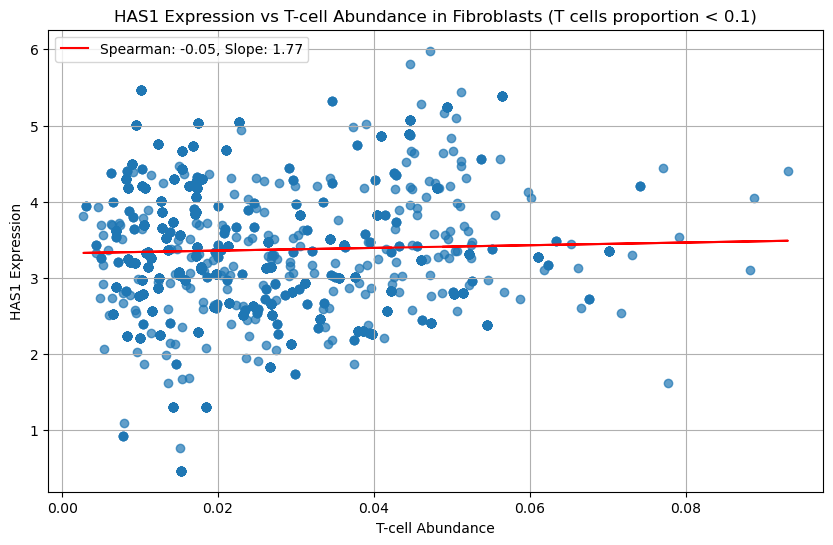

Spearman correlation for HAS2 vs T-cells: -0.12


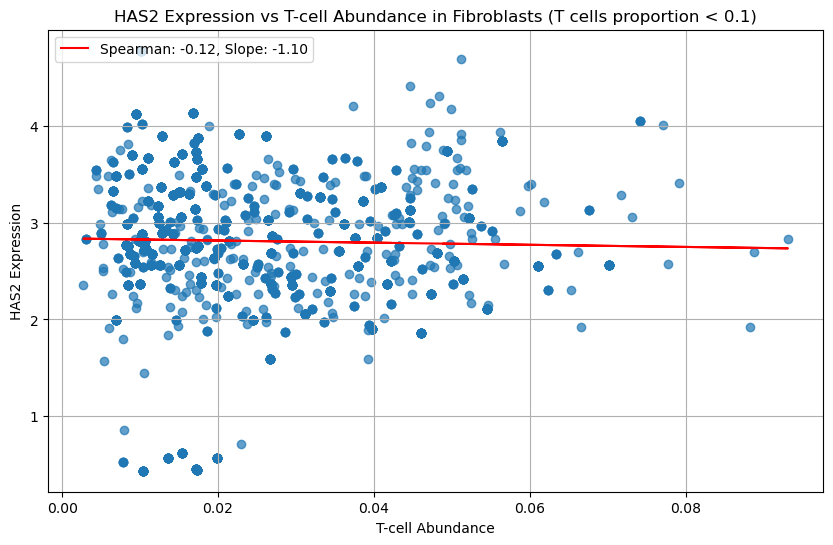

Spearman correlation for HYAL1 vs T-cells: 0.17


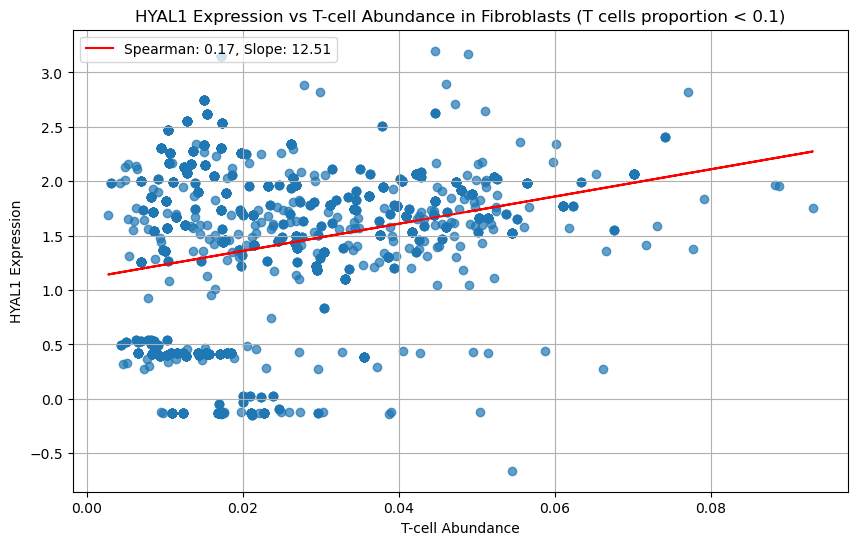

Spearman correlation for HYAL2 vs T-cells: 0.01


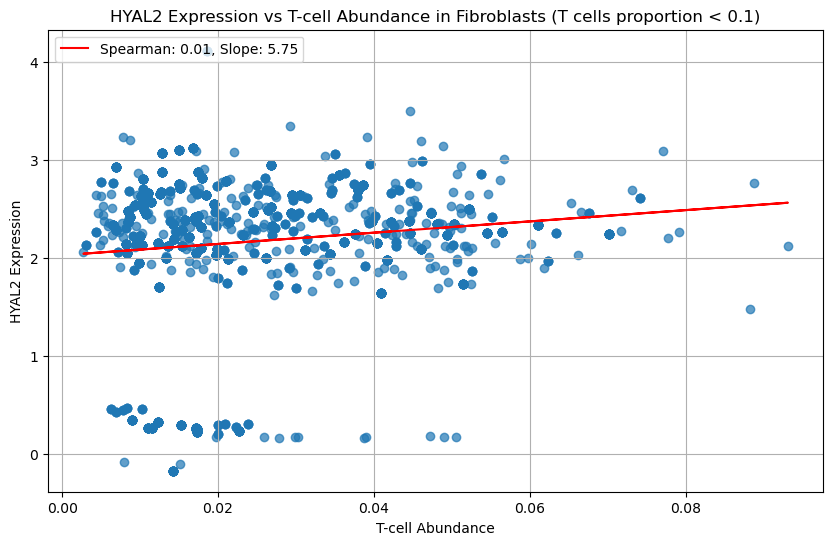

In [27]:
for gene in target_receptors_molecules:
    # Filter rows where T-cell abundance is less than 0.1
    filtered_data = fibr_gene_expression_cell_abundance[fibr_gene_expression_cell_abundance["Tcells"] < 0.1]
    #filtered_data= fibr_gene_expression_cell_abundance_stroma
    # Proceed only if there are enough data points
    if not filtered_data.empty:
        plt.figure(figsize=(10, 6))

        # Scatter plot
        plt.scatter(filtered_data["Tcells"], filtered_data[gene], alpha=0.7)

        # Spearman correlation
        spearman_corr, _ = spearmanr(filtered_data["Tcells"], filtered_data[gene])
        print(f"Spearman correlation for {gene} vs T-cells: {spearman_corr:.2f}")

        # Linear regression
        slope, intercept, _, _, _ = linregress(filtered_data["Tcells"], filtered_data[gene])
        regression_line = slope * filtered_data["Tcells"] + intercept
        plt.plot(filtered_data["Tcells"], regression_line, color='red',
                 label=f'Spearman: {spearman_corr:.2f}, Slope: {slope:.2f}')

        # Plot formatting
        plt.title(f"{gene} Expression vs T-cell Abundance in Fibroblasts (T cells proportion < 0.1)")
        plt.xlabel("T-cell Abundance")
        plt.ylabel(f"{gene} Expression")
        plt.grid()
        plt.legend(loc='upper left')
        plt.show()

In [70]:
rho_matrix = pd.DataFrame(index=cell_types, columns=target_CAFs)
pval_matrix = pd.DataFrame(index=cell_types, columns=target_CAFs)
slope_matrix = pd.DataFrame(index=cell_types, columns=target_CAFs)

for cell in cell_types:
    for gene in target_CAFs:
        filtered = fibr_gene_expression_cell_abundance_stroma[fibr_gene_expression_cell_abundance_stroma[cell] < 0.1]

        if not filtered.empty:
            x = filtered[cell]
            y = filtered[gene]
            if len(x) > 2 and x.nunique() > 1 and y.nunique() > 1:
                # Spearman
                rho, p = spearmanr(x, y)
                rho_matrix.loc[cell, gene] = rho
                pval_matrix.loc[cell, gene] = p
                pvals.append(p)
                cell_gene_pairs.append((cell, gene))

                # Linear regression slope
                slope, _, _, _, _ = linregress(x, y)
                slope_matrix.loc[cell, gene] = slope
            else:
                rho_matrix.loc[cell, gene] = np.nan
                pval_matrix.loc[cell, gene] = np.nan
                slope_matrix.loc[cell, gene] = np.nan
        else:
            rho_matrix.loc[cell, gene] = np.nan
            pval_matrix.loc[cell, gene] = np.nan
            slope_matrix.loc[cell, gene] = np.nan


In [72]:
_, qvals, _, _ = multipletests(pvals, alpha=0.05, method='fdr_bh')

# Create an empty qval matrix
qval_matrix = pd.DataFrame(index=cell_types, columns=target_CAFs)

# Fill it with q-values from corrected results
for idx, (cell, gene) in enumerate(cell_gene_pairs):
    qval_matrix.loc[cell, gene] = qvals[idx]

# Convert to float for consistency
qval_matrix = qval_matrix.astype(float)
annot_stars = pd.DataFrame('', index=qval_matrix.index, columns=qval_matrix.columns)

# Loop through each cell and assign stars based on q-value thresholds
for row in qval_matrix.index:
    for col in qval_matrix.columns:
        q = qval_matrix.loc[row, col]
        if pd.notnull(q):
            if q < 0.001:
                annot_stars.loc[row, col] = '***'
            elif q < 0.01:
                annot_stars.loc[row, col] = '**'
            elif q < 0.05:
                annot_stars.loc[row, col] = '*'

In [73]:
rho_matrix =rho_matrix.astype(float)
rho_matrix = rho_matrix.apply(pd.to_numeric, errors='coerce')

In [74]:
annot_labels = rho_matrix.copy().astype(str)

for row in annot_labels.index:
    for col in annot_labels.columns:
        rho_val = rho_matrix.loc[row, col]
        star = annot_stars.loc[row, col]
        if pd.notnull(rho_val):
            annot_labels.loc[row, col] = f"{rho_val:.2f}{star}"
        else:
            annot_labels.loc[row, col] = ""

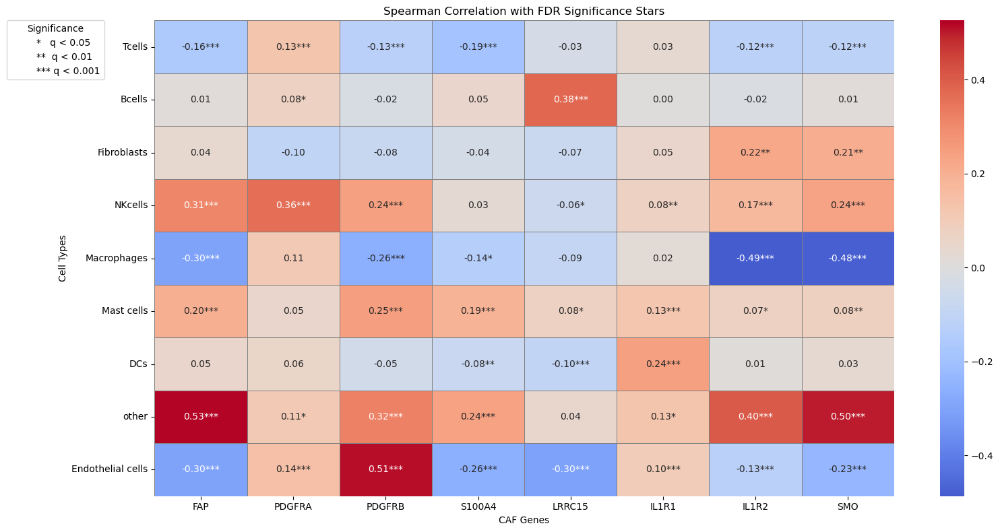

In [ ]:

from matplotlib import patches as mpatches
plt.figure(figsize=(16, 8))
sns.heatmap(rho_matrix, cmap="coolwarm", center=0,
            annot=annot_labels, fmt="", linewidths=0.5, linecolor='gray')
plt.title("Spearman Correlation with FDR Significance Stars")
plt.xlabel("CAF Genes")
plt.ylabel("Cell Types")

legend_elements = [
    mpatches.Patch(facecolor='none', edgecolor='none', label='*   q < 0.05'),
    mpatches.Patch(facecolor='none', edgecolor='none', label='**  q < 0.01'),
    mpatches.Patch(facecolor='none', edgecolor='none', label='*** q < 0.001'),
]
plt.legend(handles=legend_elements, title="Significance", loc='upper left',
           bbox_to_anchor=(-0.2, 1), borderaxespad=0, frameon=True)


plt.tight_layout()
plt.show()


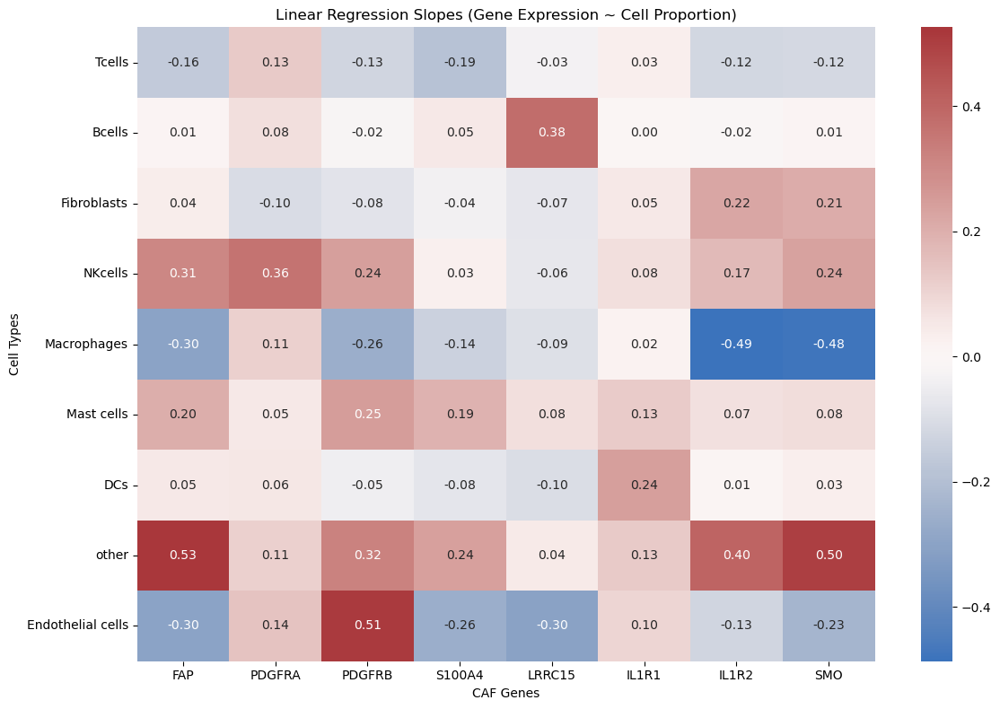

In [41]:
plt.figure(figsize=(12, 8))
sns.heatmap(rho_matrix, cmap='vlag', center=0, annot=True, fmt=".2f")
plt.title("Linear Regression Slopes (Gene Expression ~ Cell Proportion)")
plt.xlabel("CAF Genes")
plt.ylabel("Cell Types")
plt.tight_layout()
plt.show()


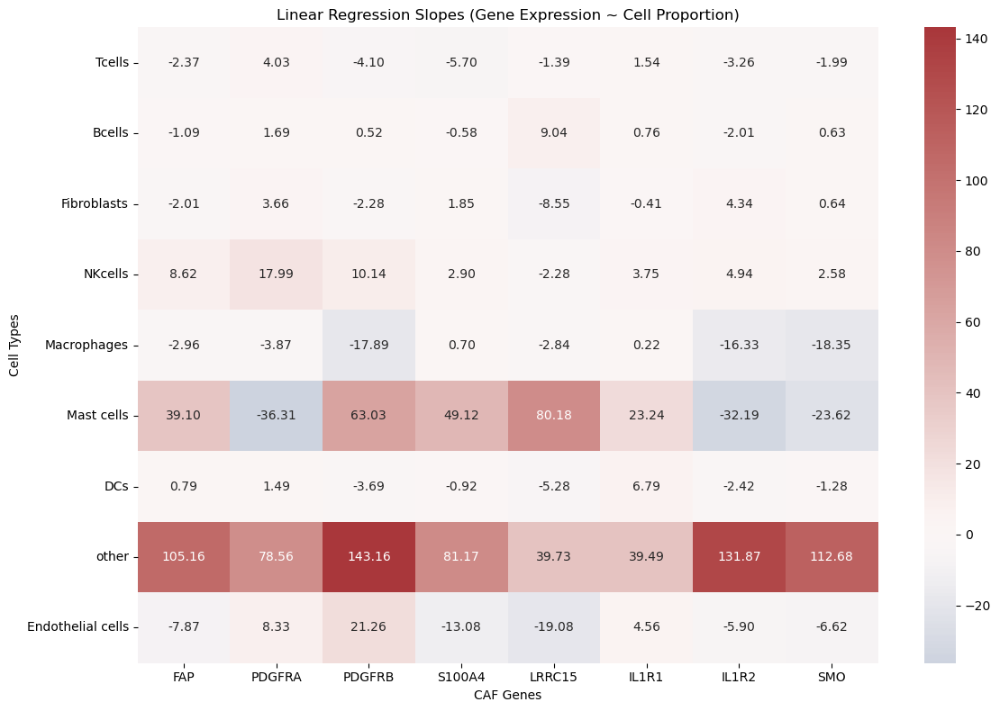

In [34]:
plt.figure(figsize=(12, 8))
sns.heatmap(slope_matrix, cmap='vlag', center=0, annot=True, fmt=".2f")
plt.title("Linear Regression Slopes (Gene Expression ~ Cell Proportion)")
plt.xlabel("CAF Genes")
plt.ylabel("Cell Types")
plt.tight_layout()
plt.show()


In [33]:
slope_matrix = slope_matrix.astype(float)
slope_matrix = slope_matrix.apply(pd.to_numeric, errors='coerce')

In [58]:
rho_matrix_1 = pd.DataFrame(index=cell_types, columns=target_receptors_molecules)
pval_matrix_1 = pd.DataFrame(index=cell_types, columns=target_receptors_molecules)
slope_matrix_1 = pd.DataFrame(index=cell_types, columns=target_receptors_molecules)

pvals = []
cell_gene_pairs = []

for cell in cell_types:
    for gene in target_receptors_molecules:
        filtered = fibr_gene_expression_cell_abundance_stroma[fibr_gene_expression_cell_abundance_stroma[cell] < 0.1]

        if not filtered.empty:
            x = filtered[cell]
            y = filtered[gene]
            if len(x) > 2 and x.nunique() > 1 and y.nunique() > 1:
                rho, p = spearmanr(x, y)
                rho_matrix_1.loc[cell, gene] = rho
                pval_matrix_1.loc[cell, gene] = p
                pvals.append(p)
                cell_gene_pairs.append((cell, gene))

                slope, _, _, _, _ = linregress(x, y)
                slope_matrix_1.loc[cell, gene] = slope
            else:
                rho_matrix_1.loc[cell, gene] = np.nan
                pval_matrix_1.loc[cell, gene] = np.nan
                slope_matrix_1.loc[cell, gene] = np.nan
        else:
            rho_matrix_1.loc[cell, gene] = np.nan
            pval_matrix_1.loc[cell, gene] = np.nan
            slope_matrix_1.loc[cell, gene] = np.nan

# FDR correction
_, qvals, _, _ = multipletests(pvals, alpha=0.05, method='fdr_bh')

qval_matrix_1 = pd.DataFrame(index=cell_types, columns=target_receptors_molecules)

for idx, (cell, gene) in enumerate(cell_gene_pairs):
    qval_matrix_1.loc[cell, gene] = qvals[idx]

qval_matrix_1 = qval_matrix_1.astype(float)

# Add significance stars
annot_stars_1 = pd.DataFrame('', index=qval_matrix_1.index, columns=qval_matrix_1.columns)

for row in qval_matrix_1.index:
    for col in qval_matrix_1.columns:
        q = qval_matrix_1.loc[row, col]
        if pd.notnull(q):
            if q < 0.001:
                annot_stars_1.loc[row, col] = '***'
            elif q < 0.01:
                annot_stars_1.loc[row, col] = '**'
            elif q < 0.05:
                annot_stars_1.loc[row, col] = '*'

# Combine Spearman rho and stars for annotation
annot_labels_1 = rho_matrix_1.copy().astype(str)

for row in annot_labels_1.index:
    for col in annot_labels_1.columns:
        rho_val = rho_matrix_1.loc[row, col]
        star = annot_stars_1.loc[row, col]
        if pd.notnull(rho_val):
            annot_labels_1.loc[row, col] = f"{rho_val:.2f}{star}"
        else:
            annot_labels_1.loc[row, col] = ""


In [60]:
rho_matrix_1 = rho_matrix_1.astype(float)

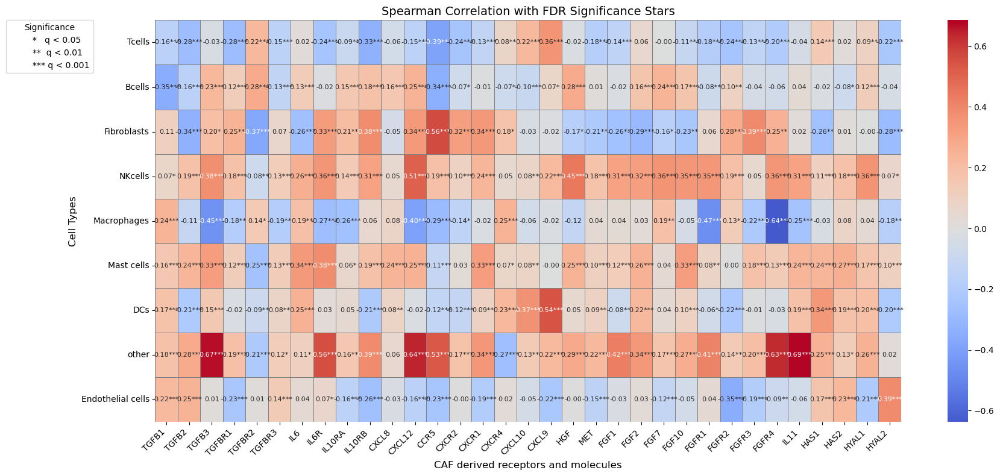

In [68]:
import matplotlib.patches as mpatches

plt.figure(figsize=(18, 8))
sns.heatmap(
    rho_matrix_1,
    cmap="coolwarm",
    center=0,
    annot=annot_labels_1,
    fmt="",
    annot_kws={"size": 8},  # Smaller text size
    linewidths=0.5,
    linecolor='gray'
)
plt.title("Spearman Correlation with FDR Significance Stars", fontsize=14)
plt.xlabel("CAF derived receptors and molecules", fontsize=12)
plt.ylabel("Cell Types", fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for readability
plt.yticks(rotation=0)
# Create a custom legend for stars
legend_elements = [
    mpatches.Patch(facecolor='none', edgecolor='none', label='*   q < 0.05'),
    mpatches.Patch(facecolor='none', edgecolor='none', label='**  q < 0.01'),
    mpatches.Patch(facecolor='none', edgecolor='none', label='*** q < 0.001'),
]
plt.legend(handles=legend_elements, title="Significance", loc='upper left',
           bbox_to_anchor=(-0.2, 1), borderaxespad=0, frameon=True)

plt.tight_layout()
plt.show()
